In [1]:
import adclasses
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import joblib
from datetime import timedelta
import os
import warnings
warnings.filterwarnings('ignore')

Using TensorFlow backend.
/home/cfreeman/Documents/NextIT/adclasses2/adclasses2_venv/lib/python3.5/site-packages/tensorflow/python/framework/ops.py:939: DeprecationWarning: builtin type EagerTensor has no __module__ attribute
  EagerTensor = c_api.TFE_Py_InitEagerTensor(_EagerTensorBase)
/home/cfreeman/Documents/NextIT/adclasses2/adclasses2_venv/lib/python3.5/site-packages/tensorflow/python/util/tf_inspect.py:55: DeprecationWarning: inspect.getargspec() is deprecated, use inspect.signature() instead
  if d.decorator_argspec is not None), _inspect.getargspec(target))


In [2]:
dataset_name_list = ["grok_asg_anomaly", 
                     "rds_cpu_utilization_cc0c53", 
                     "rds_cpu_utilization_e47b3b",
                     "art_daily_flatmiddle",
                     "ec2_cpu_utilization_5f5533",
                     "ec2_cpu_utilization_ac20cd",
                     "art_daily_nojump",
                     "artificial_cd_1",
                     "artificial_cd_2",
                     "artificial_cd_3"]
true_outlier_indices_dict = {}
ad_dict = {}

# grok_asg_anomaly

In [3]:
dataset_name = "grok_asg_anomaly"

path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)
data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, timestep="5min", dateformat="%Y-%m-%d %H:%M:%S", name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-01-20 08:30:00",
                      "2014-01-21 10:45:00",
                      "2014-01-29 00:45:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-01-16 00:00:00
End date:  2014-02-01 01:00:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  4621
Time step size:  5min
Start Date:  2014-01-16 00:00:00
End Date:  2014-02-01 01:00:00
Date Format:  %Y-%m-%d %H:%M:%S


# rds_cpu_utilization_cc0c53

In [4]:
dataset_name = "rds_cpu_utilization_cc0c53"

path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)
data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, '5min', data))

# if you want to use a method that cannot take missing time steps
# into account, you need to fill in the missing time steps yourself
# this function also removes duplicates
print("Fill Missing Time Steps with Interpolation")
data = adclasses.fill_missing_time_steps(start_date, end_date, '5min', data, method="linear")

data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")
ad = adclasses.UnivariateAnomalyDetection(dataframe=data, timestep="5min", dateformat="%Y-%m-%d %H:%M:%S", name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-02-25 07:15:00",
                      "2014-02-27 00:50:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-02-14 14:30:00
End date:  2014-02-28 14:30:00
Missing time stamps: 
 DatetimeIndex(['2014-02-25 07:10:00'], dtype='datetime64[ns]', freq='5T')
Fill Missing Time Steps with Interpolation
Length:  4033
Time step size:  5min
Date Format:  %Y-%m-%d %H:%M:%S


# rds_cpu_utilization_e47b3b

In [5]:
dataset_name = "rds_cpu_utilization_e47b3b"

path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)
data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, '5min', data))

data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")
ad = adclasses.UnivariateAnomalyDetection(dataframe=data, timestep="5min", dateformat="%Y-%m-%d %H:%M:%S", name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-13 06:52:00",
                      "2014-04-18 23:37:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-04-10 00:02:00
End date:  2014-04-23 23:57:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  4032
Time step size:  5min
Date Format:  %Y-%m-%d %H:%M:%S


# art_daily_flatmiddle

In [6]:
dataset_name = "art_daily_flatmiddle"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-11 00:00:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-04-01 00:00:00
End date:  2014-04-14 23:55:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  4032
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-14 23:55:00
Date Format:  %Y-%m-%d %H:%M:%S


# ec2_cpu_utilization_5f5533

In [7]:
dataset_name = "ec2_cpu_utilization_5f5533"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-02-14 14:27:00
End date:  2014-02-28 14:22:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  4032
Time step size:  5min
Start Date:  2014-02-14 14:27:00
End Date:  2014-02-28 14:22:00
Date Format:  %Y-%m-%d %H:%M:%S


# ec2_cpu_utilization_ac20cd

In [8]:
dataset_name = "ec2_cpu_utilization_ac20cd"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

# if you want to use a method that cannot take missing time steps
# into account, you need to fill in the missing time steps yourself
# this function also removes duplicates
print("Fill Missing Time Steps with Interpolation")
data = adclasses.fill_missing_time_steps(start_date, end_date, '5min', data, method="linear")

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-15 00:49:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-04-02 14:29:00
End date:  2014-04-16 14:49:00
Missing time stamps: 
 DatetimeIndex(['2014-04-07 13:39:00', '2014-04-07 13:44:00',
               '2014-04-14 23:49:00', '2014-04-14 23:54:00',
               '2014-04-14 23:59:00'],
              dtype='datetime64[ns]', freq=None)
Fill Missing Time Steps with Interpolation
Length:  4037
Time step size:  5min
Start Date:  2014-04-02 14:29:00
End Date:  2014-04-16 14:49:00
Date Format:  %Y-%m-%d %H:%M:%S


# art_daily_nojump

In [9]:
dataset_name = "art_daily_nojump"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-11 09:00:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-04-01 00:00:00
End date:  2014-04-14 23:55:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  4032
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-14 23:55:00
Date Format:  %Y-%m-%d %H:%M:%S


# artificial cd dataset 1

In [10]:
dataset_name = "artificial_cd_1"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-04-01 00:00:00
End date:  2014-04-03 18:35:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  800
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-03 18:35:00
Date Format:  %Y-%m-%d %H:%M:%S


# artificial cd dataset 2

In [11]:
dataset_name = "artificial_cd_2"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-04-01 00:00:00
End date:  2014-04-07 05:55:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  1800
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-07 05:55:00
Date Format:  %Y-%m-%d %H:%M:%S


# artificial cd dataset 3

In [12]:
dataset_name = "artificial_cd_3"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))


ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-04-01 00:00:00
End date:  2014-04-04 11:15:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  1000
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-04 11:15:00
Date Format:  %Y-%m-%d %H:%M:%S


In [13]:
weight_fp_list = []
for i in range(1,11):
    weight_fp_list.append(i/10)
print(weight_fp_list)

[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]


# SARIMA Results

In [14]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_sarima = joblib.load("anomaly_scores/SARIMA_all/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_sarima["Anomaly Scores"]

In [15]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.2: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.3: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.4: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.5: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.6: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.7: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.8: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.9: {'precision': 0.1111111111111111, 'recall': 1.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  13.600000000000001
Best window threshold:  0.9973
Corresponding window overall precision:  0.14465408805031446
Corresponding window overall recall:  0.8518518518518519
Corresponding window overall F score:  0.24731182795698925



--- artificial_cd_3 ---
Corresponding window precision:  0.36363636363636365
Corresponding window recall:  1.0
Corresponding window false positives:  7
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [201, 203, 208, 210, 211, 213, 214, 215, 226, 227, 233, 234, 243, 400, 404, 406, 408, 409, 411, 415, 417, 421, 426, 429, 435, 438, 446, 451, 453, 600, 601, 605, 606, 608, 609, 611, 612, 613, 616, 618, 621, 623, 626, 627, 628, 631, 632, 635, 640, 644, 647, 651, 652, 654, 655, 818, 819, 820, 821, 827, 834, 836, 852, 855]


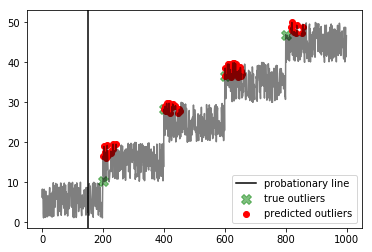




--- artificial_cd_1 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [200, 201, 203, 217, 219, 220, 229, 230, 235, 236, 238, 243, 331, 731]


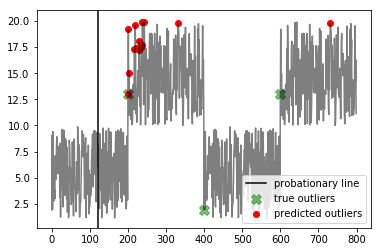




--- grok_asg_anomaly ---
Corresponding window precision:  0.13636363636363635
Corresponding window recall:  1.0
Corresponding window false positives:  19
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [772, 773, 830, 831, 832, 855, 857, 860, 861, 862, 873, 874, 876, 877, 901, 905, 953, 954, 955, 956, 966, 967, 968, 1002, 1026, 1032, 1034, 1035, 1038, 1048, 1089, 1095, 1097, 1134, 1135, 1200, 1201, 1212, 1237, 1569, 1915, 2131, 2133, 2258, 2260, 2331, 2459, 2482, 2507, 2583, 2605, 2644, 2665, 2685, 2705, 2727, 2744, 2762, 2786, 2804, 2809, 2821, 2824, 2825, 2843, 2858, 2884, 2906, 2921, 2939, 2946, 3069, 3158, 3179, 3203, 3223, 3257, 3269, 3303, 3320, 3335, 3355, 3378, 3407, 3452, 3477, 3500, 3522, 3543, 3563, 3575, 3583, 3603, 3633, 3662, 3684, 3700, 3708, 3725, 3736, 3752, 3753, 3754, 3755, 3774, 3798, 3822, 3845, 3869, 3892, 3916, 3964, 3988, 4012, 4036, 4083, 4106, 4129, 4174, 4197, 4219, 4289, 4424, 4425, 4427]


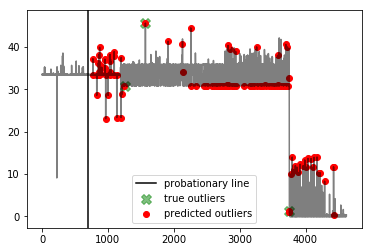




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 815, 861, 946, 947, 948, 949, 950, 951, 952, 953, 954, 955, 1480, 1535, 1823, 1950, 2399, 2543, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2598, 2600, 2606, 2608, 2619, 2641, 2924, 2975, 3446, 3480, 3503, 3551, 3593, 3594, 3595, 3596, 3597, 3598, 3600, 3601, 3839]


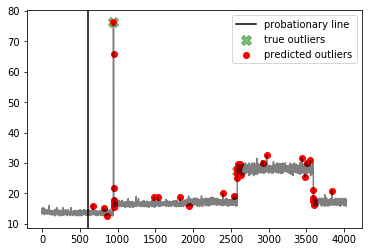




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.11764705882352941
Corresponding window recall:  1.0
Corresponding window false positives:  15
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [620, 621, 683, 708, 718, 785, 920, 962, 972, 992, 1006, 1014, 1043, 1208, 1235, 1269, 1279, 1283, 1309, 1353, 1361, 1362, 1363, 1404, 1472, 1498, 1534, 1561, 1569, 1580, 1591, 1722, 1798, 1808, 1818, 1832, 1845, 1862, 1873, 1880, 1937, 2011, 2050, 2064, 2082, 2088, 2096, 2142, 2208, 2358, 2378, 2426, 2438, 2445, 2456, 2513, 2595, 2626, 2650, 2663, 2678, 2801, 2894, 2900, 2924, 2927, 2940, 2971, 2990, 2996, 3008, 3032, 3080, 3081, 3082, 3083, 3086, 3088, 3089, 3095, 3108, 3109, 3111, 3112, 3128, 3130, 3132, 3148, 3154, 3420, 3463, 3580, 3581, 3669, 3889, 3939, 3953, 4023]


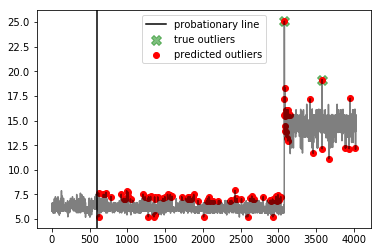




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.125
Corresponding window recall:  1.0
Corresponding window false positives:  7
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1197, 1467, 1597, 1775, 1882, 1980, 1999, 2217, 2338, 2388, 2435, 2541, 2670, 2671, 3032, 3121, 3258, 3425, 3567, 3568, 3569, 3572, 3573, 3580, 3581, 3582, 3583, 3584, 3860, 3864, 3874, 3877, 3967, 3987, 4027]


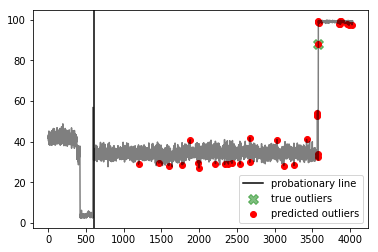




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  8
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [684, 792, 972, 1063, 1080, 1260, 1261, 1273, 1368, 1369, 1548, 1656, 1836, 1837, 1944, 1945, 2124, 2232, 2412, 2413, 2520, 2700, 2808, 3276, 3277, 3278, 3279, 3284, 3286, 3288, 3290, 3294, 3295, 3298, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3309, 3311, 3314, 3315, 3317, 3323, 3324, 3325, 3327, 3328, 3329, 3333, 3334, 3336, 3344, 3346, 3347, 3348, 3349, 3350, 3353, 3354, 3362, 3384, 3564, 3634, 3672, 3852, 3960]


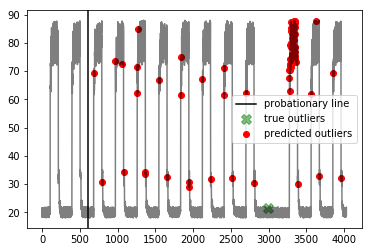




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  10
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [644, 885, 918, 1194, 1218, 1270, 1271, 1878, 1974, 2046, 2442, 2802, 2930, 2938, 2969, 2970, 3287, 3390, 3668, 3860]


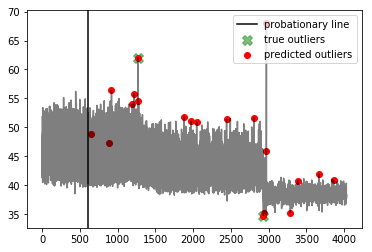




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.75
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [400, 601, 800, 801, 802, 1000, 1001, 1002, 1400, 1601]


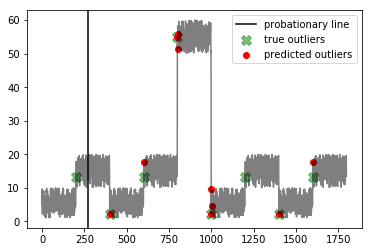




--- art_daily_flatmiddle ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [684, 792, 972, 984, 1080, 1260, 1368, 1548, 1656, 1836, 1944, 2124, 2232, 2412, 2424, 2520, 2700, 2808, 2880, 3156, 3276, 3384, 3564, 3672, 3852, 3960]


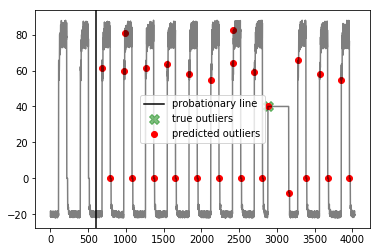

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.200000000000003
Best window threshold:  0.9999
Corresponding window overall precision:  0.18888888888888888
Corresponding window overall recall:  0.6296296296296297
Corresponding window overall F score:  0.29059829059829057



--- artificial_cd_3 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.25
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [201, 203, 208, 214]


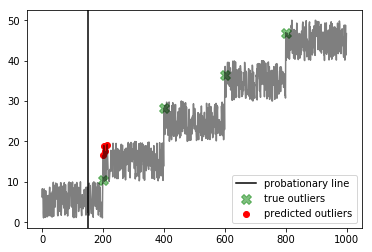




--- artificial_cd_1 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [201, 219]


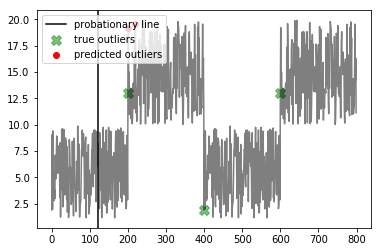




--- grok_asg_anomaly ---
Corresponding window precision:  0.15384615384615385
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  11
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [772, 773, 830, 831, 855, 860, 873, 874, 876, 954, 966, 967, 1002, 1026, 1032, 1134, 1200, 1201, 1569, 1915, 2258, 2804, 2825, 2921, 3257, 3603, 3700, 3753, 3754, 3755, 3798, 3845, 4036, 4083, 4106, 4129, 4174, 4219, 4424]


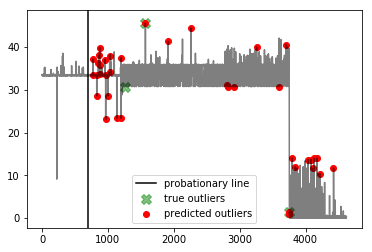




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 950, 951, 952, 953, 954, 1823, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2593, 2594, 2606, 2975, 3593, 3594, 3595, 3596, 3597, 3598, 3600]


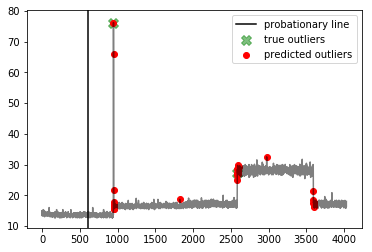




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [620, 718, 920, 992, 1006, 1208, 1808, 1832, 1880, 2426, 2456, 2996, 3032, 3080, 3081, 3082, 3086, 3089, 3108, 3111, 3130, 3580, 3581, 3669]


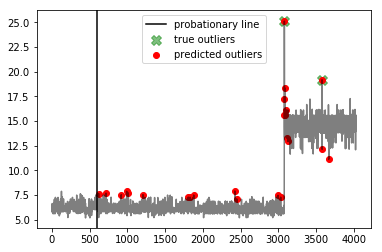




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1999, 2338, 3567, 3568, 3572, 3573, 3580, 3581, 3582, 3583]


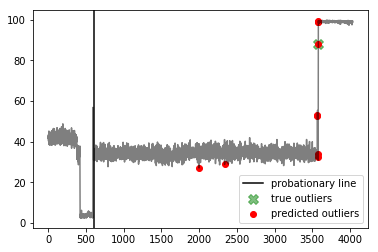




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  8
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [684, 792, 972, 1080, 1260, 1261, 1368, 1548, 1656, 1836, 1837, 1944, 2124, 2232, 2412, 2520, 2700, 2808, 3276, 3277, 3284, 3286, 3288, 3290, 3294, 3295, 3298, 3301, 3302, 3303, 3306, 3307, 3309, 3314, 3317, 3323, 3324, 3325, 3327, 3328, 3329, 3334, 3336, 3344, 3346, 3348, 3349, 3350, 3353, 3354, 3384, 3564, 3672, 3852, 3960]


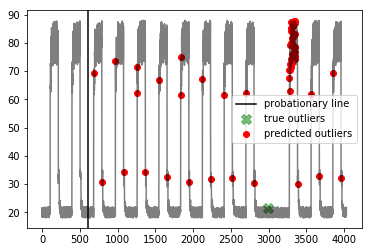




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1270, 1271, 2930, 2969, 2970]


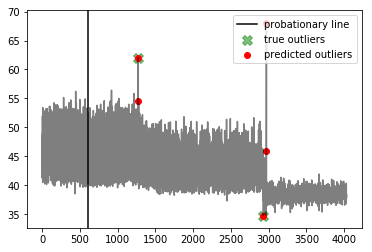




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [400, 800, 801, 802, 1000, 1001, 1002, 1400]


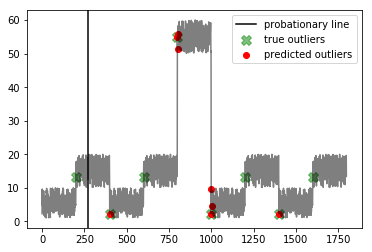




--- art_daily_flatmiddle ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [684, 792, 972, 1080, 1260, 1368, 1548, 1656, 1836, 1944, 2124, 2232, 2412, 2520, 2700, 2808, 2880, 3156, 3276, 3384, 3564, 3672, 3852, 3960]


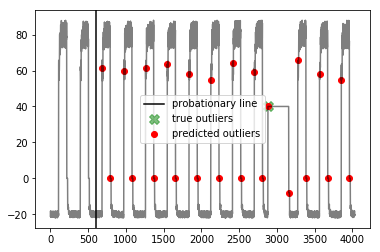

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  23.299999999999997
Best window threshold:  0.9999
Corresponding window overall precision:  0.18888888888888888
Corresponding window overall recall:  0.6296296296296297
Corresponding window overall F score:  0.29059829059829057



--- artificial_cd_3 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.25
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [201, 203, 208, 214]


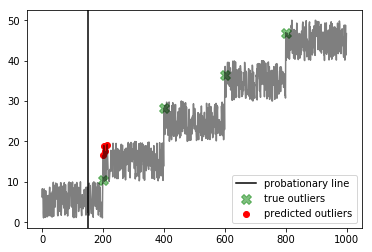




--- artificial_cd_1 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [201, 219]


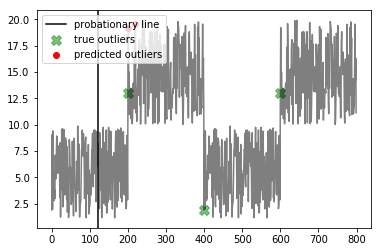




--- grok_asg_anomaly ---
Corresponding window precision:  0.15384615384615385
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  11
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [772, 773, 830, 831, 855, 860, 873, 874, 876, 954, 966, 967, 1002, 1026, 1032, 1134, 1200, 1201, 1569, 1915, 2258, 2804, 2825, 2921, 3257, 3603, 3700, 3753, 3754, 3755, 3798, 3845, 4036, 4083, 4106, 4129, 4174, 4219, 4424]


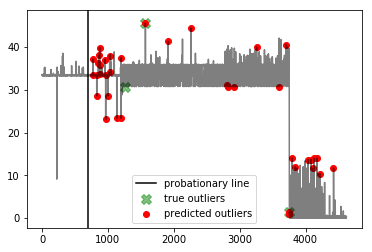




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 950, 951, 952, 953, 954, 1823, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2593, 2594, 2606, 2975, 3593, 3594, 3595, 3596, 3597, 3598, 3600]


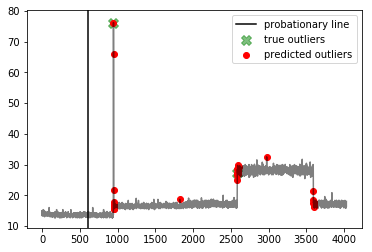




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [620, 718, 920, 992, 1006, 1208, 1808, 1832, 1880, 2426, 2456, 2996, 3032, 3080, 3081, 3082, 3086, 3089, 3108, 3111, 3130, 3580, 3581, 3669]


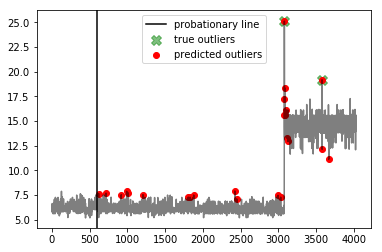




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1999, 2338, 3567, 3568, 3572, 3573, 3580, 3581, 3582, 3583]


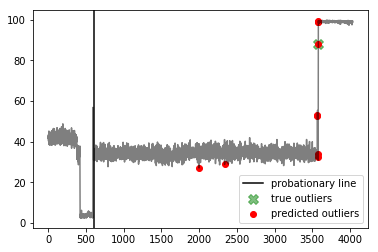




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  8
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [684, 792, 972, 1080, 1260, 1261, 1368, 1548, 1656, 1836, 1837, 1944, 2124, 2232, 2412, 2520, 2700, 2808, 3276, 3277, 3284, 3286, 3288, 3290, 3294, 3295, 3298, 3301, 3302, 3303, 3306, 3307, 3309, 3314, 3317, 3323, 3324, 3325, 3327, 3328, 3329, 3334, 3336, 3344, 3346, 3348, 3349, 3350, 3353, 3354, 3384, 3564, 3672, 3852, 3960]


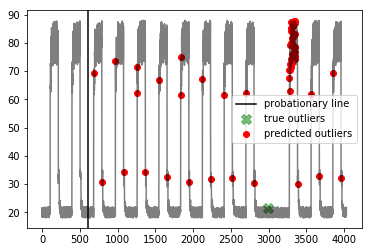




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1270, 1271, 2930, 2969, 2970]


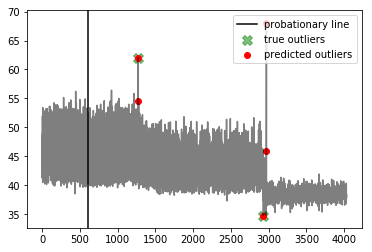




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [400, 800, 801, 802, 1000, 1001, 1002, 1400]


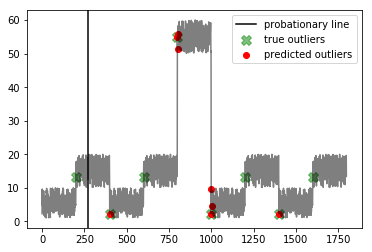




--- art_daily_flatmiddle ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [684, 792, 972, 1080, 1260, 1368, 1548, 1656, 1836, 1944, 2124, 2232, 2412, 2520, 2700, 2808, 2880, 3156, 3276, 3384, 3564, 3672, 3852, 3960]


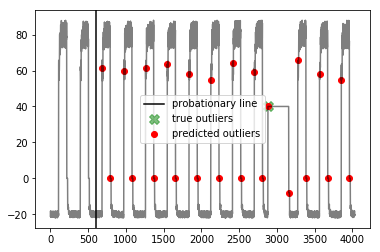

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  25.8
Best window threshold:  1.0
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


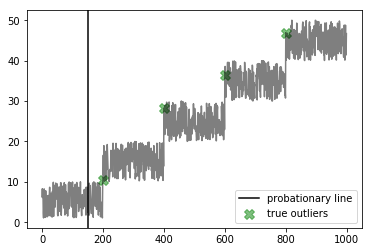




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


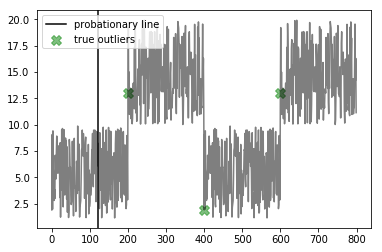




--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 874, 966, 3753, 3754]


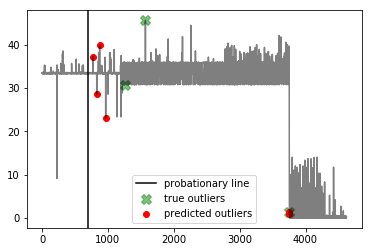




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 950, 952, 2585, 2586, 2587, 2588]


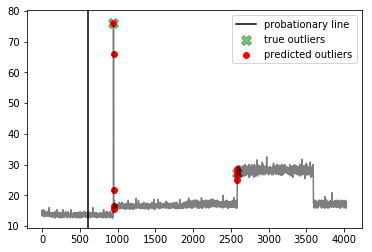




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3089]


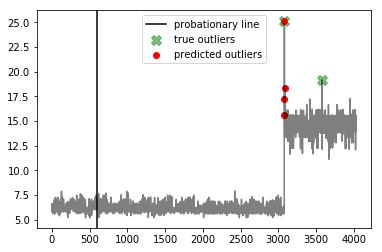




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3580, 3581, 3582]


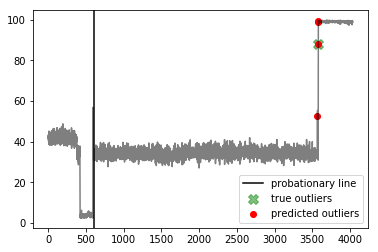




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [684, 792, 972, 1080, 1260, 1368, 1656, 1944, 2808, 3276, 3277, 3384, 3564, 3672, 3852, 3960]


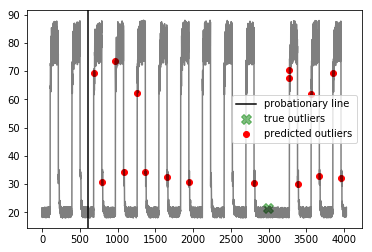




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


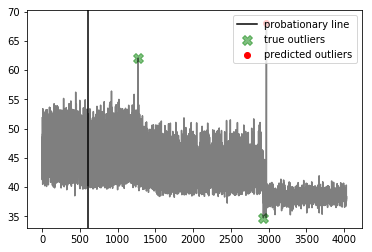




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.25
Corresponding window false positives:  0
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [800, 1000]


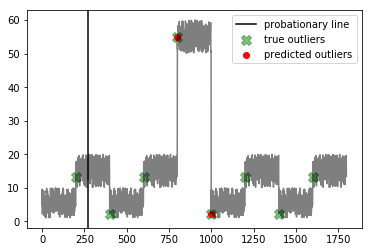




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  8
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [684, 792, 972, 1080, 1260, 1368, 1548, 1656, 1836, 1944, 2124, 2232, 2412, 2520, 2700, 2808, 3276, 3384, 3564, 3672, 3852, 3960]


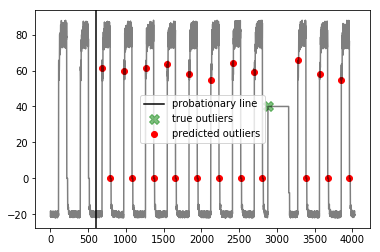

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  27.5
Best window threshold:  1.0
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


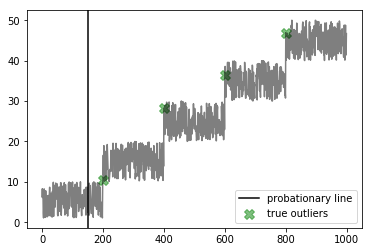




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


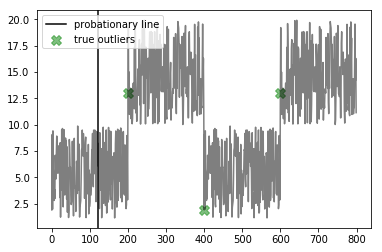




--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 874, 966, 3753, 3754]


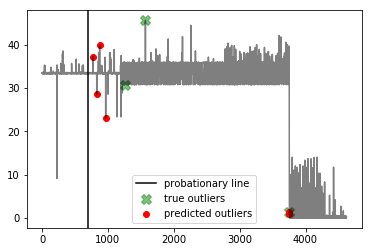




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 950, 952, 2585, 2586, 2587, 2588]


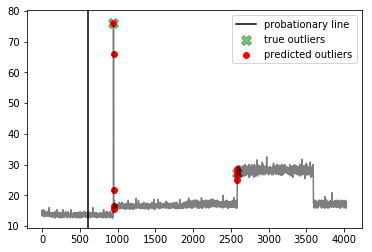




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3089]


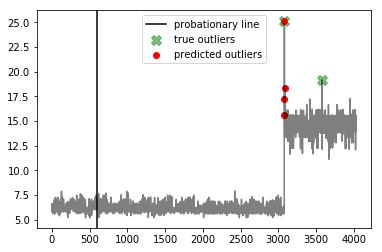




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3580, 3581, 3582]


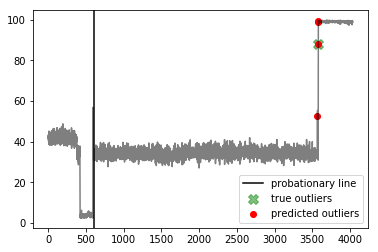




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [684, 792, 972, 1080, 1260, 1368, 1656, 1944, 2808, 3276, 3277, 3384, 3564, 3672, 3852, 3960]


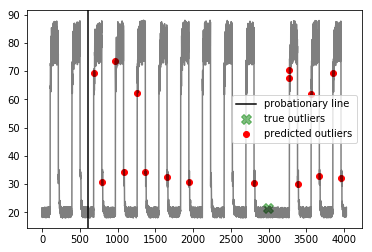




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


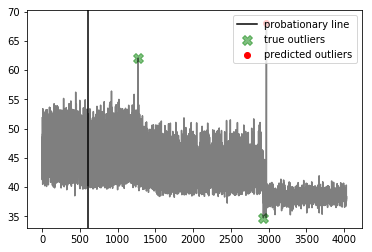




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.25
Corresponding window false positives:  0
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [800, 1000]


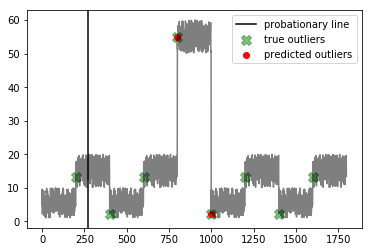




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  8
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [684, 792, 972, 1080, 1260, 1368, 1548, 1656, 1836, 1944, 2124, 2232, 2412, 2520, 2700, 2808, 3276, 3384, 3564, 3672, 3852, 3960]


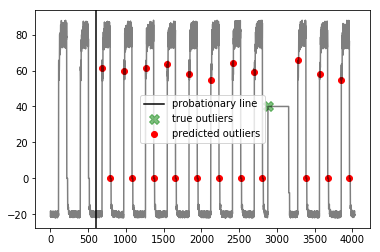

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  29.2
Best window threshold:  1.0
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


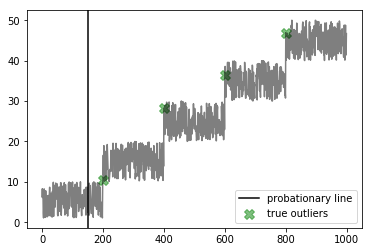




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


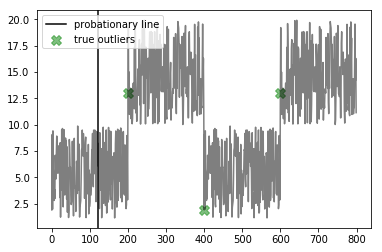




--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 874, 966, 3753, 3754]


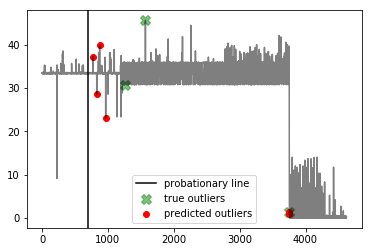




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 950, 952, 2585, 2586, 2587, 2588]


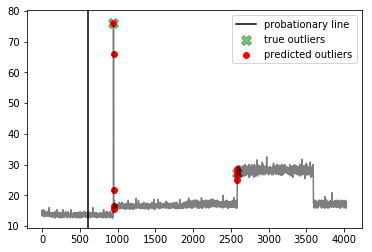




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3089]


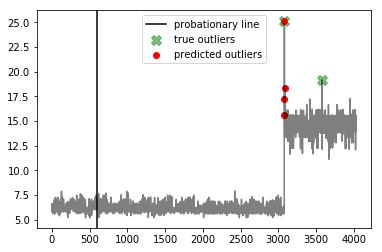




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3580, 3581, 3582]


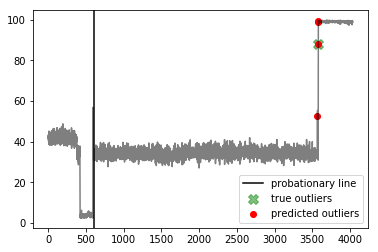




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [684, 792, 972, 1080, 1260, 1368, 1656, 1944, 2808, 3276, 3277, 3384, 3564, 3672, 3852, 3960]


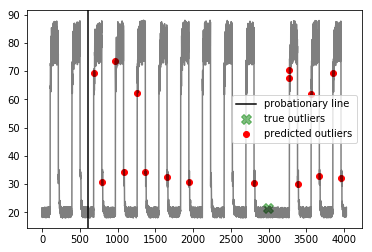




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


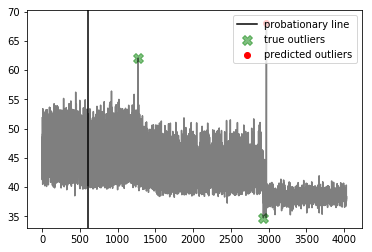




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.25
Corresponding window false positives:  0
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [800, 1000]


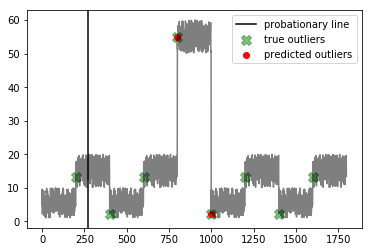




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  8
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [684, 792, 972, 1080, 1260, 1368, 1548, 1656, 1836, 1944, 2124, 2232, 2412, 2520, 2700, 2808, 3276, 3384, 3564, 3672, 3852, 3960]


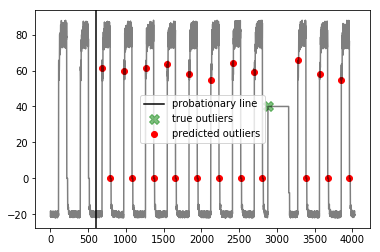

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  30.9
Best window threshold:  1.0
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


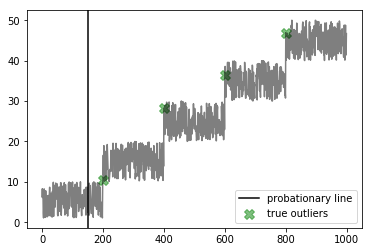




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


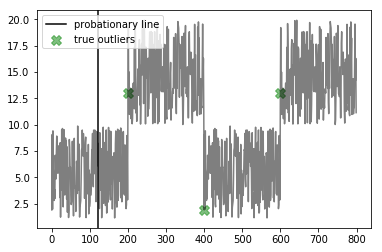




--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 874, 966, 3753, 3754]


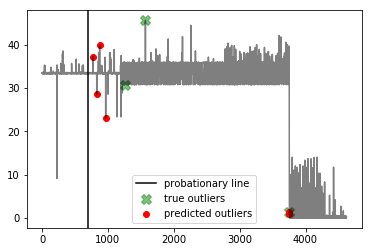




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 950, 952, 2585, 2586, 2587, 2588]


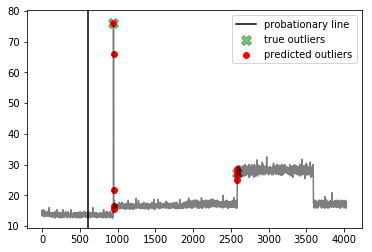




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3089]


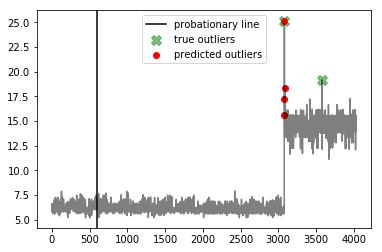




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3580, 3581, 3582]


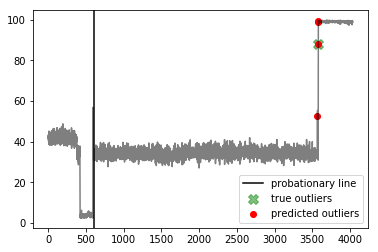




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [684, 792, 972, 1080, 1260, 1368, 1656, 1944, 2808, 3276, 3277, 3384, 3564, 3672, 3852, 3960]


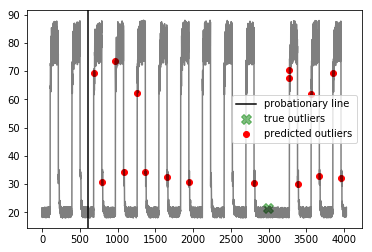




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


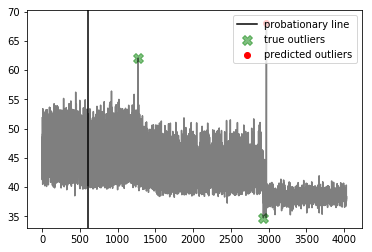




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.25
Corresponding window false positives:  0
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [800, 1000]


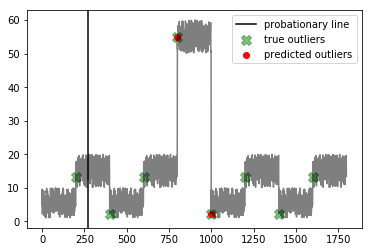




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  8
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [684, 792, 972, 1080, 1260, 1368, 1548, 1656, 1836, 1944, 2124, 2232, 2412, 2520, 2700, 2808, 3276, 3384, 3564, 3672, 3852, 3960]


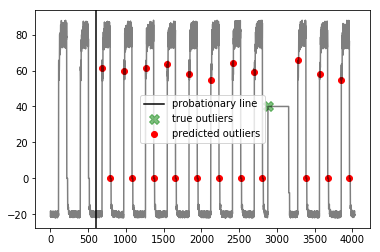

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  32.6
Best window threshold:  1.0
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


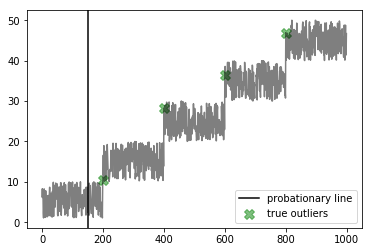




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


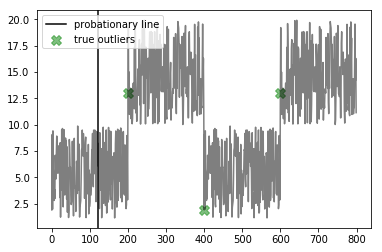




--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 874, 966, 3753, 3754]


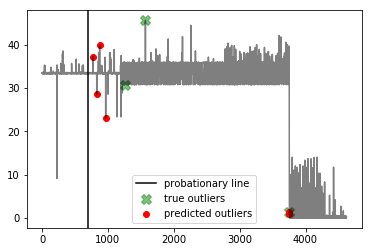




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 950, 952, 2585, 2586, 2587, 2588]


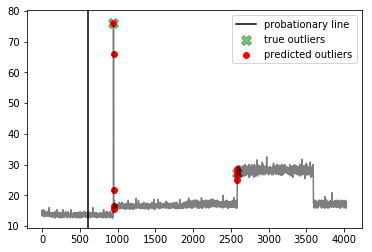




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3089]


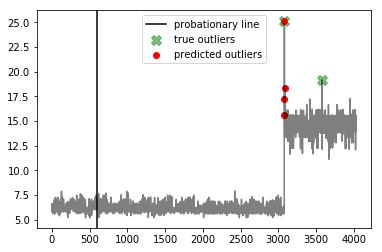




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3580, 3581, 3582]


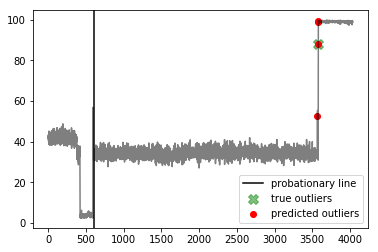




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [684, 792, 972, 1080, 1260, 1368, 1656, 1944, 2808, 3276, 3277, 3384, 3564, 3672, 3852, 3960]


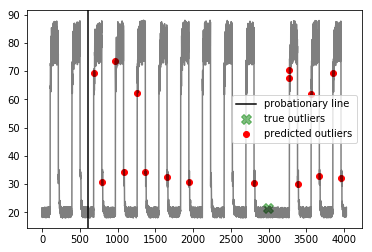




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


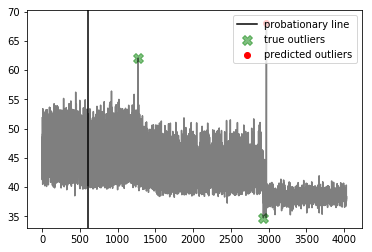




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.25
Corresponding window false positives:  0
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [800, 1000]


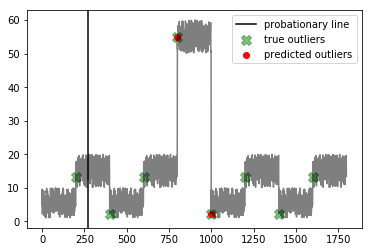




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  8
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [684, 792, 972, 1080, 1260, 1368, 1548, 1656, 1836, 1944, 2124, 2232, 2412, 2520, 2700, 2808, 3276, 3384, 3564, 3672, 3852, 3960]


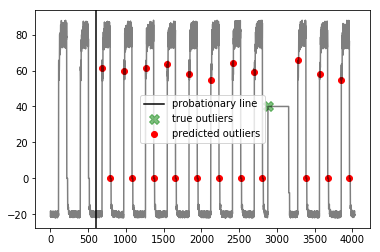

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  34.3
Best window threshold:  1.0
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


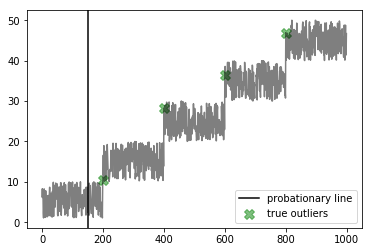




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


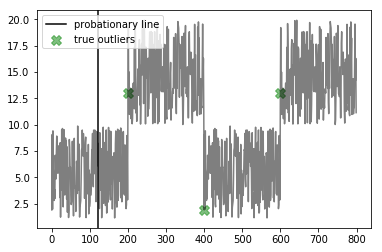




--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 874, 966, 3753, 3754]


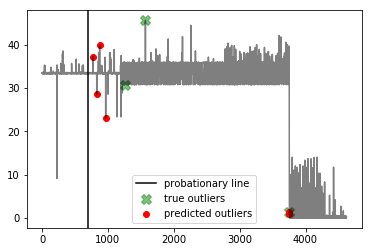




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 950, 952, 2585, 2586, 2587, 2588]


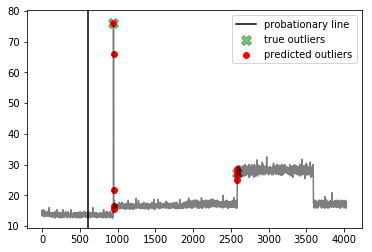




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3089]


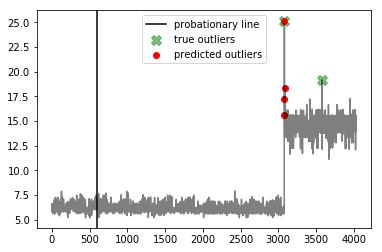




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3580, 3581, 3582]


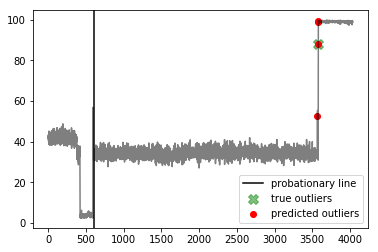




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [684, 792, 972, 1080, 1260, 1368, 1656, 1944, 2808, 3276, 3277, 3384, 3564, 3672, 3852, 3960]


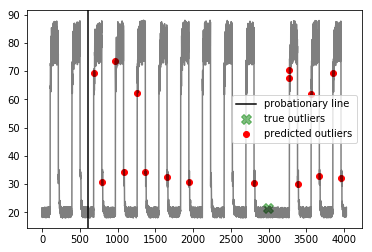




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


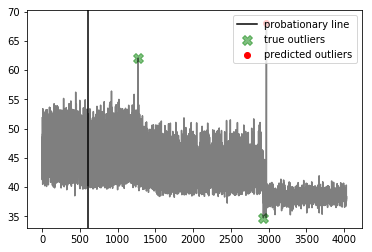




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.25
Corresponding window false positives:  0
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [800, 1000]


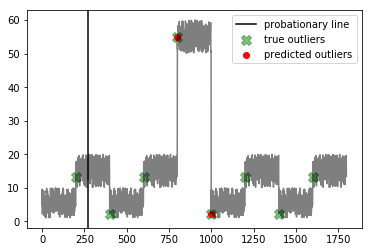




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  8
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [684, 792, 972, 1080, 1260, 1368, 1548, 1656, 1836, 1944, 2124, 2232, 2412, 2520, 2700, 2808, 3276, 3384, 3564, 3672, 3852, 3960]


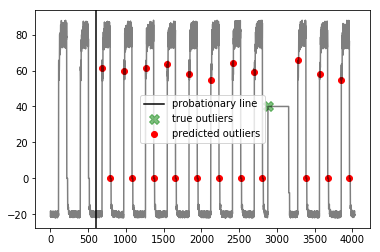

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  36.0
Best window threshold:  1.0
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


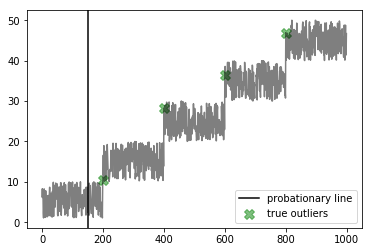




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


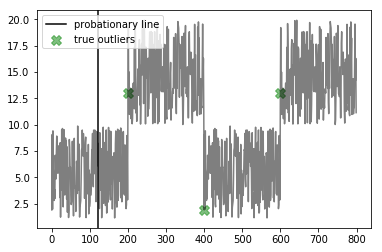




--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 874, 966, 3753, 3754]


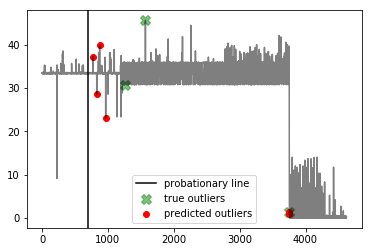




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 950, 952, 2585, 2586, 2587, 2588]


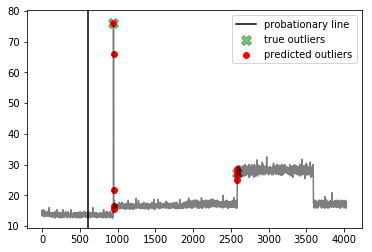




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3089]


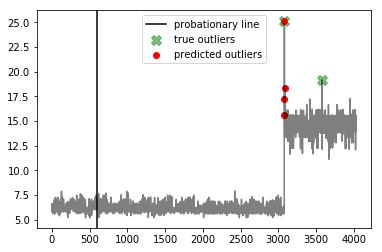




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3580, 3581, 3582]


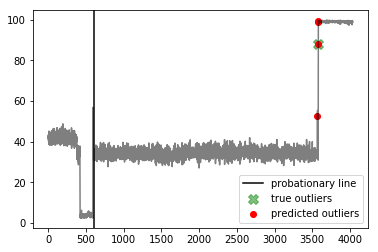




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [684, 792, 972, 1080, 1260, 1368, 1656, 1944, 2808, 3276, 3277, 3384, 3564, 3672, 3852, 3960]


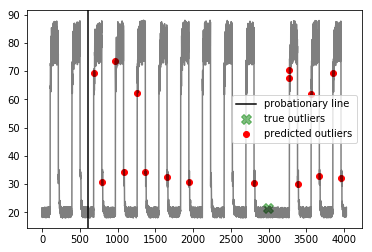




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


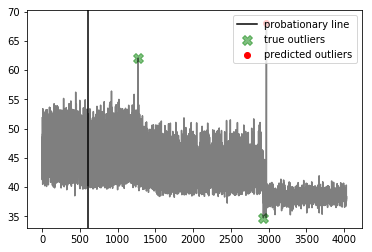




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.25
Corresponding window false positives:  0
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [800, 1000]


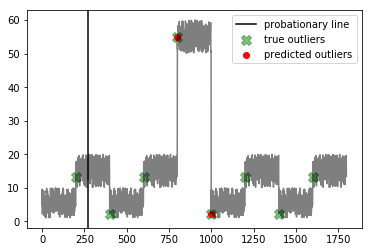




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  8
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [684, 792, 972, 1080, 1260, 1368, 1548, 1656, 1836, 1944, 2124, 2232, 2412, 2520, 2700, 2808, 3276, 3384, 3564, 3672, 3852, 3960]


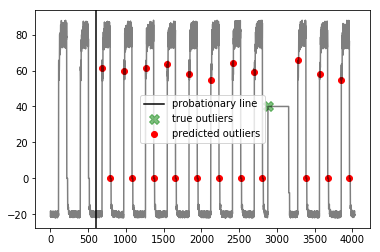

------------
False Positive Weight:  0.1
	 Corresponding window overall F score : 0.24731182795698925
	 Corresponding window overall recall : 0.8518518518518519
	 Best window threshold : 0.9973
	 Corresponding window overall precision : 0.14465408805031446
	 Minimum number of mistakes : 13.600000000000001
False Positive Weight:  0.2
	 Corresponding window overall F score : 0.29059829059829057
	 Corresponding window overall recall : 0.6296296296296297
	 Best window threshold : 0.9999
	 Corresponding window overall precision : 0.18888888888888888
	 Minimum number of mistakes : 19.200000000000003
False Positive Weight:  0.3
	 Corresponding window overall F score : 0.29059829059829057
	 Corresponding window overall recall : 0.6296296296296297
	 Best window threshold : 0.9999
	 Corresponding window overall precision : 0.18888888888888888
	 Minimum number of mistakes : 23.299999999999997
False Positive Weight:  0.6
	 Corresponding window overall F score : 0.21333333333333335
	 Corresponding 

In [16]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# Facebook Prophet Results

In [17]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_prophet = joblib.load("anomaly_scores/Prophet/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_prophet["Anomaly Scores"]

In [18]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.2: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.3: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.4: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.5: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.6: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.7: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.8: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.9: {'precision': 0.1111111111111111, 'recall': 1.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  15.0
Best window threshold:  0.9965
Corresponding window overall precision:  0.12987012987012986
Corresponding window overall recall:  0.7407407407407407
Corresponding window overall F score:  0.2209944751381215



--- artificial_cd_3 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [203, 400, 404, 409, 417]


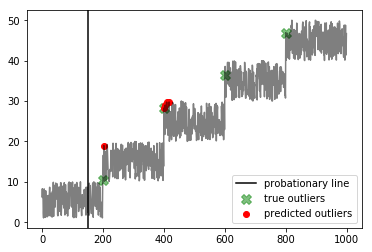




--- artificial_cd_1 ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [201, 219, 400, 402, 601]


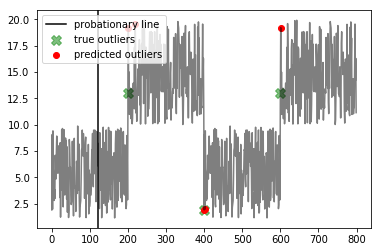




--- grok_asg_anomaly ---
Corresponding window precision:  0.15789473684210525
Corresponding window recall:  1.0
Corresponding window false positives:  16
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [772, 815, 817, 818, 819, 821, 822, 823, 824, 825, 826, 827, 828, 829, 830, 831, 832, 833, 834, 835, 836, 837, 838, 839, 840, 841, 842, 843, 844, 845, 846, 847, 848, 849, 850, 851, 852, 853, 874, 966, 1002, 1026, 1027, 1028, 1029, 1030, 1031, 1033, 1038, 1039, 1040, 1041, 1042, 1043, 1044, 1045, 1046, 1047, 1089, 1090, 1091, 1095, 1096, 1134, 1200, 1201, 1348, 1357, 1361, 1365, 1369, 1381, 1394, 1398, 1402, 1406, 1410, 1414, 1418, 1422, 1426, 1430, 1434, 1442, 1569, 1729, 1756, 1785, 1786, 1915, 2131, 2132, 2195, 2203, 2211, 2219, 2227, 2235, 2252, 2258, 2297, 2809, 2821, 2825, 2826, 2843, 2844, 2845, 3157, 3177, 3197, 3217, 3237, 3257, 3321, 3335, 3355, 3378, 3379, 3407, 3408, 3409, 3432, 3433, 3452, 3453, 3575, 3595, 3596, 3597, 35

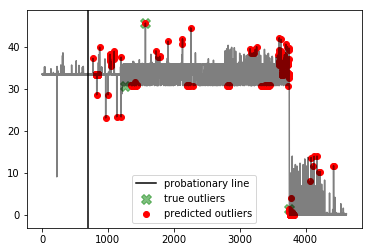




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.14285714285714285
Corresponding window recall:  1.0
Corresponding window false positives:  12
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 815, 846, 861, 862, 864, 866, 867, 871, 872, 873, 877, 882, 883, 884, 885, 887, 892, 893, 895, 897, 898, 900, 901, 904, 906, 907, 909, 910, 912, 913, 914, 915, 917, 918, 919, 920, 921, 922, 923, 924, 925, 926, 928, 929, 930, 931, 932, 933, 934, 935, 936, 937, 938, 939, 940, 941, 942, 944, 945, 946, 947, 948, 949, 1480, 1535, 1546, 1642, 1819, 1839, 1931, 1941, 1949, 1967, 2269, 2399, 2484, 2490, 2492, 2496, 2497, 2499, 2502, 2503, 2504, 2505, 2506, 2510, 2512, 2513, 2514, 2515, 2516, 2517, 2518, 2519, 2520, 2522, 2523, 2524, 2525, 2526, 2527, 2528, 2529, 2530, 2531, 2532, 2533, 2534, 2535, 2536, 2537, 2538, 2539, 2540, 2541, 2542, 2544, 2545, 2546, 2547, 2548, 2549, 2550, 2551, 2552, 2553, 2554, 2555, 2556, 2558, 2560

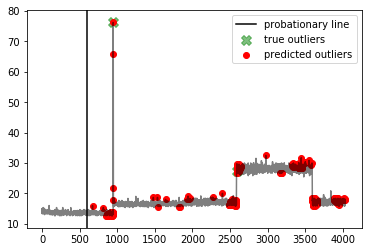




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.13333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  13
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [620, 683, 691, 708, 718, 729, 920, 948, 962, 972, 980, 992, 1006, 1014, 1043, 1208, 1235, 1283, 1309, 1362, 1404, 1498, 1534, 1543, 1561, 1569, 1580, 1591, 1592, 1808, 1832, 1862, 1873, 1880, 2011, 2064, 2082, 2088, 2158, 2166, 2167, 2192, 2208, 2426, 2438, 2445, 2456, 2466, 2513, 2626, 2650, 2663, 2678, 2742, 2743, 2770, 2801, 2851, 2894, 2900, 2911, 2924, 2926, 2940, 2947, 2971, 2985, 2986, 2988, 2989, 2992, 2993, 2994, 2995, 2997, 2998, 2999, 3000, 3001, 3002, 3003, 3004, 3005, 3006, 3007, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3046, 3047, 

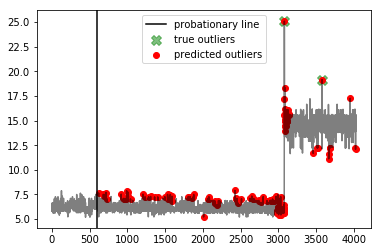




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.125
Corresponding window recall:  1.0
Corresponding window false positives:  7
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1136, 1146, 1152, 1196, 1205, 1222, 1229, 1232, 1238, 1241, 1373, 1385, 1428, 1436, 1448, 1551, 1560, 1579, 1581, 1588, 1590, 1597, 1609, 1612, 1620, 1634, 1643, 1654, 1812, 1973, 1976, 1979, 1985, 1988, 1990, 1998, 2021, 2036, 2047, 2052, 2093, 2120, 2272, 2338, 2346, 2368, 2388, 2419, 2427, 2435, 2540, 2552, 2600, 2612, 2670, 2689, 2829, 2854, 2877, 2913, 2919, 2938, 2944, 2950, 3101, 3116, 3120, 3129, 3139, 3145, 3148, 3152, 3155, 3161, 3166, 3167, 3168, 3175, 3178, 3181, 3192, 3198, 3209, 3212, 3214, 3216, 3217, 3224, 3228, 3229, 3231, 3233, 3236, 3237, 3242, 3245, 3246, 3248, 3249, 3250, 3253, 3254, 3255, 3257, 3378, 3382, 3387, 3388, 3394, 3396, 3400, 3402, 3405, 3406, 3408, 3409, 3411, 3412, 3413, 3415, 3416, 3418, 3419, 3420, 342

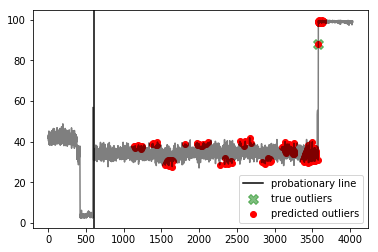




--- art_daily_nojump ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [679, 680, 681, 682, 683, 684, 685, 786, 788, 789, 790, 791, 792, 967, 968, 969, 970, 971, 972, 973, 974, 977, 1070, 1071, 1073, 1075, 1076, 1078, 1079, 1080, 1082, 1083, 1256, 1257, 1258, 1259, 1261, 1263, 1362, 1363, 1365, 1366, 1367, 1368, 1369, 1546, 1547, 1651, 1652, 1653, 1655, 1656, 1833, 1834, 1835, 1837, 1940, 1941, 1942, 1943, 1944, 1945, 2120, 2121, 2122, 2123, 2226, 2227, 2229, 2230, 2232, 2233, 2409, 2410, 2411, 2413, 2414, 2514, 2515, 2516, 2517, 2518, 2698, 2699, 2703, 2803, 2805, 2806, 2807, 2985, 2986, 2987, 2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 2996, 2997, 2998, 2999, 3000, 3001, 3002, 3003, 3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023

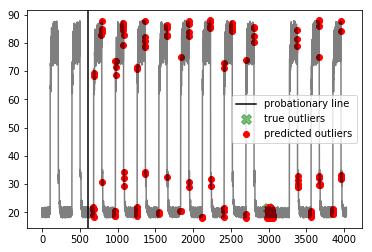




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [918, 1271, 1878, 1974, 2442, 2492, 2802, 2876, 2886, 2968, 2970, 3272, 3282, 3504, 3668, 3708, 3716, 3834, 3860]


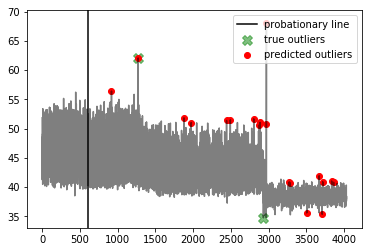




--- artificial_cd_2 ---
Corresponding window precision:  0.3
Corresponding window recall:  0.375
Corresponding window false positives:  7
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  [400, 768, 773, 775, 776, 778, 781, 782, 784, 785, 786, 787, 788, 789, 790, 791, 792, 793, 794, 795, 796, 797, 798, 799, 800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 820, 821, 824, 825, 827, 828, 830, 831, 832, 835, 836, 839, 840, 843, 845, 848, 851, 855, 996, 997, 1000, 1295, 1296, 1300, 1303, 1305, 1307, 1309, 1312, 1317, 1320, 1322, 1323, 1324, 1331, 1334, 1338, 1339, 1340, 1342, 1343]


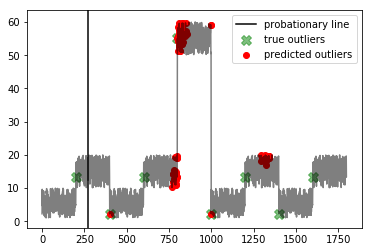




--- art_daily_flatmiddle ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [678, 679, 680, 681, 682, 683, 684, 685, 686, 786, 788, 789, 790, 791, 792, 793, 966, 967, 968, 969, 970, 971, 972, 973, 974, 975, 1075, 1076, 1077, 1078, 1079, 1080, 1081, 1082, 1083, 1256, 1257, 1258, 1259, 1260, 1261, 1263, 1360, 1363, 1364, 1365, 1366, 1367, 1368, 1369, 1370, 1371, 1372, 1545, 1546, 1547, 1548, 1652, 1654, 1655, 1656, 1657, 1658, 1833, 1834, 1835, 1838, 1940, 1942, 1943, 1944, 1945, 2121, 2122, 2123, 2125, 2227, 2229, 2230, 2231, 2232, 2233, 2408, 2409, 2410, 2411, 2412, 2515, 2517, 2518, 2519, 2520, 2521, 2696, 2697, 2698, 2699, 2806, 2807, 2808, 2809, 2880, 2881, 2882, 2883, 2884, 2885, 2886, 2887, 2888, 2889, 2890, 2891, 2892, 2893, 2894, 2895, 2896, 2897, 2898, 2899, 2900, 2901, 2902, 2903, 2904, 2905, 2906

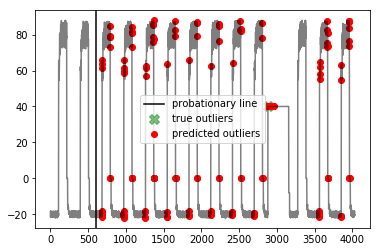

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  23.0
Best window threshold:  0.9965
Corresponding window overall precision:  0.12987012987012986
Corresponding window overall recall:  0.7407407407407407
Corresponding window overall F score:  0.2209944751381215



--- artificial_cd_3 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [203, 400, 404, 409, 417]


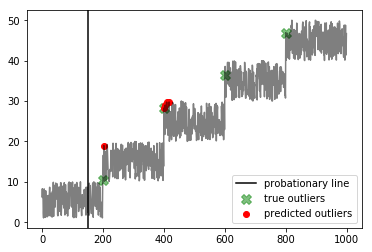




--- artificial_cd_1 ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [201, 219, 400, 402, 601]


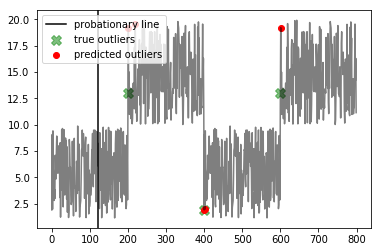




--- grok_asg_anomaly ---
Corresponding window precision:  0.15789473684210525
Corresponding window recall:  1.0
Corresponding window false positives:  16
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [772, 815, 817, 818, 819, 821, 822, 823, 824, 825, 826, 827, 828, 829, 830, 831, 832, 833, 834, 835, 836, 837, 838, 839, 840, 841, 842, 843, 844, 845, 846, 847, 848, 849, 850, 851, 852, 853, 874, 966, 1002, 1026, 1027, 1028, 1029, 1030, 1031, 1033, 1038, 1039, 1040, 1041, 1042, 1043, 1044, 1045, 1046, 1047, 1089, 1090, 1091, 1095, 1096, 1134, 1200, 1201, 1348, 1357, 1361, 1365, 1369, 1381, 1394, 1398, 1402, 1406, 1410, 1414, 1418, 1422, 1426, 1430, 1434, 1442, 1569, 1729, 1756, 1785, 1786, 1915, 2131, 2132, 2195, 2203, 2211, 2219, 2227, 2235, 2252, 2258, 2297, 2809, 2821, 2825, 2826, 2843, 2844, 2845, 3157, 3177, 3197, 3217, 3237, 3257, 3321, 3335, 3355, 3378, 3379, 3407, 3408, 3409, 3432, 3433, 3452, 3453, 3575, 3595, 3596, 3597, 35

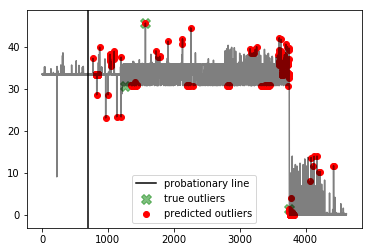




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.14285714285714285
Corresponding window recall:  1.0
Corresponding window false positives:  12
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 815, 846, 861, 862, 864, 866, 867, 871, 872, 873, 877, 882, 883, 884, 885, 887, 892, 893, 895, 897, 898, 900, 901, 904, 906, 907, 909, 910, 912, 913, 914, 915, 917, 918, 919, 920, 921, 922, 923, 924, 925, 926, 928, 929, 930, 931, 932, 933, 934, 935, 936, 937, 938, 939, 940, 941, 942, 944, 945, 946, 947, 948, 949, 1480, 1535, 1546, 1642, 1819, 1839, 1931, 1941, 1949, 1967, 2269, 2399, 2484, 2490, 2492, 2496, 2497, 2499, 2502, 2503, 2504, 2505, 2506, 2510, 2512, 2513, 2514, 2515, 2516, 2517, 2518, 2519, 2520, 2522, 2523, 2524, 2525, 2526, 2527, 2528, 2529, 2530, 2531, 2532, 2533, 2534, 2535, 2536, 2537, 2538, 2539, 2540, 2541, 2542, 2544, 2545, 2546, 2547, 2548, 2549, 2550, 2551, 2552, 2553, 2554, 2555, 2556, 2558, 2560

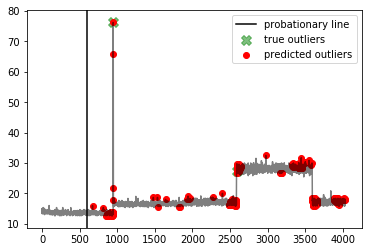




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.13333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  13
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [620, 683, 691, 708, 718, 729, 920, 948, 962, 972, 980, 992, 1006, 1014, 1043, 1208, 1235, 1283, 1309, 1362, 1404, 1498, 1534, 1543, 1561, 1569, 1580, 1591, 1592, 1808, 1832, 1862, 1873, 1880, 2011, 2064, 2082, 2088, 2158, 2166, 2167, 2192, 2208, 2426, 2438, 2445, 2456, 2466, 2513, 2626, 2650, 2663, 2678, 2742, 2743, 2770, 2801, 2851, 2894, 2900, 2911, 2924, 2926, 2940, 2947, 2971, 2985, 2986, 2988, 2989, 2992, 2993, 2994, 2995, 2997, 2998, 2999, 3000, 3001, 3002, 3003, 3004, 3005, 3006, 3007, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3046, 3047, 

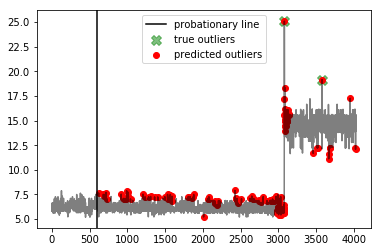




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.125
Corresponding window recall:  1.0
Corresponding window false positives:  7
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1136, 1146, 1152, 1196, 1205, 1222, 1229, 1232, 1238, 1241, 1373, 1385, 1428, 1436, 1448, 1551, 1560, 1579, 1581, 1588, 1590, 1597, 1609, 1612, 1620, 1634, 1643, 1654, 1812, 1973, 1976, 1979, 1985, 1988, 1990, 1998, 2021, 2036, 2047, 2052, 2093, 2120, 2272, 2338, 2346, 2368, 2388, 2419, 2427, 2435, 2540, 2552, 2600, 2612, 2670, 2689, 2829, 2854, 2877, 2913, 2919, 2938, 2944, 2950, 3101, 3116, 3120, 3129, 3139, 3145, 3148, 3152, 3155, 3161, 3166, 3167, 3168, 3175, 3178, 3181, 3192, 3198, 3209, 3212, 3214, 3216, 3217, 3224, 3228, 3229, 3231, 3233, 3236, 3237, 3242, 3245, 3246, 3248, 3249, 3250, 3253, 3254, 3255, 3257, 3378, 3382, 3387, 3388, 3394, 3396, 3400, 3402, 3405, 3406, 3408, 3409, 3411, 3412, 3413, 3415, 3416, 3418, 3419, 3420, 342

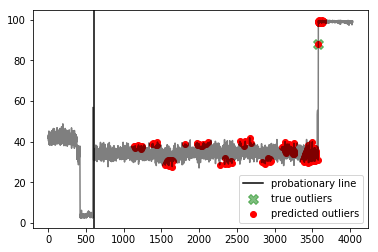




--- art_daily_nojump ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [679, 680, 681, 682, 683, 684, 685, 786, 788, 789, 790, 791, 792, 967, 968, 969, 970, 971, 972, 973, 974, 977, 1070, 1071, 1073, 1075, 1076, 1078, 1079, 1080, 1082, 1083, 1256, 1257, 1258, 1259, 1261, 1263, 1362, 1363, 1365, 1366, 1367, 1368, 1369, 1546, 1547, 1651, 1652, 1653, 1655, 1656, 1833, 1834, 1835, 1837, 1940, 1941, 1942, 1943, 1944, 1945, 2120, 2121, 2122, 2123, 2226, 2227, 2229, 2230, 2232, 2233, 2409, 2410, 2411, 2413, 2414, 2514, 2515, 2516, 2517, 2518, 2698, 2699, 2703, 2803, 2805, 2806, 2807, 2985, 2986, 2987, 2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 2996, 2997, 2998, 2999, 3000, 3001, 3002, 3003, 3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023

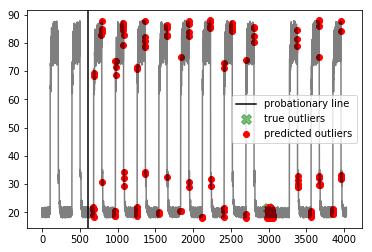




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [918, 1271, 1878, 1974, 2442, 2492, 2802, 2876, 2886, 2968, 2970, 3272, 3282, 3504, 3668, 3708, 3716, 3834, 3860]


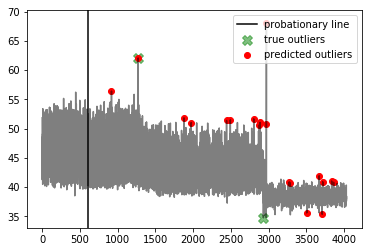




--- artificial_cd_2 ---
Corresponding window precision:  0.3
Corresponding window recall:  0.375
Corresponding window false positives:  7
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  [400, 768, 773, 775, 776, 778, 781, 782, 784, 785, 786, 787, 788, 789, 790, 791, 792, 793, 794, 795, 796, 797, 798, 799, 800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 820, 821, 824, 825, 827, 828, 830, 831, 832, 835, 836, 839, 840, 843, 845, 848, 851, 855, 996, 997, 1000, 1295, 1296, 1300, 1303, 1305, 1307, 1309, 1312, 1317, 1320, 1322, 1323, 1324, 1331, 1334, 1338, 1339, 1340, 1342, 1343]


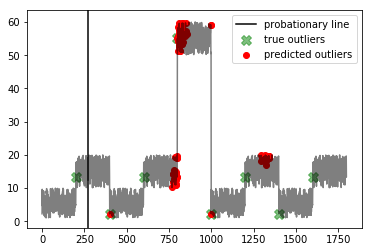




--- art_daily_flatmiddle ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [678, 679, 680, 681, 682, 683, 684, 685, 686, 786, 788, 789, 790, 791, 792, 793, 966, 967, 968, 969, 970, 971, 972, 973, 974, 975, 1075, 1076, 1077, 1078, 1079, 1080, 1081, 1082, 1083, 1256, 1257, 1258, 1259, 1260, 1261, 1263, 1360, 1363, 1364, 1365, 1366, 1367, 1368, 1369, 1370, 1371, 1372, 1545, 1546, 1547, 1548, 1652, 1654, 1655, 1656, 1657, 1658, 1833, 1834, 1835, 1838, 1940, 1942, 1943, 1944, 1945, 2121, 2122, 2123, 2125, 2227, 2229, 2230, 2231, 2232, 2233, 2408, 2409, 2410, 2411, 2412, 2515, 2517, 2518, 2519, 2520, 2521, 2696, 2697, 2698, 2699, 2806, 2807, 2808, 2809, 2880, 2881, 2882, 2883, 2884, 2885, 2886, 2887, 2888, 2889, 2890, 2891, 2892, 2893, 2894, 2895, 2896, 2897, 2898, 2899, 2900, 2901, 2902, 2903, 2904, 2905, 2906

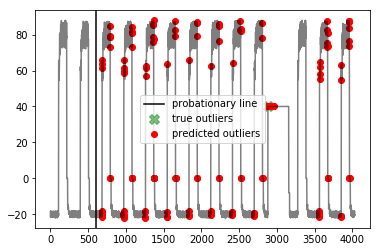

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  23.9
Best window threshold:  1.0
Corresponding window overall precision:  0.6666666666666666
Corresponding window overall recall:  0.14814814814814814
Corresponding window overall F score:  0.24242424242424243



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


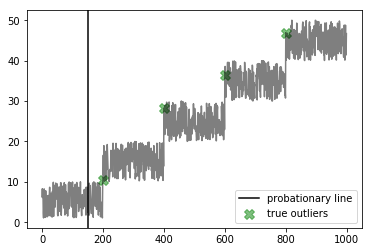




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


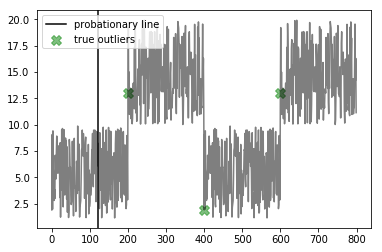




--- grok_asg_anomaly ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [830, 966]


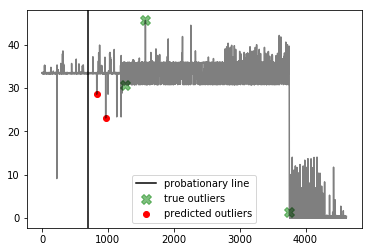




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [946, 947, 948]


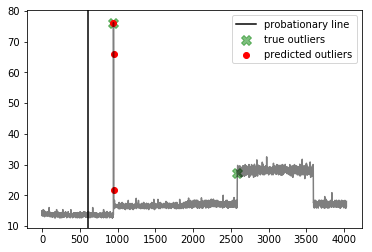




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3025, 3033, 3035, 3037, 3038, 3039, 3040, 3041, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055, 3081]


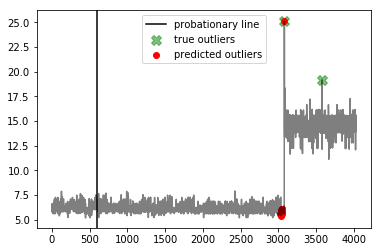




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


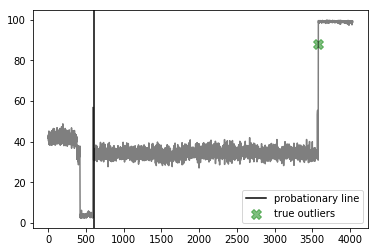




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3009, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3030, 3033, 3053, 3054, 3055]


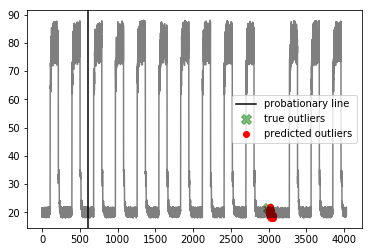




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


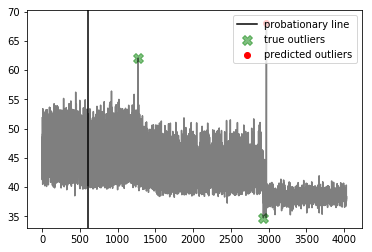




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


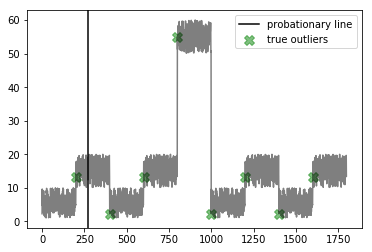




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


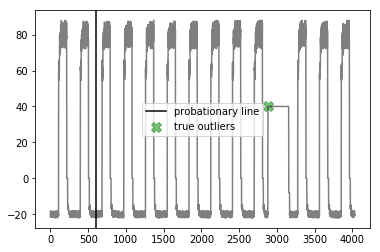

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  24.200000000000003
Best window threshold:  1.0
Corresponding window overall precision:  0.6666666666666666
Corresponding window overall recall:  0.14814814814814814
Corresponding window overall F score:  0.24242424242424243



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


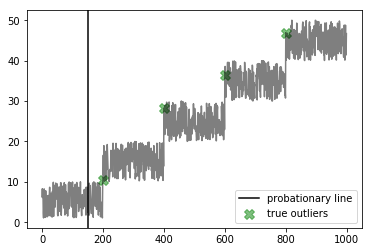




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


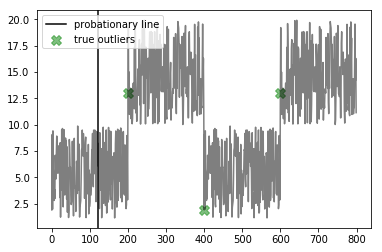




--- grok_asg_anomaly ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [830, 966]


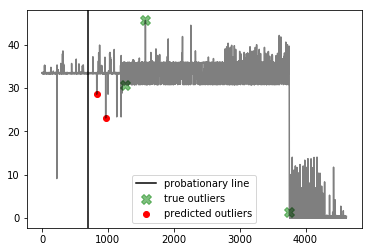




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [946, 947, 948]


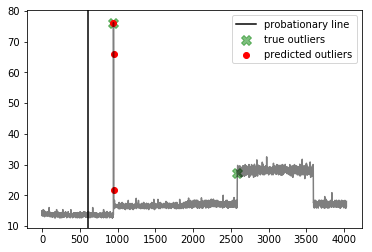




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3025, 3033, 3035, 3037, 3038, 3039, 3040, 3041, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055, 3081]


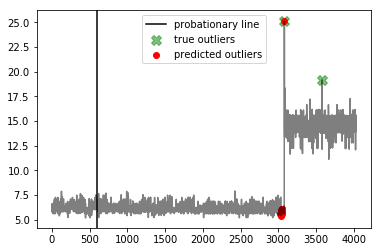




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


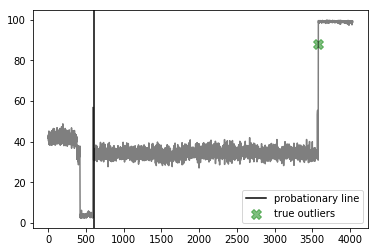




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3009, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3030, 3033, 3053, 3054, 3055]


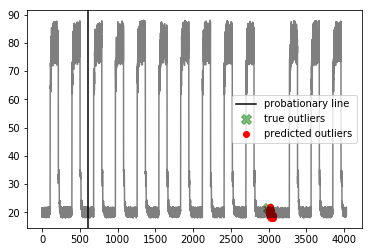




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


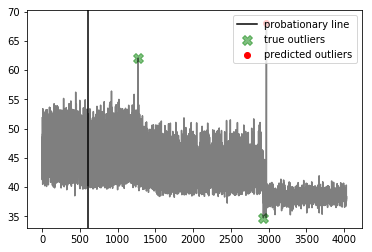




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


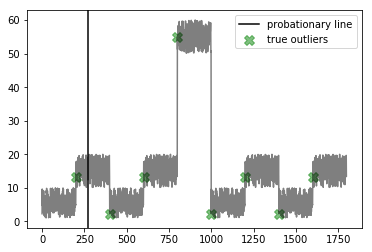




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


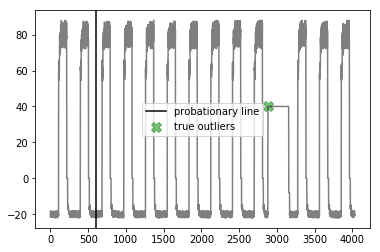

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  24.5
Best window threshold:  1.0
Corresponding window overall precision:  0.6666666666666666
Corresponding window overall recall:  0.14814814814814814
Corresponding window overall F score:  0.24242424242424243



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


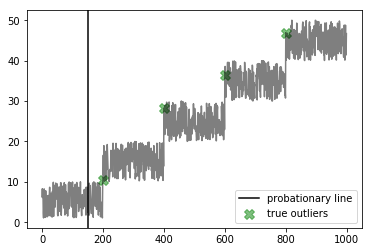




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


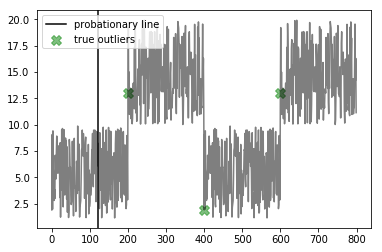




--- grok_asg_anomaly ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [830, 966]


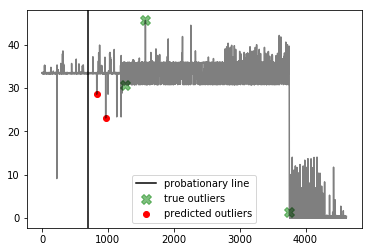




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [946, 947, 948]


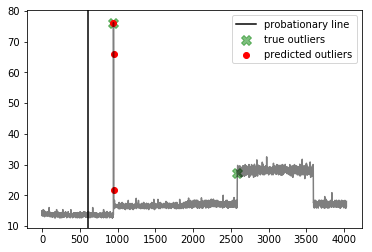




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3025, 3033, 3035, 3037, 3038, 3039, 3040, 3041, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055, 3081]


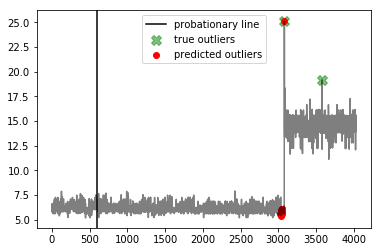




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


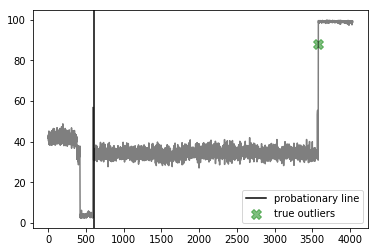




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3009, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3030, 3033, 3053, 3054, 3055]


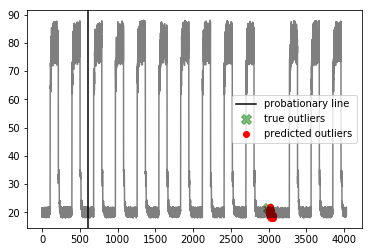




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


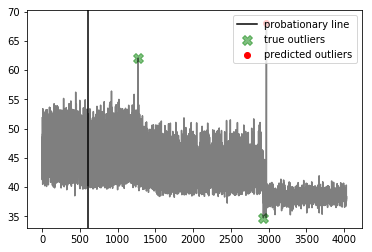




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


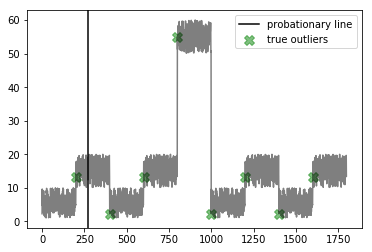




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


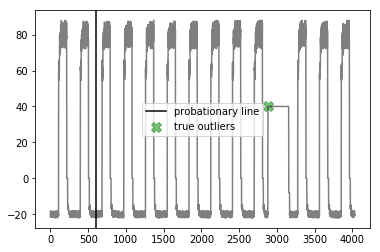

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  24.799999999999997
Best window threshold:  1.0
Corresponding window overall precision:  0.6666666666666666
Corresponding window overall recall:  0.14814814814814814
Corresponding window overall F score:  0.24242424242424243



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


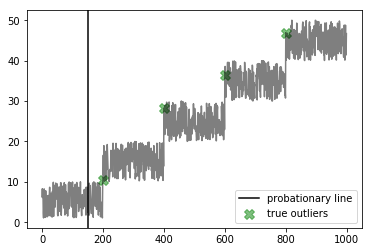




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


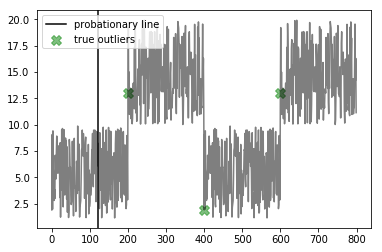




--- grok_asg_anomaly ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [830, 966]


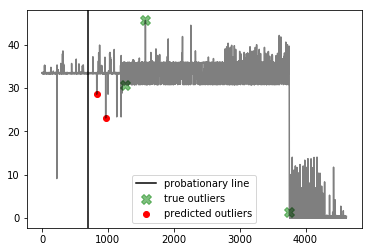




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [946, 947, 948]


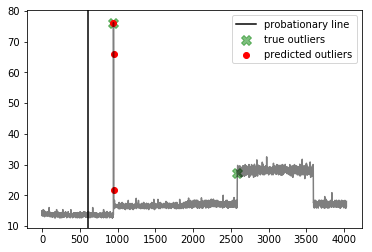




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3025, 3033, 3035, 3037, 3038, 3039, 3040, 3041, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055, 3081]


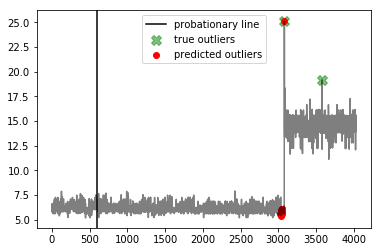




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


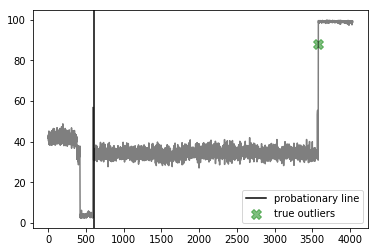




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3009, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3030, 3033, 3053, 3054, 3055]


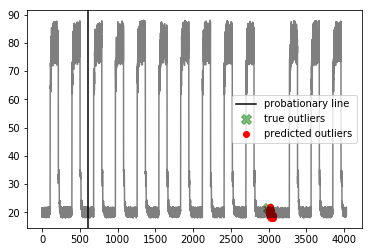




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


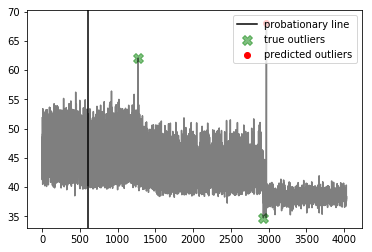




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


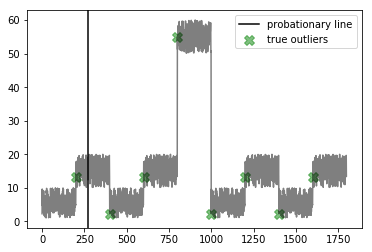




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


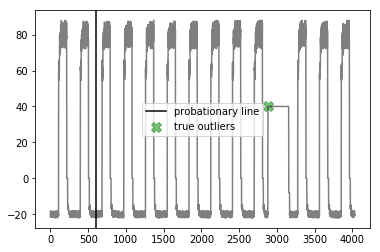

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  25.1
Best window threshold:  1.0
Corresponding window overall precision:  0.6666666666666666
Corresponding window overall recall:  0.14814814814814814
Corresponding window overall F score:  0.24242424242424243



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


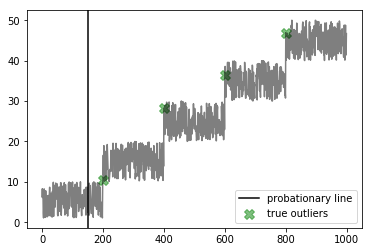




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


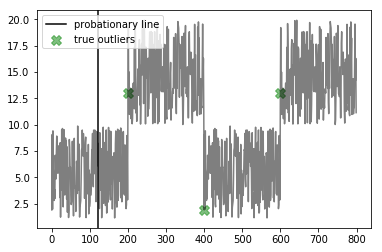




--- grok_asg_anomaly ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [830, 966]


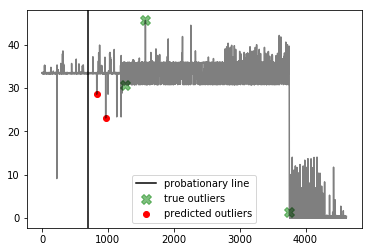




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [946, 947, 948]


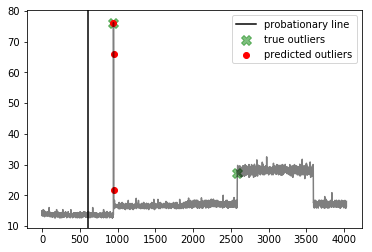




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3025, 3033, 3035, 3037, 3038, 3039, 3040, 3041, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055, 3081]


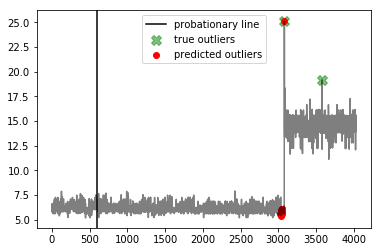




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


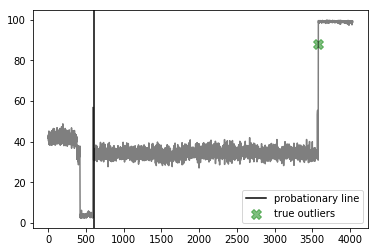




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3009, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3030, 3033, 3053, 3054, 3055]


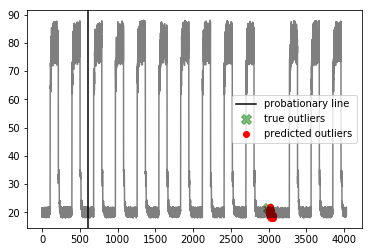




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


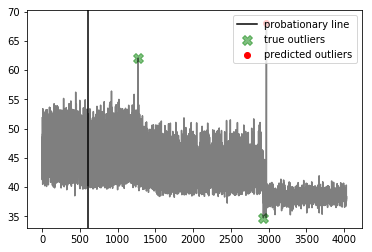




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


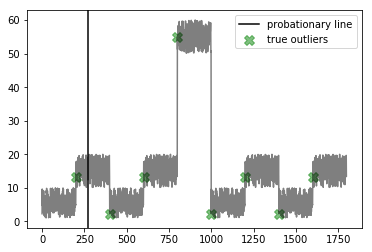




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


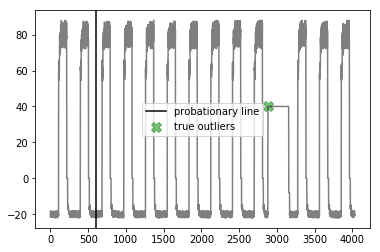

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  25.4
Best window threshold:  1.0
Corresponding window overall precision:  0.6666666666666666
Corresponding window overall recall:  0.14814814814814814
Corresponding window overall F score:  0.24242424242424243



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


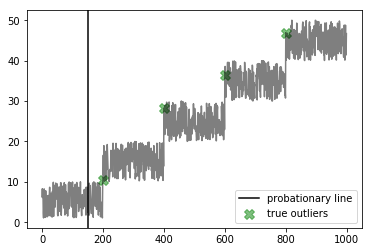




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


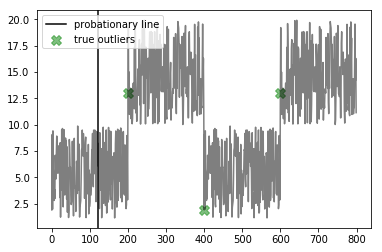




--- grok_asg_anomaly ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [830, 966]


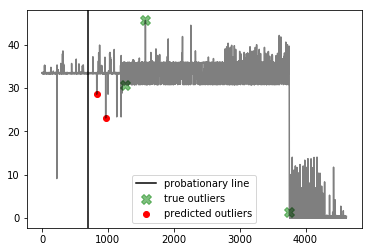




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [946, 947, 948]


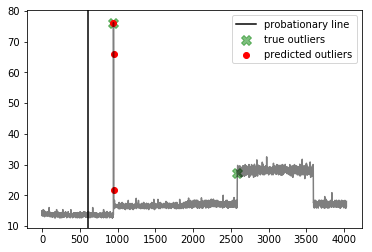




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3025, 3033, 3035, 3037, 3038, 3039, 3040, 3041, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055, 3081]


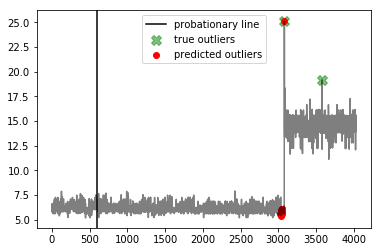




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


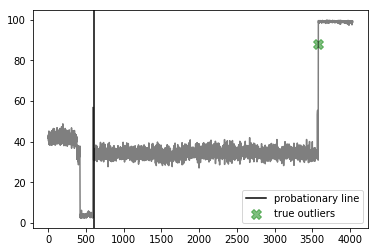




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3009, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3030, 3033, 3053, 3054, 3055]


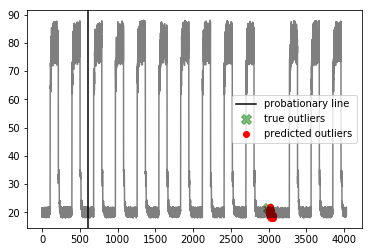




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


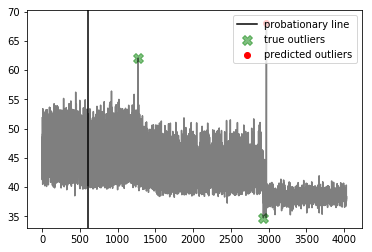




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


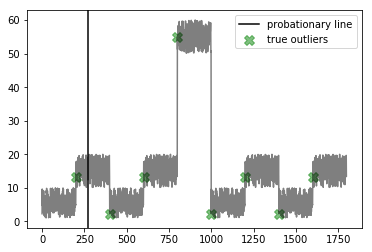




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


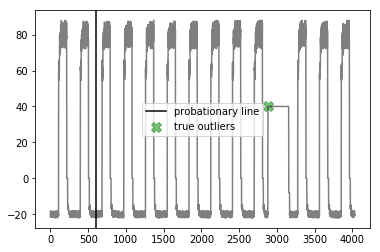

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  25.700000000000003
Best window threshold:  1.0
Corresponding window overall precision:  0.6666666666666666
Corresponding window overall recall:  0.14814814814814814
Corresponding window overall F score:  0.24242424242424243



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


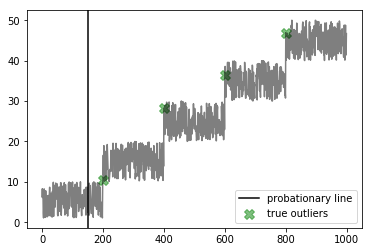




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


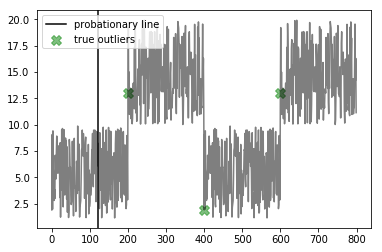




--- grok_asg_anomaly ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [830, 966]


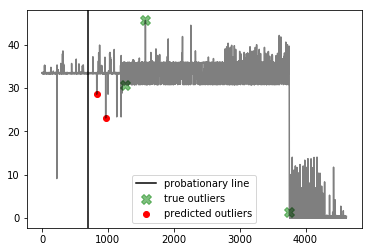




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [946, 947, 948]


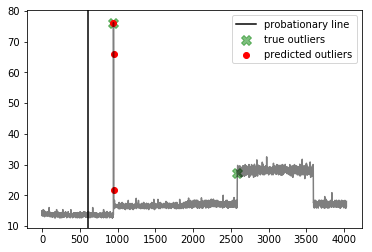




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3025, 3033, 3035, 3037, 3038, 3039, 3040, 3041, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055, 3081]


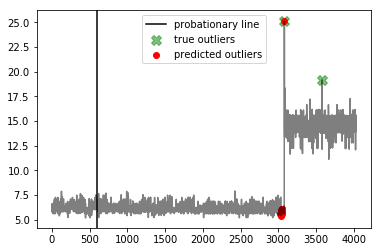




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


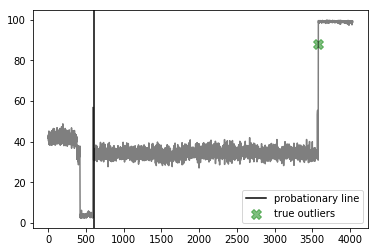




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3009, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3030, 3033, 3053, 3054, 3055]


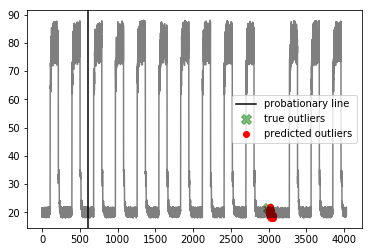




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


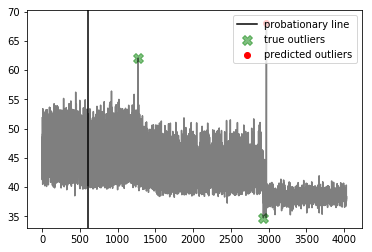




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


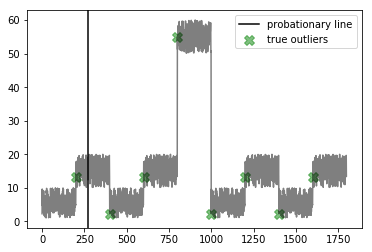




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


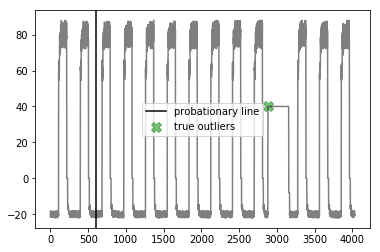

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  26.0
Best window threshold:  1.0
Corresponding window overall precision:  0.6666666666666666
Corresponding window overall recall:  0.14814814814814814
Corresponding window overall F score:  0.24242424242424243



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


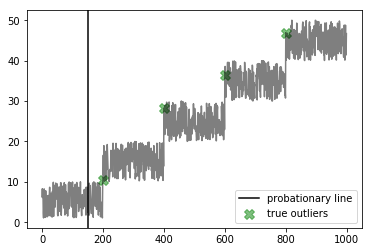




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


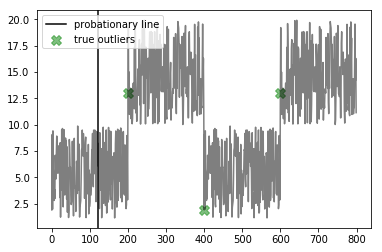




--- grok_asg_anomaly ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [830, 966]


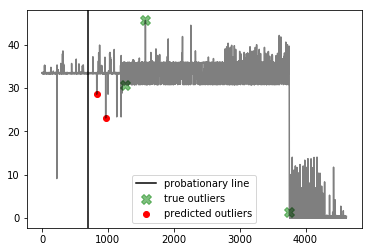




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [946, 947, 948]


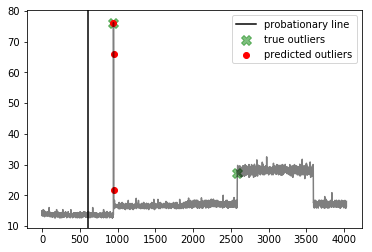




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3025, 3033, 3035, 3037, 3038, 3039, 3040, 3041, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055, 3081]


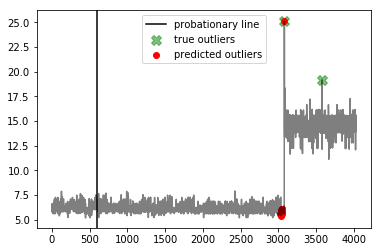




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


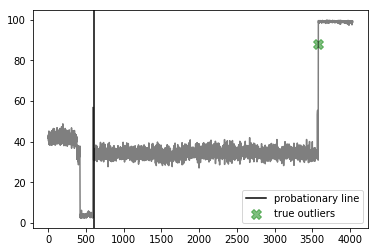




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3009, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3030, 3033, 3053, 3054, 3055]


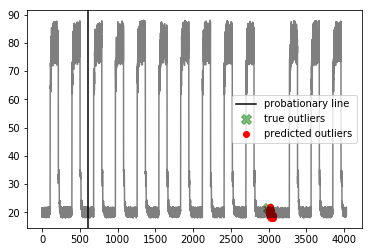




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


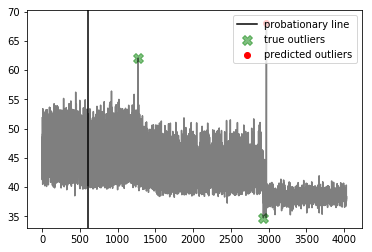




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


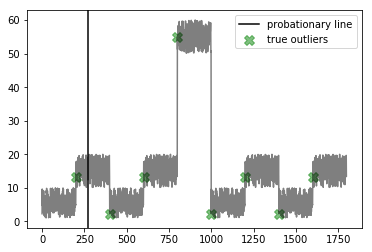




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


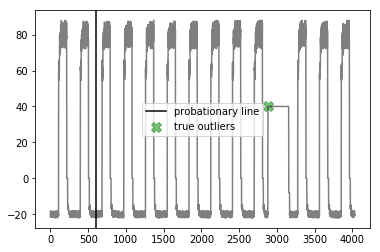

------------
False Positive Weight:  0.1
	 Corresponding window overall F score : 0.2209944751381215
	 Corresponding window overall recall : 0.7407407407407407
	 Best window threshold : 0.9965
	 Corresponding window overall precision : 0.12987012987012986
	 Minimum number of mistakes : 15.0
False Positive Weight:  0.2
	 Corresponding window overall F score : 0.2209944751381215
	 Corresponding window overall recall : 0.7407407407407407
	 Best window threshold : 0.9965
	 Corresponding window overall precision : 0.12987012987012986
	 Minimum number of mistakes : 23.0
False Positive Weight:  0.3
	 Corresponding window overall F score : 0.24242424242424243
	 Corresponding window overall recall : 0.14814814814814814
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.6666666666666666
	 Minimum number of mistakes : 23.9
False Positive Weight:  0.6
	 Corresponding window overall F score : 0.24242424242424243
	 Corresponding window overall recall : 0.14814814814814814
	 B

In [19]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# RNN Results

In [14]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_rnn = joblib.load("anomaly_scores/RNN/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_rnn["Anomaly Scores"]

In [15]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.2: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.3: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.4: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.5: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.6: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.7: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.8: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.9: {'precision': 0.1111111111111111, 'recall': 1.0},
 1.0: {'precision': 0.25, 'recall': 1.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  10.8
Best window threshold:  0.9999
Corresponding window overall precision:  0.2169811320754717
Corresponding window overall recall:  0.8518518518518519
Corresponding window overall F score:  0.3458646616541354



--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  6
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [622, 672, 674, 865, 947, 948, 949, 950, 951, 952, 953, 954, 962, 1250, 1251, 1252, 1484, 1485, 1824, 1996, 1997, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 3181, 3187, 3447, 3448, 3449, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603]


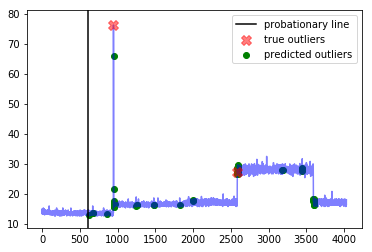




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.15384615384615385
Corresponding window recall:  1.0
Corresponding window false positives:  11
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [625, 922, 924, 996, 997, 1209, 1211, 1212, 1213, 1280, 1282, 1283, 1284, 1285, 1286, 1721, 1723, 2087, 2388, 2427, 2428, 2431, 2928, 2929, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3096, 3097, 3421, 3451, 3582, 3583, 3584, 3585, 3905, 3954, 3955, 3956]


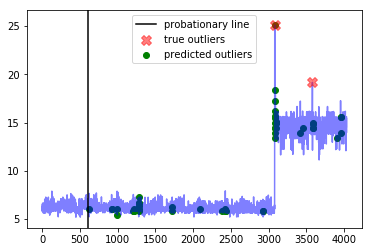




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1433, 1779, 3568, 3569, 3570, 3571, 3572, 3573, 3574, 3575, 3576, 3577, 3578, 3579, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596]


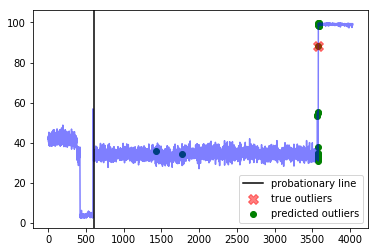




--- artificial_cd_3 ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 202, 203, 204, 205, 206, 207, 208, 402, 403, 404, 405, 406, 407, 602, 603, 604, 605, 606, 607, 610, 611, 613, 614, 615, 616, 617, 618, 619, 620, 621, 622, 802, 803, 804, 805, 806]


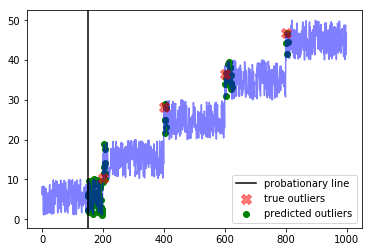




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 1272, 1273, 1274, 2969, 2971, 2972, 2973, 2974, 2975, 2976, 3202, 3273, 3274, 3275, 3574, 3575, 3957]


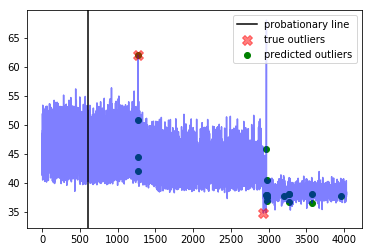




--- grok_asg_anomaly ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  10
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [777, 831, 832, 833, 834, 835, 856, 857, 858, 859, 860, 861, 862, 863, 864, 865, 875, 876, 877, 878, 879, 880, 881, 882, 883, 971, 1030, 1031, 1032, 1094, 1202, 1203, 1204, 1205, 1570, 1571, 1572, 1573, 1574, 1733, 1734, 1916, 1917, 2133, 2134, 2135, 2136, 2332, 3160, 3161, 3182, 3626, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3781, 3791, 4425, 4426, 4427, 4428, 4429, 4430, 4431, 4432, 4433, 4434, 4435, 4436, 4437, 4438, 4448]


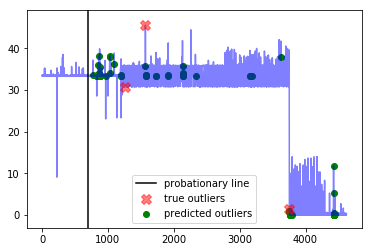




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  8
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [686, 687, 688, 689, 794, 795, 796, 797, 798, 974, 975, 976, 977, 1078, 1079, 1082, 1083, 1084, 1085, 1086, 1087, 1263, 1264, 1265, 1266, 1371, 1372, 1552, 1553, 1653, 1654, 1655, 1659, 1660, 1661, 1838, 1839, 1840, 1841, 1947, 1948, 1949, 1950, 2129, 2235, 2236, 2237, 2415, 2416, 2417, 2518, 2523, 2524, 2525, 2526, 2704, 2705, 2811, 2812, 2813, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3287, 3288, 3289, 3290, 3291, 3292, 3294, 3295, 3296, 3297, 3298, 3299, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313, 3314, 3315, 3316, 3317, 3318, 3319, 3320, 3321, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332, 3333, 3334, 3335, 3336, 3337, 3338, 3339, 3346, 3347, 3348, 3349, 3350, 3351, 3352, 3353, 3354, 3355, 3381

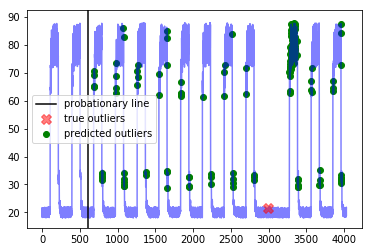




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [204, 602, 603, 604, 605, 606]


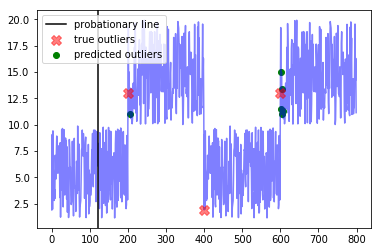




--- artificial_cd_2 ---
Corresponding window precision:  0.46153846153846156
Corresponding window recall:  0.75
Corresponding window false positives:  7
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [310, 403, 404, 405, 406, 407, 603, 604, 605, 606, 743, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 1001, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009, 1010, 1203, 1204, 1205, 1208, 1403, 1404, 1405, 1603, 1604, 1605, 1606]


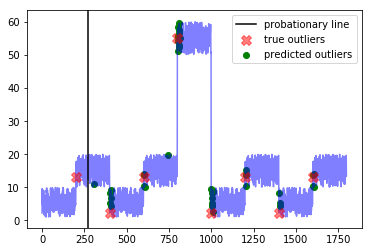




--- art_daily_flatmiddle ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [686, 687, 688, 689, 690, 789, 790, 796, 974, 975, 976, 977, 1083, 1262, 1263, 1264, 1265, 1266, 1267, 1365, 1366, 1367, 1371, 1372, 1373, 1374, 1375, 1551, 1552, 1658, 1659, 1660, 1661, 1662, 1838, 1839, 1840, 1841, 1942, 1943, 1947, 1948, 1949, 2127, 2128, 2129, 2235, 2236, 2237, 2360, 2361, 2362, 2415, 2416, 2417, 2418, 2523, 2524, 2525, 2526, 2703, 2704, 2705, 2706, 2707, 2812, 2813, 3158, 3159, 3160, 3161, 3166, 3167, 3168, 3169, 3170, 3171, 3172, 3278, 3279, 3280, 3281, 3282, 3387, 3566, 3567, 3568, 3569, 3572, 3573, 3574, 3674, 3675, 3676, 3677, 3678, 3855, 3856, 3857, 3957, 3958, 3963, 3964, 3965]


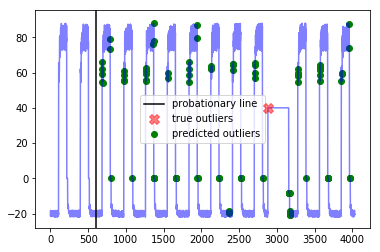

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  16.6
Best window threshold:  0.9999
Corresponding window overall precision:  0.2169811320754717
Corresponding window overall recall:  0.8518518518518519
Corresponding window overall F score:  0.3458646616541354



--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  6
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [622, 672, 674, 865, 947, 948, 949, 950, 951, 952, 953, 954, 962, 1250, 1251, 1252, 1484, 1485, 1824, 1996, 1997, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 3181, 3187, 3447, 3448, 3449, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603]


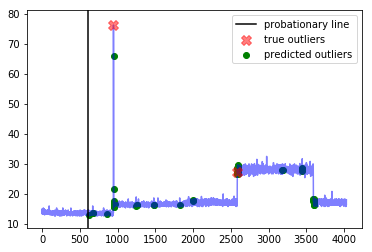




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.15384615384615385
Corresponding window recall:  1.0
Corresponding window false positives:  11
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [625, 922, 924, 996, 997, 1209, 1211, 1212, 1213, 1280, 1282, 1283, 1284, 1285, 1286, 1721, 1723, 2087, 2388, 2427, 2428, 2431, 2928, 2929, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3096, 3097, 3421, 3451, 3582, 3583, 3584, 3585, 3905, 3954, 3955, 3956]


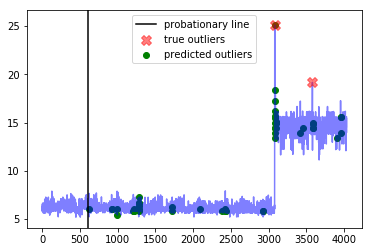




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1433, 1779, 3568, 3569, 3570, 3571, 3572, 3573, 3574, 3575, 3576, 3577, 3578, 3579, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596]


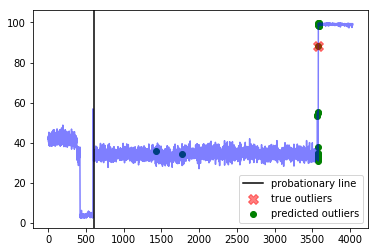




--- artificial_cd_3 ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 202, 203, 204, 205, 206, 207, 208, 402, 403, 404, 405, 406, 407, 602, 603, 604, 605, 606, 607, 610, 611, 613, 614, 615, 616, 617, 618, 619, 620, 621, 622, 802, 803, 804, 805, 806]


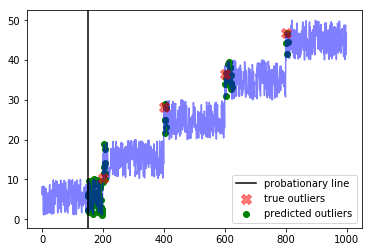




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 1272, 1273, 1274, 2969, 2971, 2972, 2973, 2974, 2975, 2976, 3202, 3273, 3274, 3275, 3574, 3575, 3957]


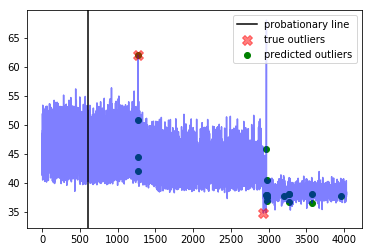




--- grok_asg_anomaly ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  10
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [777, 831, 832, 833, 834, 835, 856, 857, 858, 859, 860, 861, 862, 863, 864, 865, 875, 876, 877, 878, 879, 880, 881, 882, 883, 971, 1030, 1031, 1032, 1094, 1202, 1203, 1204, 1205, 1570, 1571, 1572, 1573, 1574, 1733, 1734, 1916, 1917, 2133, 2134, 2135, 2136, 2332, 3160, 3161, 3182, 3626, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3781, 3791, 4425, 4426, 4427, 4428, 4429, 4430, 4431, 4432, 4433, 4434, 4435, 4436, 4437, 4438, 4448]


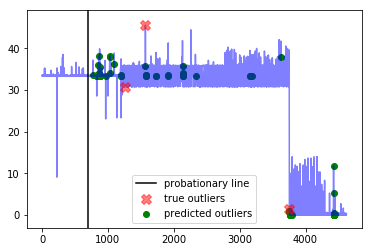




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  8
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [686, 687, 688, 689, 794, 795, 796, 797, 798, 974, 975, 976, 977, 1078, 1079, 1082, 1083, 1084, 1085, 1086, 1087, 1263, 1264, 1265, 1266, 1371, 1372, 1552, 1553, 1653, 1654, 1655, 1659, 1660, 1661, 1838, 1839, 1840, 1841, 1947, 1948, 1949, 1950, 2129, 2235, 2236, 2237, 2415, 2416, 2417, 2518, 2523, 2524, 2525, 2526, 2704, 2705, 2811, 2812, 2813, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3287, 3288, 3289, 3290, 3291, 3292, 3294, 3295, 3296, 3297, 3298, 3299, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313, 3314, 3315, 3316, 3317, 3318, 3319, 3320, 3321, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332, 3333, 3334, 3335, 3336, 3337, 3338, 3339, 3346, 3347, 3348, 3349, 3350, 3351, 3352, 3353, 3354, 3355, 3381

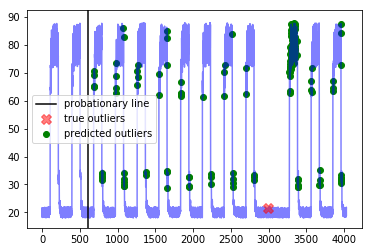




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [204, 602, 603, 604, 605, 606]


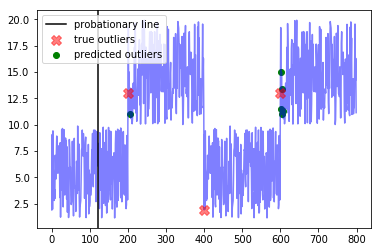




--- artificial_cd_2 ---
Corresponding window precision:  0.46153846153846156
Corresponding window recall:  0.75
Corresponding window false positives:  7
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [310, 403, 404, 405, 406, 407, 603, 604, 605, 606, 743, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 1001, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009, 1010, 1203, 1204, 1205, 1208, 1403, 1404, 1405, 1603, 1604, 1605, 1606]


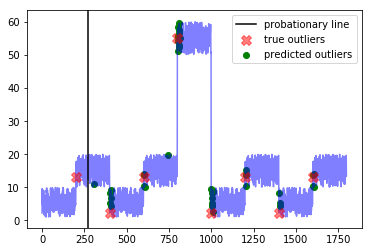




--- art_daily_flatmiddle ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [686, 687, 688, 689, 690, 789, 790, 796, 974, 975, 976, 977, 1083, 1262, 1263, 1264, 1265, 1266, 1267, 1365, 1366, 1367, 1371, 1372, 1373, 1374, 1375, 1551, 1552, 1658, 1659, 1660, 1661, 1662, 1838, 1839, 1840, 1841, 1942, 1943, 1947, 1948, 1949, 2127, 2128, 2129, 2235, 2236, 2237, 2360, 2361, 2362, 2415, 2416, 2417, 2418, 2523, 2524, 2525, 2526, 2703, 2704, 2705, 2706, 2707, 2812, 2813, 3158, 3159, 3160, 3161, 3166, 3167, 3168, 3169, 3170, 3171, 3172, 3278, 3279, 3280, 3281, 3282, 3387, 3566, 3567, 3568, 3569, 3572, 3573, 3574, 3674, 3675, 3676, 3677, 3678, 3855, 3856, 3857, 3957, 3958, 3963, 3964, 3965]


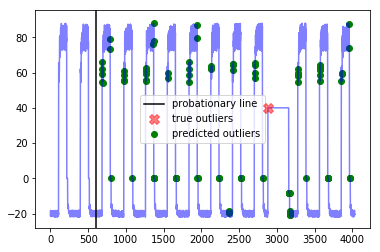

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.599999999999998
Best window threshold:  1.0
Corresponding window overall precision:  0.47619047619047616
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.4166666666666667



--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 948, 949, 950, 951, 952, 953, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 3595, 3596, 3597, 3598, 3599]


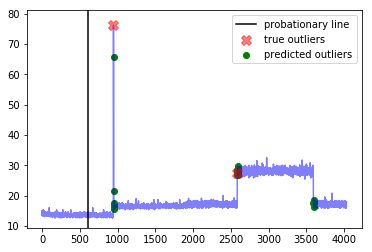




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093]


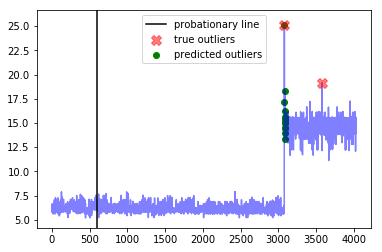




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3570, 3571, 3572, 3573, 3574, 3575, 3576, 3577, 3578, 3579, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595]


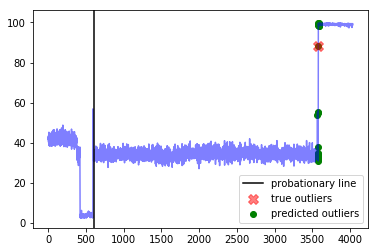




--- artificial_cd_3 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 616, 619]


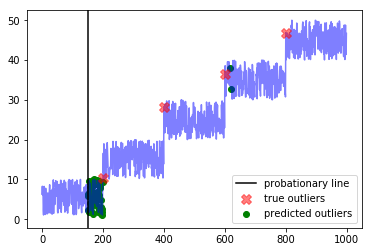




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2971, 2972, 2973, 2974, 2975]


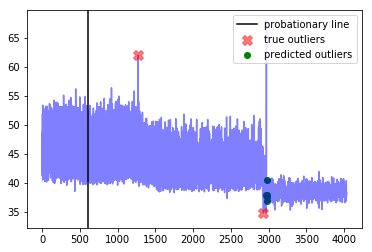




--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [875, 876, 877, 878, 879, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 4425, 4426, 4427, 4428, 4429, 4430, 4431, 4432, 4433]


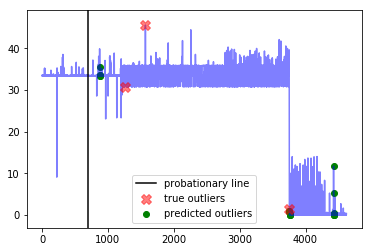




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [797, 3277, 3278, 3279, 3280, 3281, 3282, 3284, 3288, 3289, 3290, 3295, 3299, 3302, 3329, 3331, 3332, 3389]


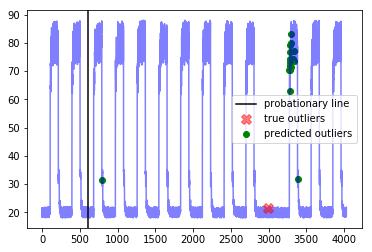




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


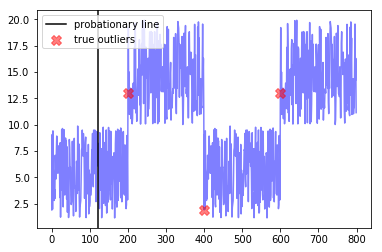




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 1001, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009]


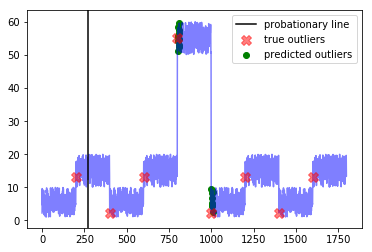




--- art_daily_flatmiddle ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [976, 977, 1263, 1264, 1265, 1266, 1660, 1661, 3160, 3161]


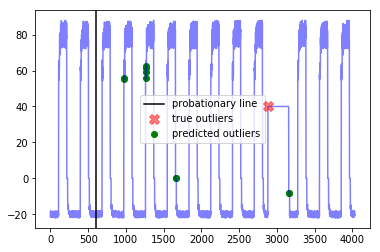

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.8
Best window threshold:  1.0
Corresponding window overall precision:  0.47619047619047616
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.4166666666666667



--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 948, 949, 950, 951, 952, 953, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 3595, 3596, 3597, 3598, 3599]


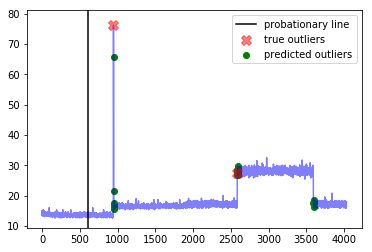




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093]


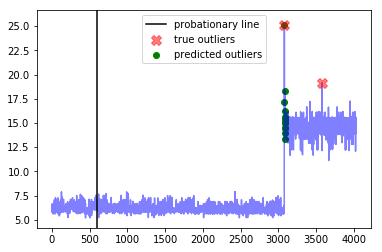




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3570, 3571, 3572, 3573, 3574, 3575, 3576, 3577, 3578, 3579, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595]


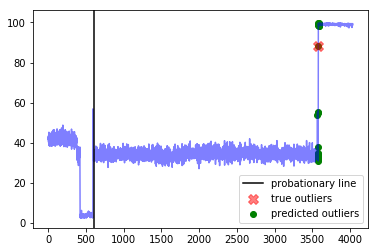




--- artificial_cd_3 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 616, 619]


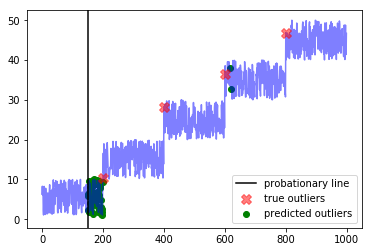




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2971, 2972, 2973, 2974, 2975]


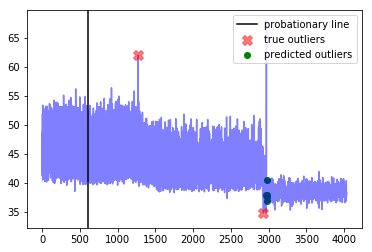




--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [875, 876, 877, 878, 879, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 4425, 4426, 4427, 4428, 4429, 4430, 4431, 4432, 4433]


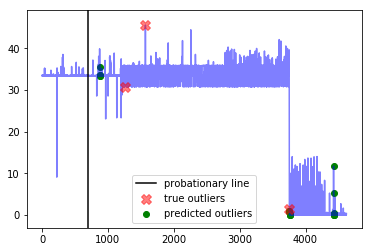




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [797, 3277, 3278, 3279, 3280, 3281, 3282, 3284, 3288, 3289, 3290, 3295, 3299, 3302, 3329, 3331, 3332, 3389]


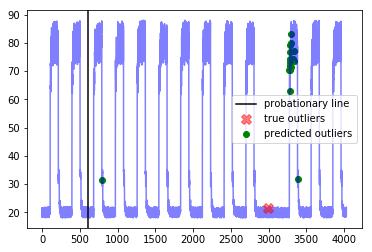




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


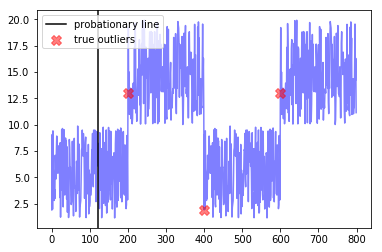




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 1001, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009]


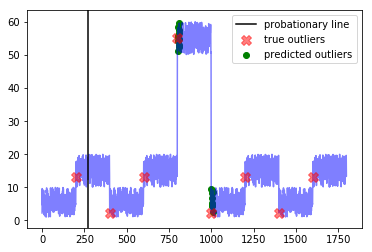




--- art_daily_flatmiddle ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [976, 977, 1263, 1264, 1265, 1266, 1660, 1661, 3160, 3161]


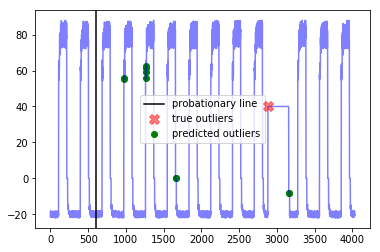

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  23.0
Best window threshold:  1.0
Corresponding window overall precision:  0.47619047619047616
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.4166666666666667



--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 948, 949, 950, 951, 952, 953, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 3595, 3596, 3597, 3598, 3599]


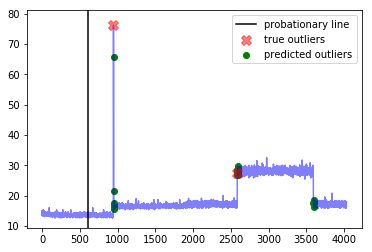




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093]


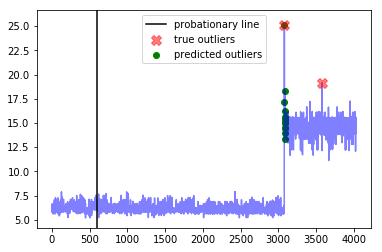




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3570, 3571, 3572, 3573, 3574, 3575, 3576, 3577, 3578, 3579, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595]


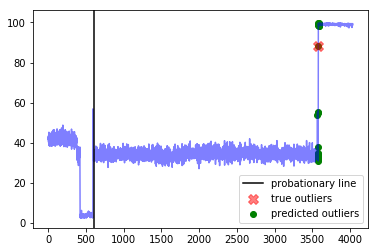




--- artificial_cd_3 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 616, 619]


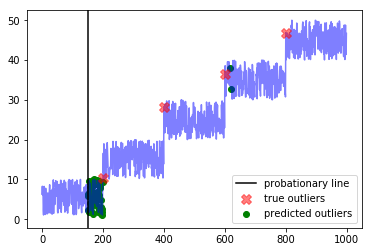




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2971, 2972, 2973, 2974, 2975]


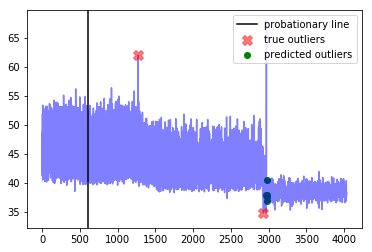




--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [875, 876, 877, 878, 879, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 4425, 4426, 4427, 4428, 4429, 4430, 4431, 4432, 4433]


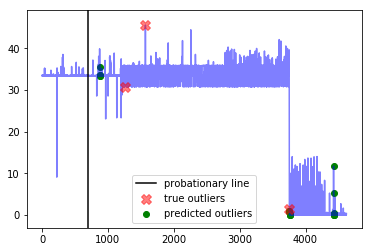




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [797, 3277, 3278, 3279, 3280, 3281, 3282, 3284, 3288, 3289, 3290, 3295, 3299, 3302, 3329, 3331, 3332, 3389]


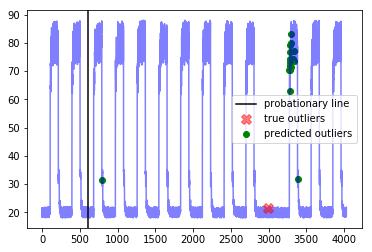




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


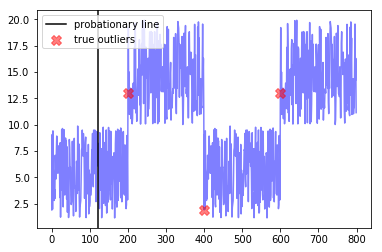




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 1001, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009]


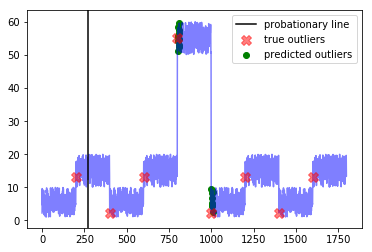




--- art_daily_flatmiddle ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [976, 977, 1263, 1264, 1265, 1266, 1660, 1661, 3160, 3161]


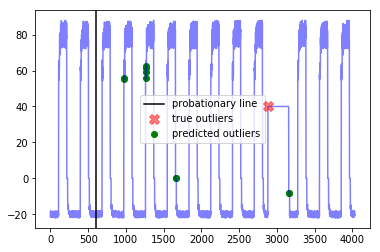

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  24.2
Best window threshold:  1.0
Corresponding window overall precision:  0.47619047619047616
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.4166666666666667



--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 948, 949, 950, 951, 952, 953, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 3595, 3596, 3597, 3598, 3599]


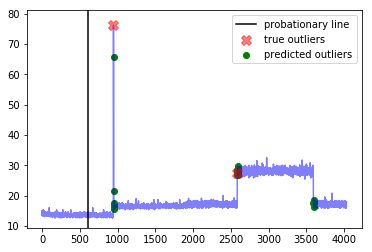




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093]


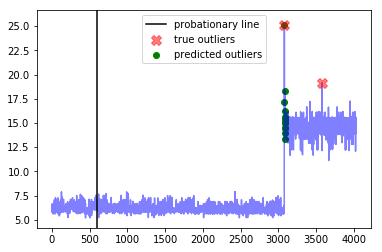




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3570, 3571, 3572, 3573, 3574, 3575, 3576, 3577, 3578, 3579, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595]


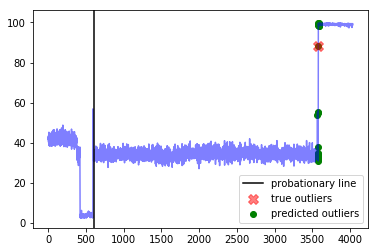




--- artificial_cd_3 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 616, 619]


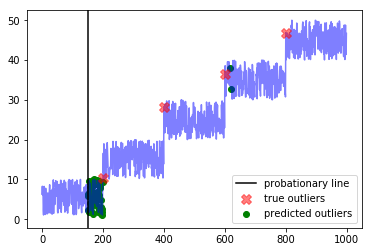




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2971, 2972, 2973, 2974, 2975]


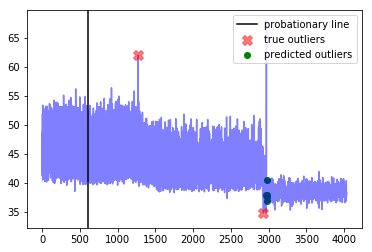




--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [875, 876, 877, 878, 879, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 4425, 4426, 4427, 4428, 4429, 4430, 4431, 4432, 4433]


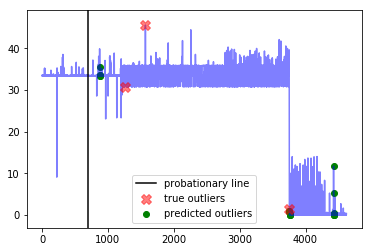




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [797, 3277, 3278, 3279, 3280, 3281, 3282, 3284, 3288, 3289, 3290, 3295, 3299, 3302, 3329, 3331, 3332, 3389]


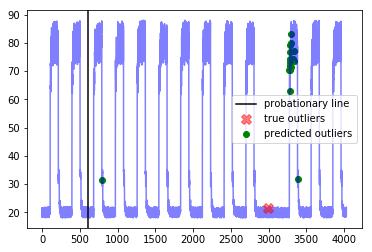




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


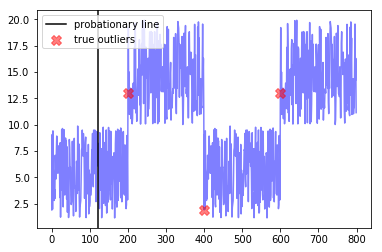




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 1001, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009]


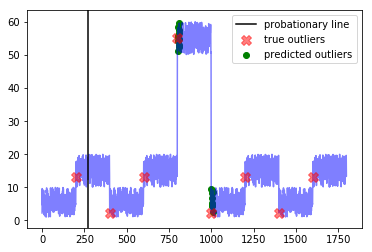




--- art_daily_flatmiddle ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [976, 977, 1263, 1264, 1265, 1266, 1660, 1661, 3160, 3161]


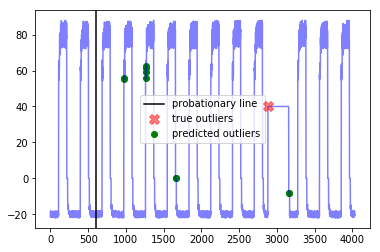

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  25.4
Best window threshold:  1.0
Corresponding window overall precision:  0.47619047619047616
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.4166666666666667



--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 948, 949, 950, 951, 952, 953, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 3595, 3596, 3597, 3598, 3599]


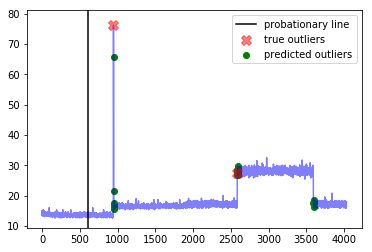




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093]


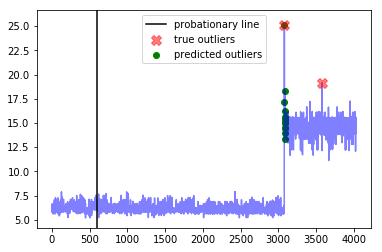




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3570, 3571, 3572, 3573, 3574, 3575, 3576, 3577, 3578, 3579, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595]


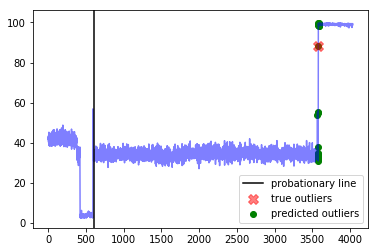




--- artificial_cd_3 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 616, 619]


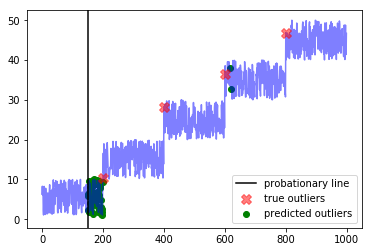




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2971, 2972, 2973, 2974, 2975]


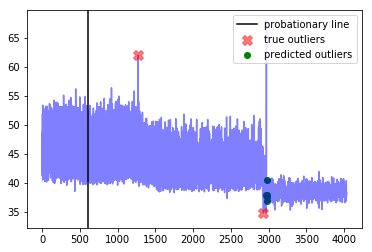




--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [875, 876, 877, 878, 879, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 4425, 4426, 4427, 4428, 4429, 4430, 4431, 4432, 4433]


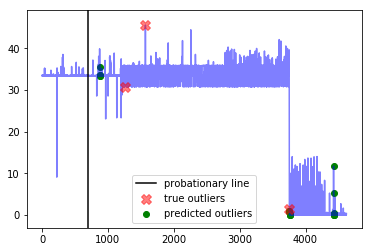




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [797, 3277, 3278, 3279, 3280, 3281, 3282, 3284, 3288, 3289, 3290, 3295, 3299, 3302, 3329, 3331, 3332, 3389]


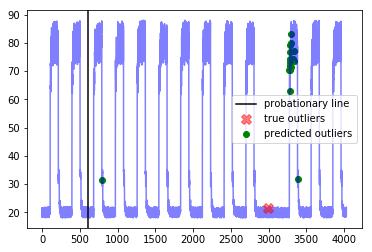




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


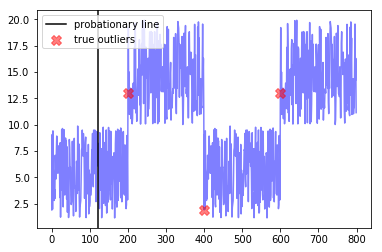




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 1001, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009]


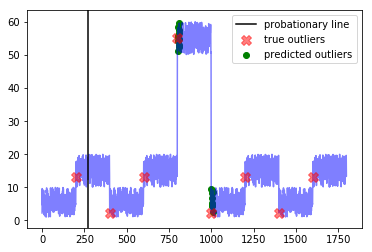




--- art_daily_flatmiddle ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [976, 977, 1263, 1264, 1265, 1266, 1660, 1661, 3160, 3161]


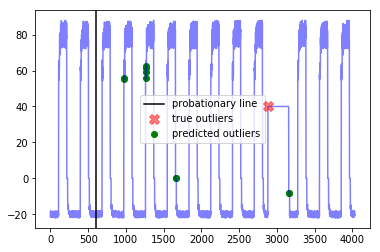

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  26.6
Best window threshold:  1.0
Corresponding window overall precision:  0.47619047619047616
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.4166666666666667



--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 948, 949, 950, 951, 952, 953, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 3595, 3596, 3597, 3598, 3599]


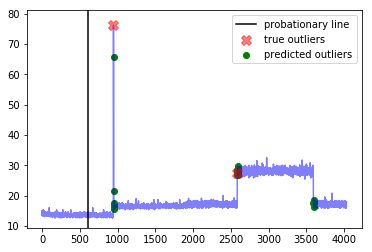




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093]


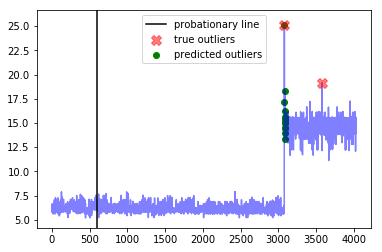




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3570, 3571, 3572, 3573, 3574, 3575, 3576, 3577, 3578, 3579, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595]


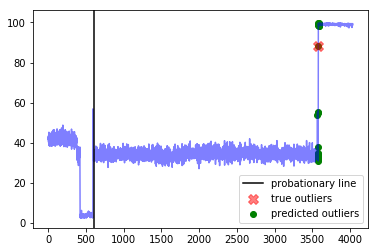




--- artificial_cd_3 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 616, 619]


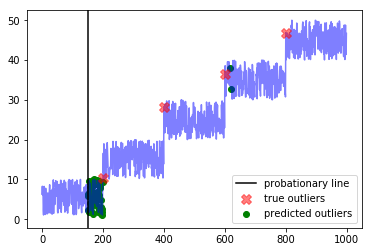




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2971, 2972, 2973, 2974, 2975]


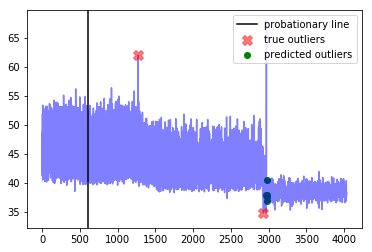




--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [875, 876, 877, 878, 879, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 4425, 4426, 4427, 4428, 4429, 4430, 4431, 4432, 4433]


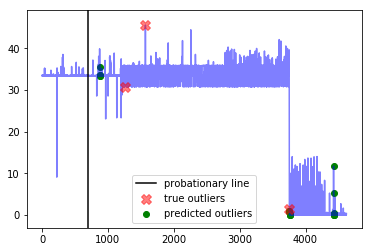




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [797, 3277, 3278, 3279, 3280, 3281, 3282, 3284, 3288, 3289, 3290, 3295, 3299, 3302, 3329, 3331, 3332, 3389]


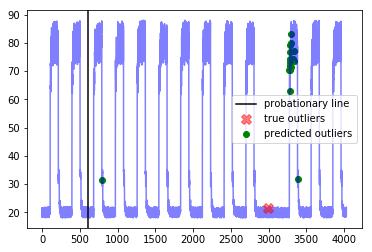




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


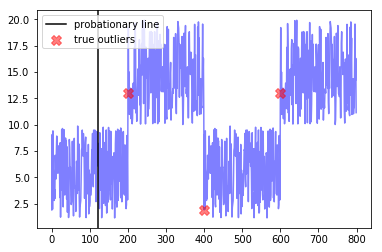




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 1001, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009]


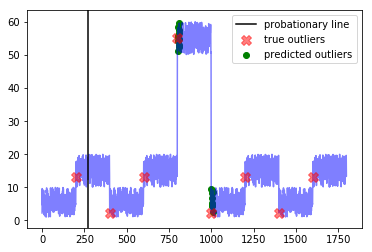




--- art_daily_flatmiddle ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [976, 977, 1263, 1264, 1265, 1266, 1660, 1661, 3160, 3161]


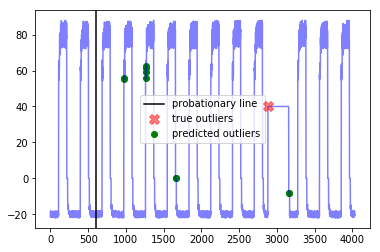

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  27.8
Best window threshold:  1.0
Corresponding window overall precision:  0.47619047619047616
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.4166666666666667



--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 948, 949, 950, 951, 952, 953, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 3595, 3596, 3597, 3598, 3599]


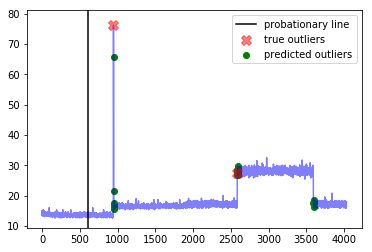




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093]


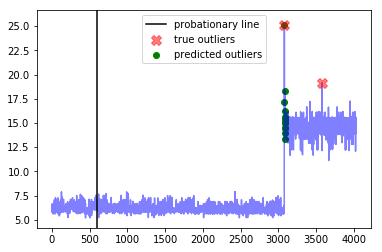




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3570, 3571, 3572, 3573, 3574, 3575, 3576, 3577, 3578, 3579, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595]


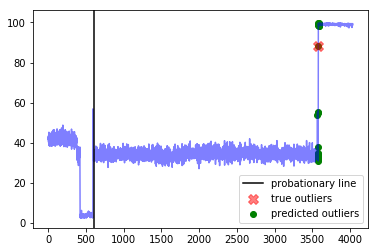




--- artificial_cd_3 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 616, 619]


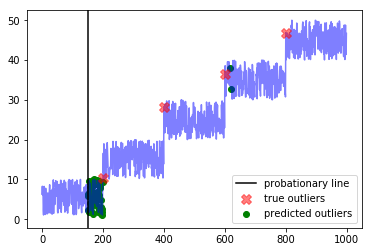




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2971, 2972, 2973, 2974, 2975]


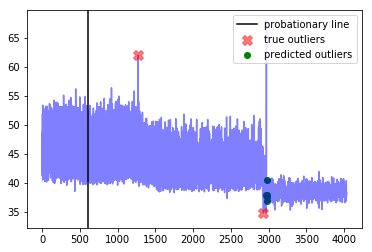




--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [875, 876, 877, 878, 879, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 4425, 4426, 4427, 4428, 4429, 4430, 4431, 4432, 4433]


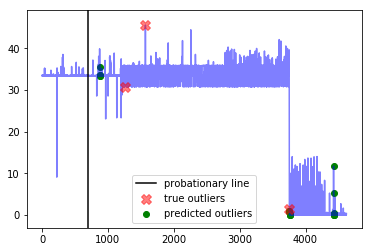




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [797, 3277, 3278, 3279, 3280, 3281, 3282, 3284, 3288, 3289, 3290, 3295, 3299, 3302, 3329, 3331, 3332, 3389]


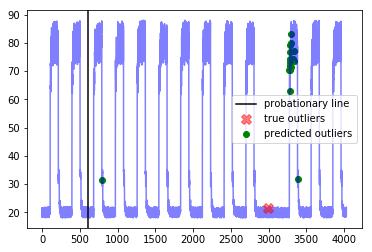




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


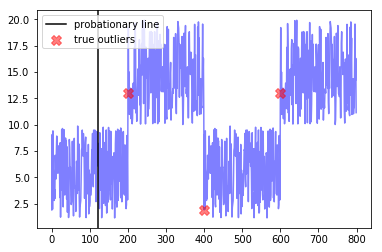




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 1001, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009]


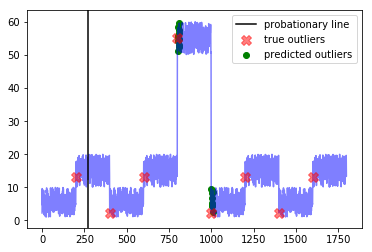




--- art_daily_flatmiddle ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [976, 977, 1263, 1264, 1265, 1266, 1660, 1661, 3160, 3161]


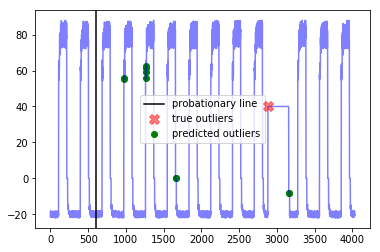

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  29.0
Best window threshold:  1.0
Corresponding window overall precision:  0.47619047619047616
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.4166666666666667



--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 948, 949, 950, 951, 952, 953, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 3595, 3596, 3597, 3598, 3599]


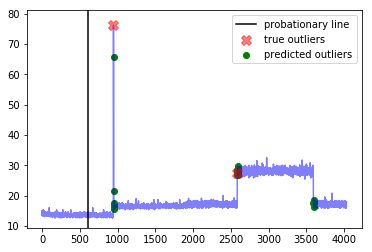




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093]


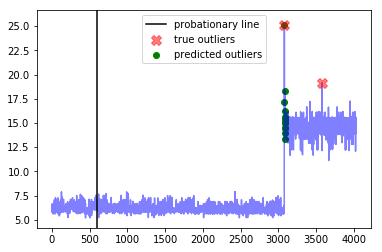




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3570, 3571, 3572, 3573, 3574, 3575, 3576, 3577, 3578, 3579, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595]


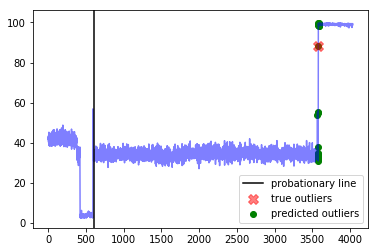




--- artificial_cd_3 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 616, 619]


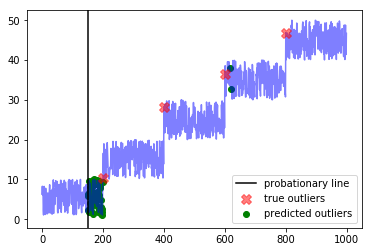




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2971, 2972, 2973, 2974, 2975]


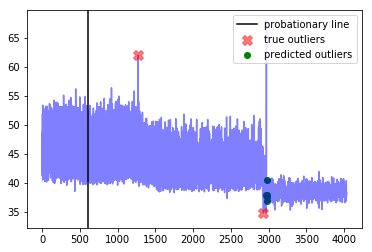




--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [875, 876, 877, 878, 879, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 4425, 4426, 4427, 4428, 4429, 4430, 4431, 4432, 4433]


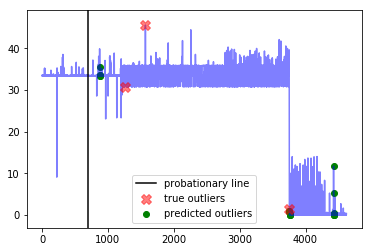




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [797, 3277, 3278, 3279, 3280, 3281, 3282, 3284, 3288, 3289, 3290, 3295, 3299, 3302, 3329, 3331, 3332, 3389]


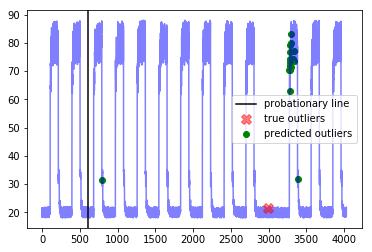




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


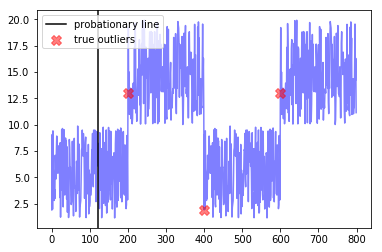




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 1001, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009]


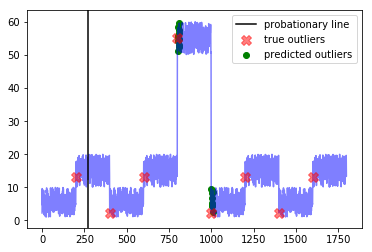




--- art_daily_flatmiddle ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [976, 977, 1263, 1264, 1265, 1266, 1660, 1661, 3160, 3161]


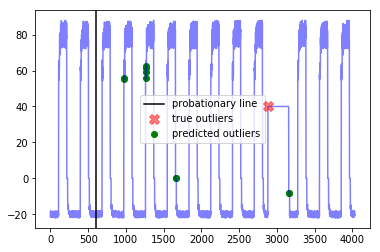

------------
False Positive Weight:  0.1
	 Corresponding window overall F score : 0.3458646616541354
	 Corresponding window overall recall : 0.8518518518518519
	 Corresponding window overall precision : 0.2169811320754717
	 Best window threshold : 0.9999
	 Minimum number of mistakes : 10.8
False Positive Weight:  0.2
	 Corresponding window overall F score : 0.3458646616541354
	 Corresponding window overall recall : 0.8518518518518519
	 Corresponding window overall precision : 0.2169811320754717
	 Best window threshold : 0.9999
	 Minimum number of mistakes : 16.6
False Positive Weight:  0.3
	 Corresponding window overall F score : 0.4166666666666667
	 Corresponding window overall recall : 0.37037037037037035
	 Corresponding window overall precision : 0.47619047619047616
	 Best window threshold : 1.0
	 Minimum number of mistakes : 20.599999999999998
False Positive Weight:  0.6
	 Corresponding window overall F score : 0.4166666666666667
	 Corresponding window overall recall : 0.3703703703

In [16]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# HTM Results

In [23]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_htm = joblib.load("anomaly_scores/HTM/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_htm["Anomaly Scores"]

In [24]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.2: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.3: {'precision': 0.16666666666666666, 'recall': 1.0},
 0.4: {'precision': 0.3333333333333333, 'recall': 1.0},
 0.5: {'precision': 0.3333333333333333, 'recall': 1.0},
 0.6: {'precision': 1.0, 'recall': 1.0},
 0.7: {'precision': 1.0, 'recall': 1.0},
 0.8: {'precision': 1.0, 'recall': 1.0},
 0.9: {'precision': 0.0, 'recall': 0.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  12.600000000000001
Best window threshold:  0.0562
Corresponding window overall precision:  0.18487394957983194
Corresponding window overall recall:  0.8148148148148148
Corresponding window overall F score:  0.30136986301369867



--- artificial_cd_3 ---
Corresponding window precision:  0.42857142857142855
Corresponding window recall:  0.75
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 451, 452, 453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466, 471, 472, 473, 474, 475, 476, 477, 478, 479, 480, 481, 482, 483, 486, 487, 488, 489, 490, 

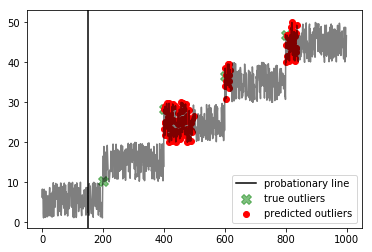




--- artificial_cd_1 ---
Corresponding window precision:  0.18181818181818182
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [388, 389, 390, 391, 392, 531, 532, 533, 534, 535, 536, 537, 538, 539, 540, 554, 555, 556, 557, 558, 559, 560, 561, 562, 563, 595, 596, 597, 598, 599, 600, 601, 602, 603, 604, 608, 609, 623, 624, 625, 626, 627, 628, 648, 649, 650, 651, 657, 659, 660, 661, 662, 663, 664, 665, 666, 667, 668, 669, 670, 671, 672, 673, 674, 675, 676, 677, 680, 681, 682, 683, 685, 686, 687, 688, 689, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 721, 722, 723, 724, 725, 761, 762, 763, 764, 765, 766, 767, 769, 770, 773, 774, 775, 776, 777, 778]


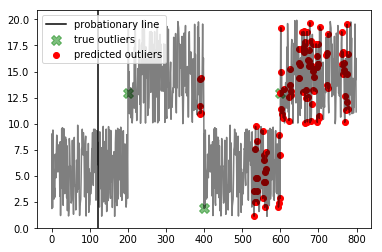




--- grok_asg_anomaly ---
Corresponding window precision:  0.15789473684210525
Corresponding window recall:  1.0
Corresponding window false positives:  16
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [773, 774, 775, 776, 777, 778, 779, 780, 781, 830, 831, 832, 833, 834, 835, 836, 837, 838, 839, 840, 860, 861, 862, 863, 864, 865, 866, 867, 868, 869, 874, 875, 876, 877, 878, 879, 880, 881, 882, 883, 884, 955, 956, 957, 958, 959, 960, 961, 962, 963, 966, 967, 968, 969, 970, 971, 972, 973, 974, 975, 976, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009, 1010, 1011, 1012, 1027, 1028, 1029, 1030, 1031, 1032, 1033, 1034, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1044, 1045, 1046, 1047, 1048, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1104, 1134, 1135, 1136, 1137, 1138, 1139, 1140, 1141, 1142, 1143, 1200, 1201, 1202, 1203, 1204, 1205, 1206, 1207, 1208, 1209, 1257, 1258, 1259, 1262, 1569, 1570, 1571, 1572, 1573,

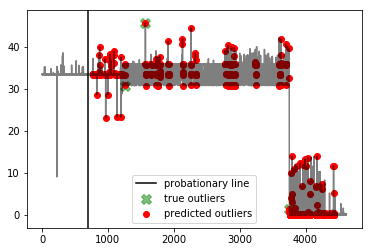




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 950, 951, 952, 953, 954, 955, 956, 957, 958, 959, 960, 961, 962, 963, 964, 965, 966, 967, 968, 969, 970, 971, 972, 973, 974, 975, 976, 977, 978, 979, 980, 981, 982, 983, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3840, 3841, 3842, 3843, 3844, 3845, 3846, 3847, 3848, 3849]


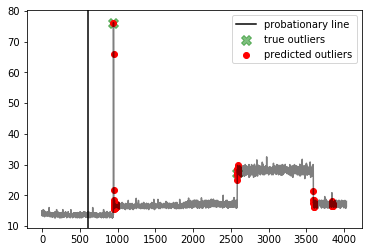




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [993, 994, 995, 996, 997, 998, 999, 1000, 1001, 2427, 2428, 2429, 2430, 2431, 2432, 2433, 2434, 2435, 2436, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3160, 3161, 3162, 3163, 3164, 3165, 3166, 3167, 3168, 3169, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3464, 3465, 3466, 3467, 3468, 3469, 3470, 3471, 3472, 3473, 3519, 3520, 3521, 3522, 3523, 3524, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3669, 3670, 3671, 3672, 3673, 367

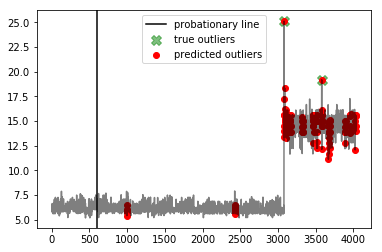




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [605, 606, 607, 608, 609, 3567, 3568, 3569, 3570, 3571, 3572, 3573, 3574, 3575, 3576, 3577, 3578, 3579, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592]


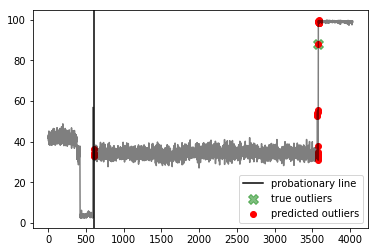




--- art_daily_nojump ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 792, 793, 794, 795, 796, 797, 798, 799, 800, 801, 972, 973, 974, 975, 976, 977, 978, 979, 980, 981, 1080, 1081, 1082, 1083, 1084, 1085, 1086, 1087, 1088, 1089, 1092, 1100, 1101, 1103, 1104, 1105, 1260, 1261, 1262, 1263, 1264, 1265, 1266, 1267, 1268, 1269, 1368, 1369, 1370, 1371, 1372, 1373, 1374, 1375, 1376, 1377, 1548, 1549, 1550, 1551, 1552, 1553, 1554, 1555, 1556, 1557, 1656, 1657, 1658, 1659, 1660, 1661, 1662, 1663, 1664, 1665, 1673, 1674, 1675, 1676, 1677, 1678, 1679, 1680, 1836, 1837, 1838, 1839, 1840, 1841, 1842, 1843, 1844, 1845, 1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1960, 1966, 1967, 1968, 1969, 2232, 2233, 2234, 2235, 2

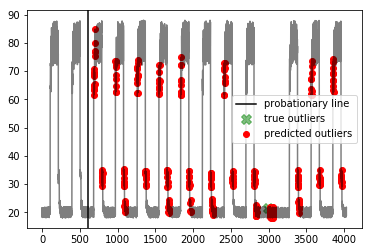




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.15384615384615385
Corresponding window recall:  1.0
Corresponding window false positives:  11
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [669, 670, 671, 672, 673, 674, 675, 676, 677, 725, 726, 727, 730, 731, 732, 733, 734, 778, 787, 885, 886, 887, 888, 889, 890, 909, 919, 920, 921, 922, 923, 924, 925, 926, 927, 928, 999, 1000, 1001, 1016, 1017, 1018, 1218, 1219, 1220, 1221, 1222, 1223, 1224, 1225, 1226, 1227, 1270, 1271, 1272, 1273, 1274, 1275, 1276, 1277, 1278, 1279, 1280, 1281, 1330, 1331, 1332, 1333, 1334, 1335, 1336, 1337, 1338, 1339, 1342, 1354, 1361, 1362, 1363, 1365, 1366, 1367, 1368, 1369, 1370, 1371, 1376, 1377, 1378, 1379, 1384, 1385, 1404, 1405, 1406, 1407, 1408, 1409, 1410, 1411, 1412, 1413, 1449, 1450, 1451, 1452, 1453, 1454, 1455, 1456, 1457, 1458, 1459, 1460, 1461, 1462, 1463, 1464, 1465, 1466, 1467, 1468, 1469, 1470, 1471, 1472, 1473, 1474, 1

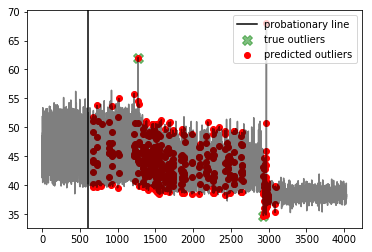




--- artificial_cd_2 ---
Corresponding window precision:  0.29411764705882354
Corresponding window recall:  0.625
Corresponding window false positives:  12
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 450, 453, 454, 455, 456, 457, 458, 459, 461, 462, 464, 465, 466, 467, 468, 469, 470, 479, 480, 481, 484, 485, 486, 487, 488, 524, 603, 604, 645, 646, 650, 652, 654, 800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 828, 829, 830, 831, 833, 834, 835, 836, 867, 869, 870, 871, 872, 873, 874, 875, 876, 881, 882, 883, 884, 885, 886, 887, 888, 889, 1000, 1001, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009, 1401, 1402, 1403, 1404, 1405, 1406, 1407, 1408, 1409]


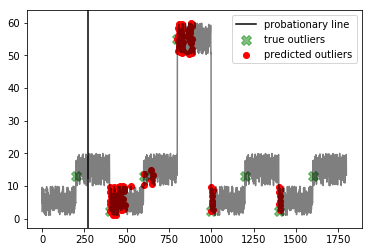




--- art_daily_flatmiddle ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 792, 793, 794, 795, 796, 797, 798, 799, 800, 801, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 972, 973, 974, 975, 976, 977, 978, 979, 980, 981, 982, 983, 984, 985, 986, 987, 988, 989, 990, 991, 992, 996, 1080, 1081, 1082, 1083, 1084, 1085, 1086, 1087, 1088, 1089, 1260, 1261, 1262, 1263, 1264, 1265, 1266, 1267, 1268, 1269, 1368, 1369, 1370, 1371, 1372, 1373, 1374, 1375, 1376, 1377, 1382, 1383, 1384, 1385, 1386, 1387, 1388, 1389, 1390, 1391, 1392, 1393, 1548, 1549, 1550, 1551, 1552, 1553, 1554, 1555, 1556, 1557, 1656, 1657, 1658, 1659, 1660, 1661, 1662, 1663, 1664, 1665, 1669, 1670, 1671, 1672, 1673, 1674, 1675, 1676, 1677,

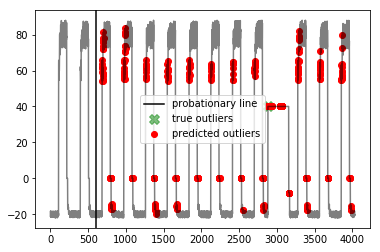

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  14.800000000000002
Best window threshold:  0.3634
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.5925925925925926
Corresponding window overall F score:  0.5245901639344261



--- artificial_cd_3 ---
Corresponding window precision:  0.6
Corresponding window recall:  0.75
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [401, 434, 438, 458, 459, 460, 604, 605, 606, 611, 806, 807, 808, 809, 810]


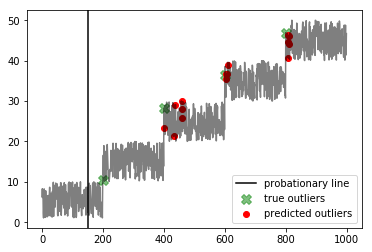




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


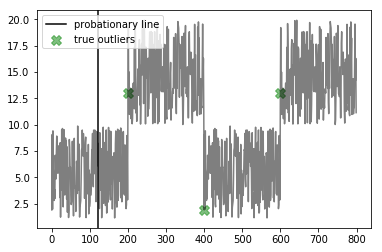




--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [831, 875, 967, 1028, 1029, 1570, 1571, 1572, 1573, 1574, 1575, 1576, 1577, 2132, 2133, 2136, 3754, 3775, 3776, 3796, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3941, 4426]


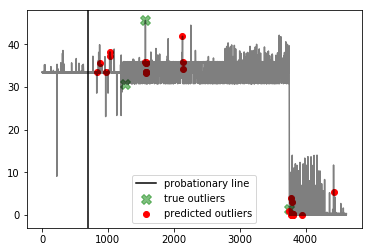




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2586]


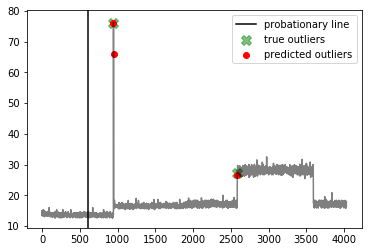




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2427, 2436, 3080, 3081, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3673, 3674]


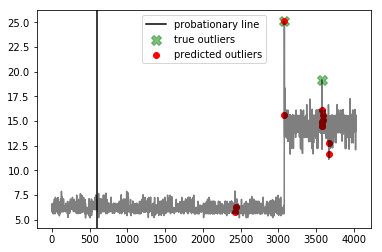




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3568, 3569, 3579, 3580, 3581]


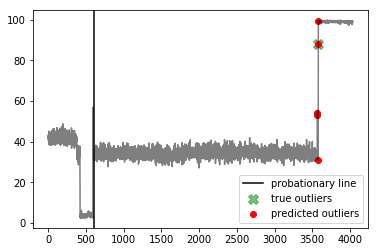




--- art_daily_nojump ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 692, 693, 2254, 2255, 2256, 2258, 2259, 3025, 3026, 3045]


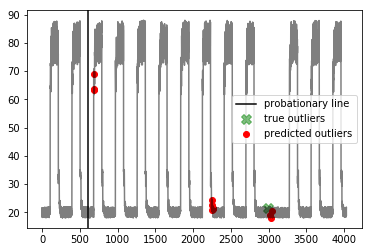




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 1280, 1516, 1517, 1518, 1519, 1521, 1536, 1537, 1538, 1539, 1540, 1541, 1542, 1675, 2929, 2930, 2946, 2947, 2970]


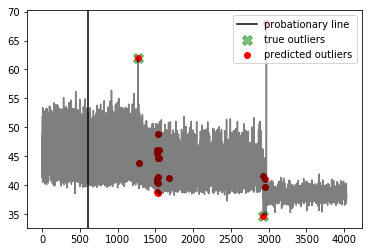




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [406, 431, 432, 434, 801, 826, 827, 828]


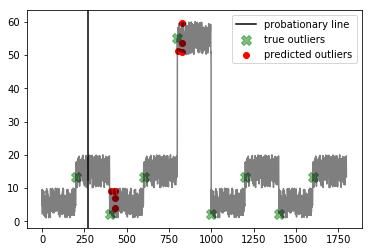




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [693, 2813, 2814, 2815, 2881, 2891, 3279, 3289, 3386, 3387, 3398, 3567, 3568, 3569, 3570, 3571, 3572, 3573, 3860, 3861]


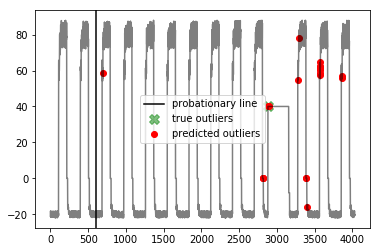

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  16.7
Best window threshold:  0.3634
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.5925925925925926
Corresponding window overall F score:  0.5245901639344261



--- artificial_cd_3 ---
Corresponding window precision:  0.6
Corresponding window recall:  0.75
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [401, 434, 438, 458, 459, 460, 604, 605, 606, 611, 806, 807, 808, 809, 810]


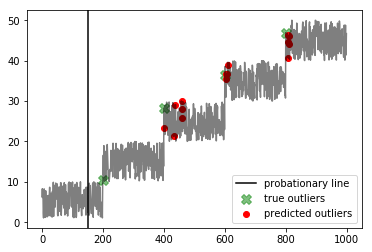




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


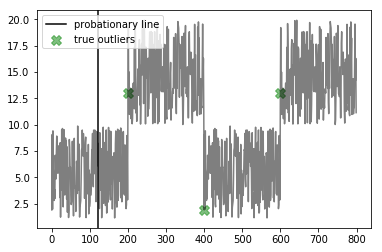




--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [831, 875, 967, 1028, 1029, 1570, 1571, 1572, 1573, 1574, 1575, 1576, 1577, 2132, 2133, 2136, 3754, 3775, 3776, 3796, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3941, 4426]


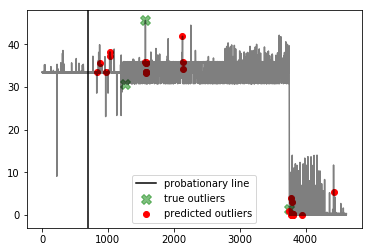




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2586]


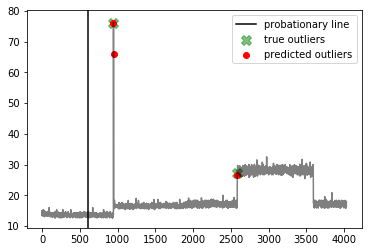




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2427, 2436, 3080, 3081, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3673, 3674]


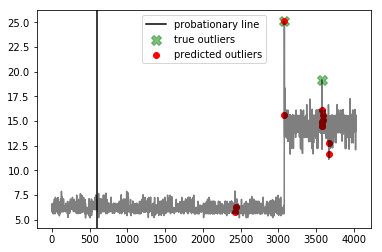




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3568, 3569, 3579, 3580, 3581]


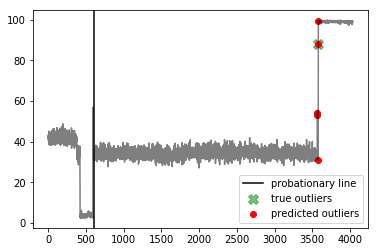




--- art_daily_nojump ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 692, 693, 2254, 2255, 2256, 2258, 2259, 3025, 3026, 3045]


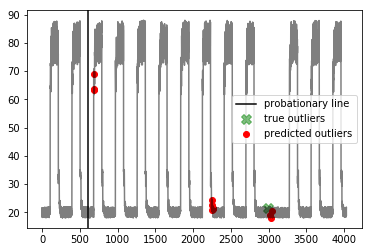




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 1280, 1516, 1517, 1518, 1519, 1521, 1536, 1537, 1538, 1539, 1540, 1541, 1542, 1675, 2929, 2930, 2946, 2947, 2970]


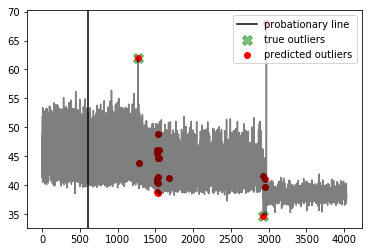




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [406, 431, 432, 434, 801, 826, 827, 828]


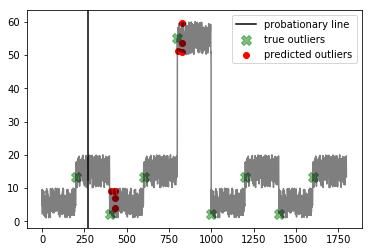




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [693, 2813, 2814, 2815, 2881, 2891, 3279, 3289, 3386, 3387, 3398, 3567, 3568, 3569, 3570, 3571, 3572, 3573, 3860, 3861]


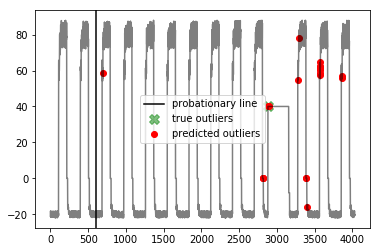

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  18.6
Best window threshold:  0.3634
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.5925925925925926
Corresponding window overall F score:  0.5245901639344261



--- artificial_cd_3 ---
Corresponding window precision:  0.6
Corresponding window recall:  0.75
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [401, 434, 438, 458, 459, 460, 604, 605, 606, 611, 806, 807, 808, 809, 810]


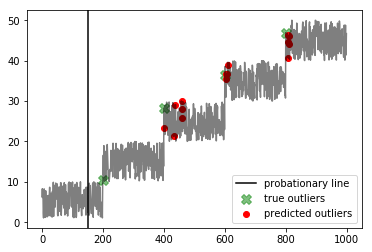




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


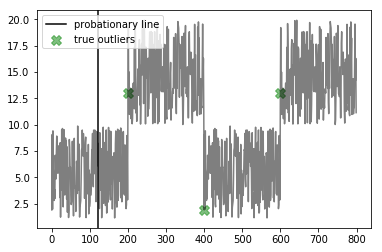




--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [831, 875, 967, 1028, 1029, 1570, 1571, 1572, 1573, 1574, 1575, 1576, 1577, 2132, 2133, 2136, 3754, 3775, 3776, 3796, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3941, 4426]


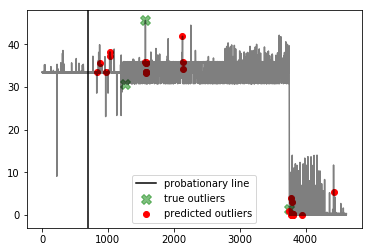




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2586]


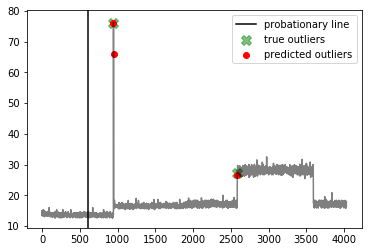




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2427, 2436, 3080, 3081, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3673, 3674]


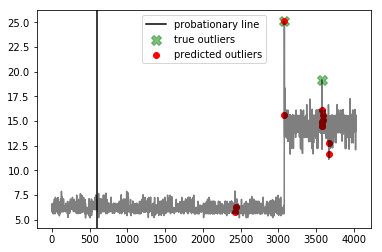




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3568, 3569, 3579, 3580, 3581]


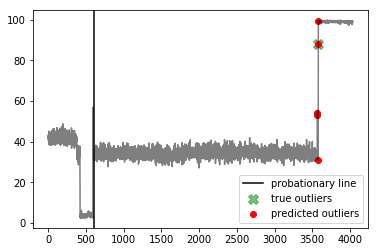




--- art_daily_nojump ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 692, 693, 2254, 2255, 2256, 2258, 2259, 3025, 3026, 3045]


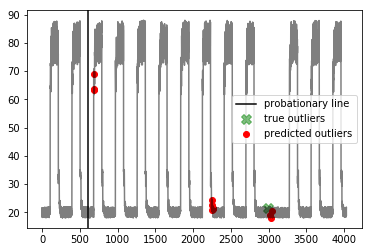




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 1280, 1516, 1517, 1518, 1519, 1521, 1536, 1537, 1538, 1539, 1540, 1541, 1542, 1675, 2929, 2930, 2946, 2947, 2970]


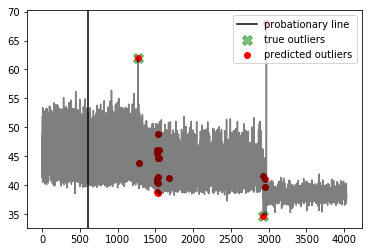




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [406, 431, 432, 434, 801, 826, 827, 828]


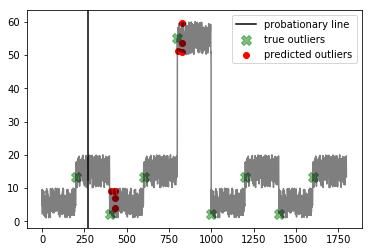




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [693, 2813, 2814, 2815, 2881, 2891, 3279, 3289, 3386, 3387, 3398, 3567, 3568, 3569, 3570, 3571, 3572, 3573, 3860, 3861]


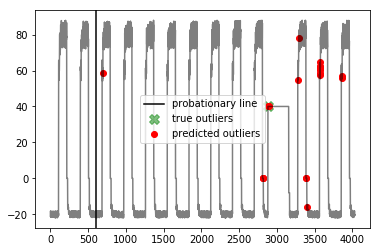

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.5
Best window threshold:  0.6084
Corresponding window overall precision:  0.7142857142857143
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.4878048780487805



--- artificial_cd_3 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [401, 438]


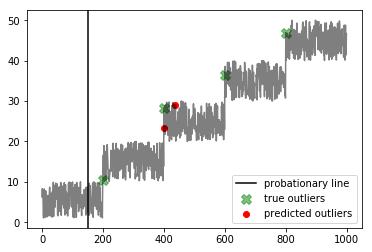




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


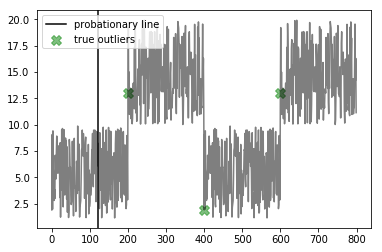




--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [831, 875, 1029, 3754, 3799]


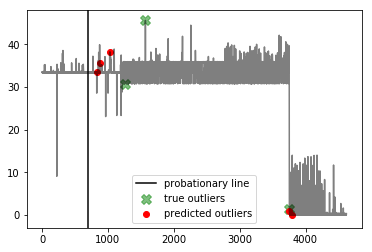




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 2586]


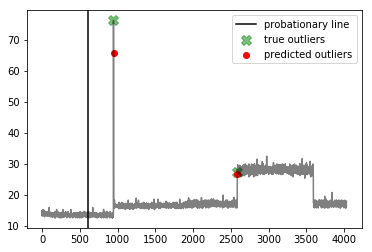




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2427, 3081, 3674]


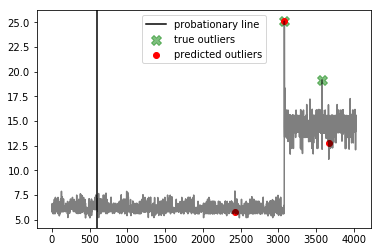




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3581]


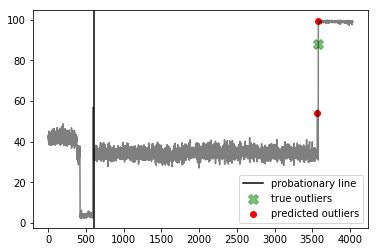




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


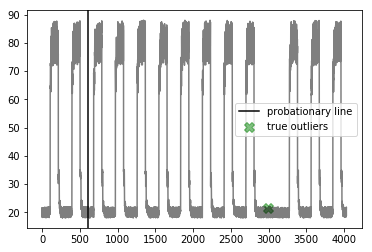




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2930]


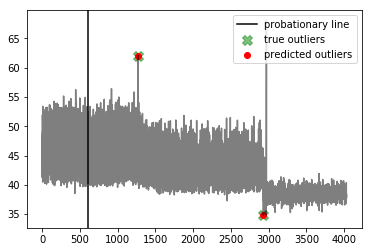




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.125
Corresponding window false positives:  0
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [801]


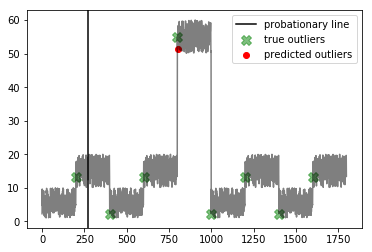




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2881]


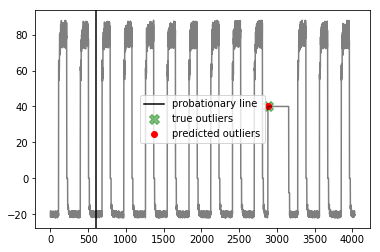

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.799999999999997
Best window threshold:  0.6987
Corresponding window overall precision:  0.8181818181818182
Corresponding window overall recall:  0.3333333333333333
Corresponding window overall F score:  0.4736842105263157



--- artificial_cd_3 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [401, 438]


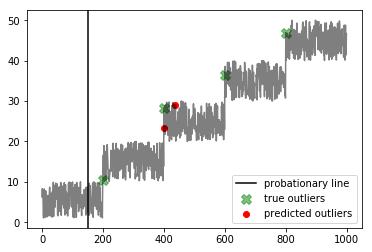




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


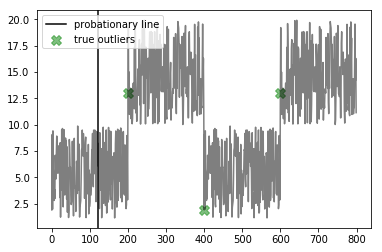




--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [875, 3754]


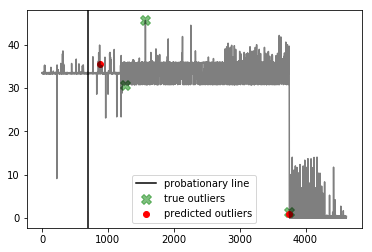




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 2586]


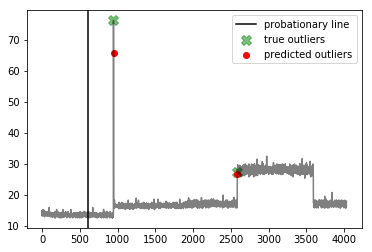




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2427, 3081]


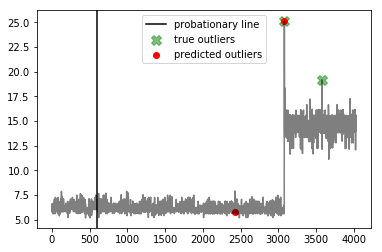




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3581]


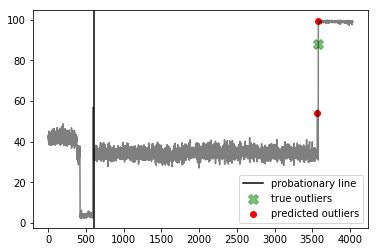




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


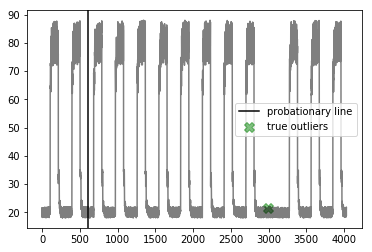




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2930]


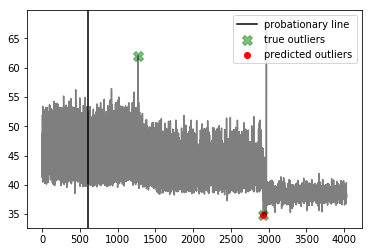




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.125
Corresponding window false positives:  0
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [801]


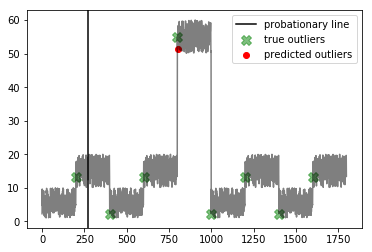




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2881]


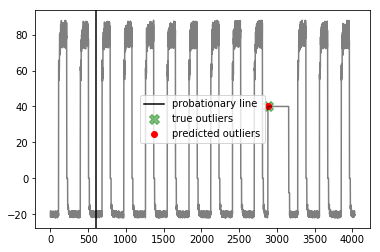

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.1
Best window threshold:  0.6987
Corresponding window overall precision:  0.8181818181818182
Corresponding window overall recall:  0.3333333333333333
Corresponding window overall F score:  0.4736842105263157



--- artificial_cd_3 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [401, 438]


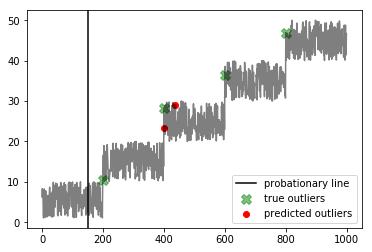




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


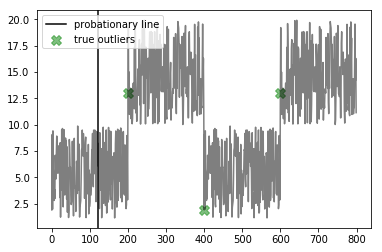




--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [875, 3754]


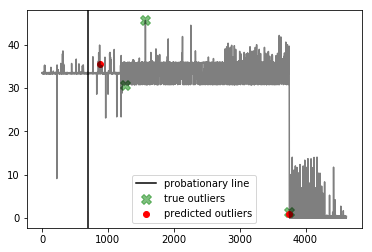




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 2586]


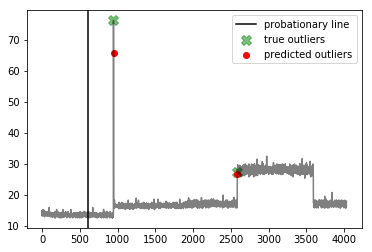




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2427, 3081]


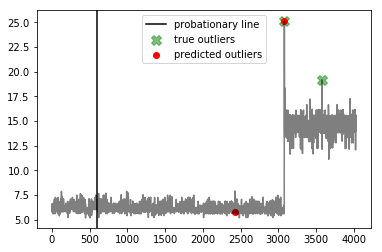




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3581]


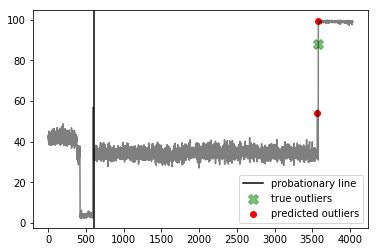




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


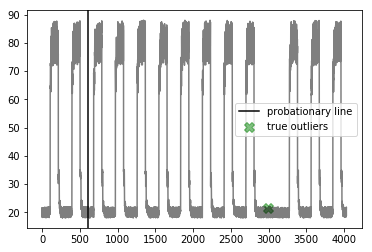




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2930]


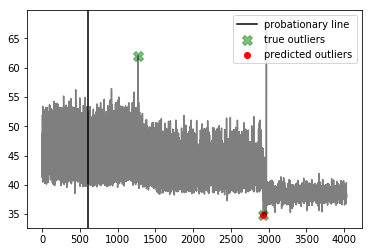




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.125
Corresponding window false positives:  0
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [801]


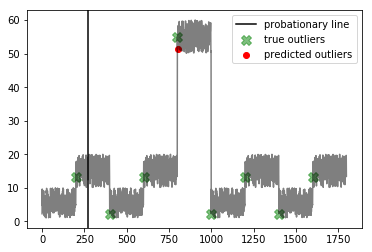




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2881]


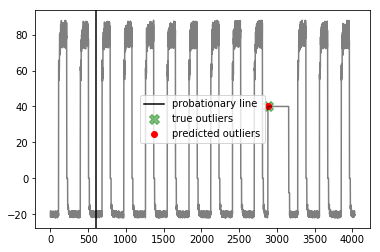

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.4
Best window threshold:  0.6987
Corresponding window overall precision:  0.8181818181818182
Corresponding window overall recall:  0.3333333333333333
Corresponding window overall F score:  0.4736842105263157



--- artificial_cd_3 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [401, 438]


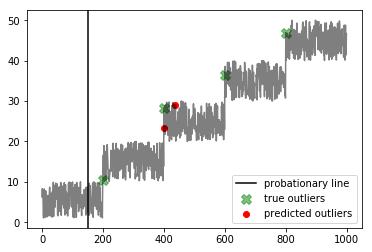




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


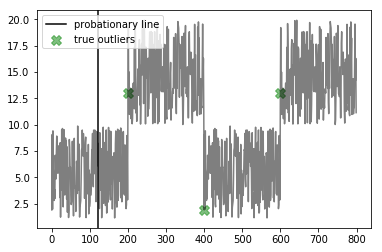




--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [875, 3754]


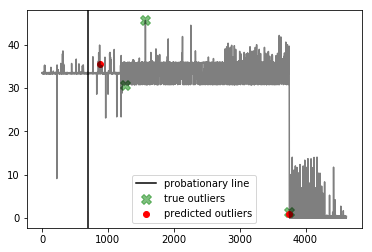




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 2586]


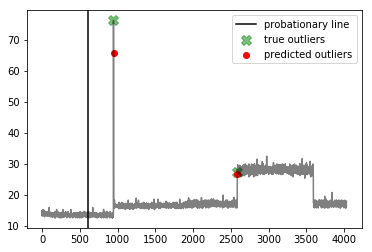




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2427, 3081]


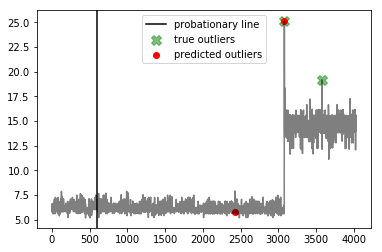




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3581]


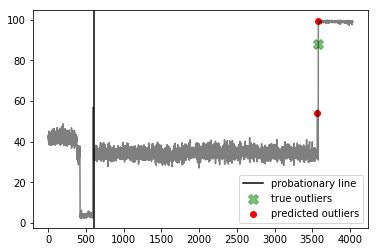




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


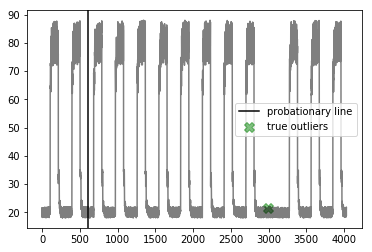




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2930]


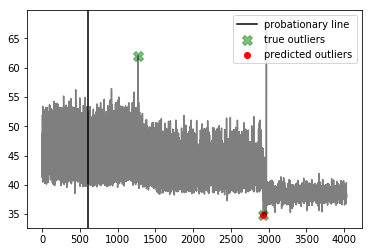




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.125
Corresponding window false positives:  0
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [801]


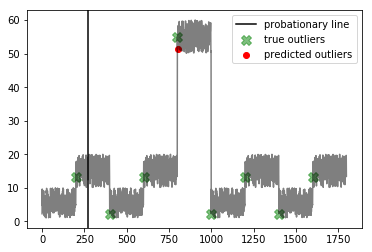




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2881]


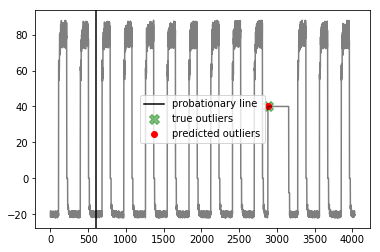

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.700000000000003
Best window threshold:  0.6987
Corresponding window overall precision:  0.8181818181818182
Corresponding window overall recall:  0.3333333333333333
Corresponding window overall F score:  0.4736842105263157



--- artificial_cd_3 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [401, 438]


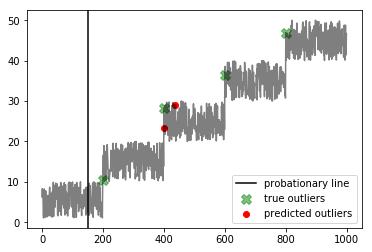




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


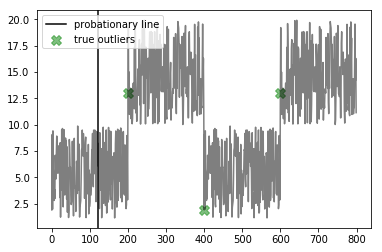




--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [875, 3754]


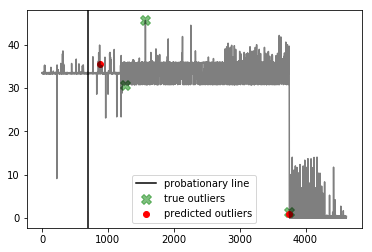




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 2586]


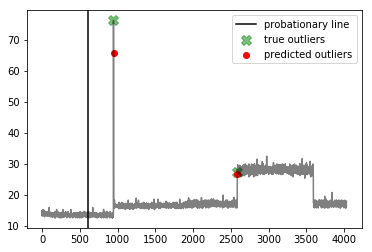




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2427, 3081]


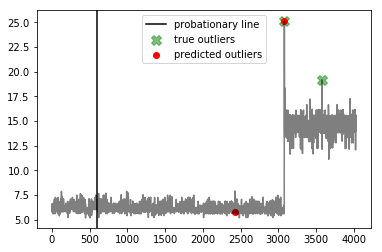




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3581]


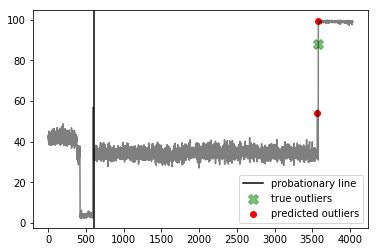




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


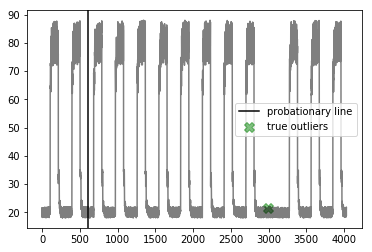




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2930]


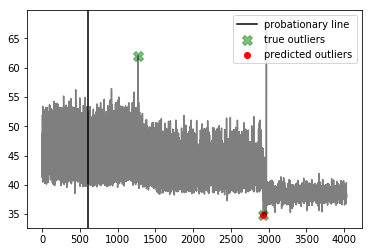




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.125
Corresponding window false positives:  0
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [801]


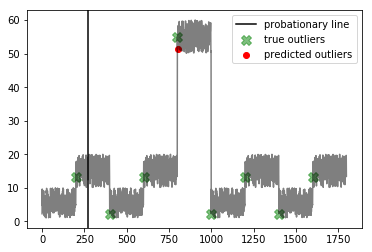




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2881]


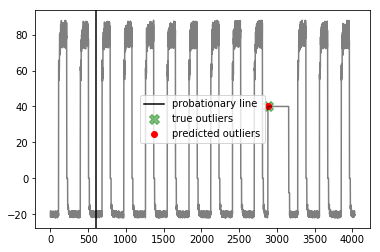

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.0
Best window threshold:  0.6987
Corresponding window overall precision:  0.8181818181818182
Corresponding window overall recall:  0.3333333333333333
Corresponding window overall F score:  0.4736842105263157



--- artificial_cd_3 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [401, 438]


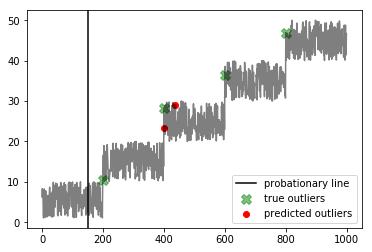




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


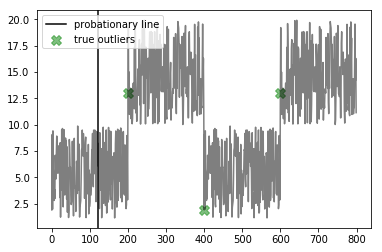




--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [875, 3754]


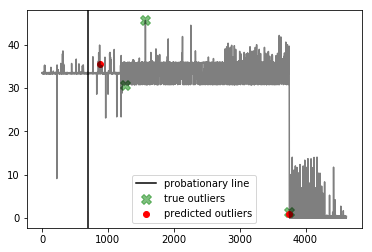




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 2586]


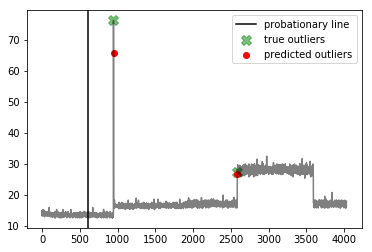




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2427, 3081]


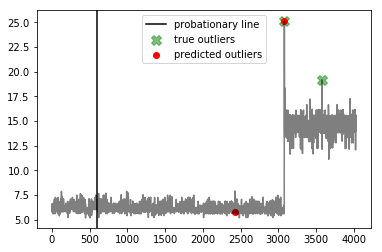




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3581]


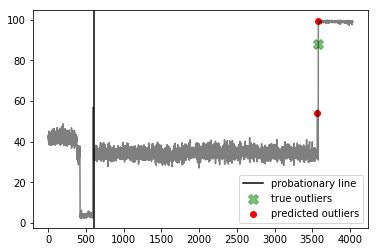




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


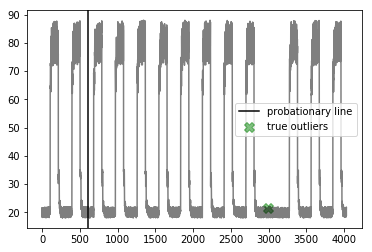




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2930]


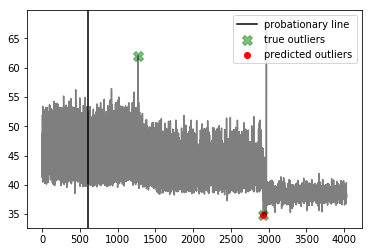




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.125
Corresponding window false positives:  0
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [801]


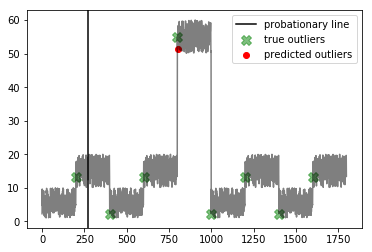




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2881]


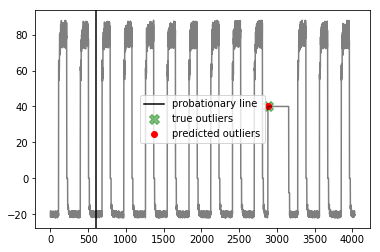

------------
False Positive Weight:  0.1
	 Corresponding window overall F score : 0.30136986301369867
	 Corresponding window overall recall : 0.8148148148148148
	 Best window threshold : 0.0562
	 Corresponding window overall precision : 0.18487394957983194
	 Minimum number of mistakes : 12.600000000000001
False Positive Weight:  0.2
	 Corresponding window overall F score : 0.5245901639344261
	 Corresponding window overall recall : 0.5925925925925926
	 Best window threshold : 0.3634
	 Corresponding window overall precision : 0.47058823529411764
	 Minimum number of mistakes : 14.800000000000002
False Positive Weight:  0.3
	 Corresponding window overall F score : 0.5245901639344261
	 Corresponding window overall recall : 0.5925925925925926
	 Best window threshold : 0.3634
	 Corresponding window overall precision : 0.47058823529411764
	 Minimum number of mistakes : 16.7
False Positive Weight:  0.6
	 Corresponding window overall F score : 0.4736842105263157
	 Corresponding window overall re

In [25]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# Donut Results

In [26]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_htm = joblib.load("anomaly_scores/Donut/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_htm["Anomaly Scores"]

In [27]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.2: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.3: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.4: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.5: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.6: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.7: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.8: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.9: {'precision': 0.1111111111111111, 'recall': 1.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  18.0
Best window threshold:  1.0
Corresponding window overall precision:  0.3870967741935484
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.41379310344827586



--- artificial_cd_3 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.25
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [201, 203]


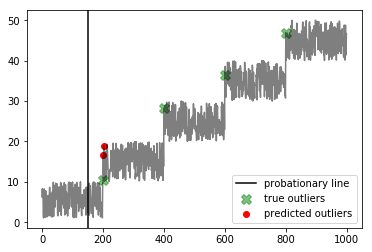




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [201]


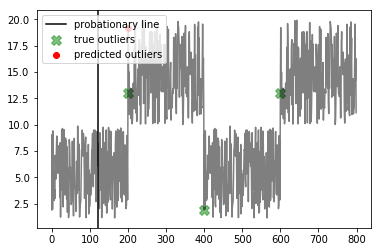




--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  8
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [772, 830, 855, 860, 874, 966, 1134, 1200, 1569, 1915, 2131, 2132, 2258, 2803, 2824, 2858, 3600, 3625, 3753, 3754, 3755, 3759, 3760, 3772, 3776, 3777]


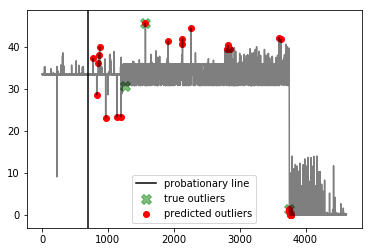




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 946, 947, 948, 949, 953, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655]


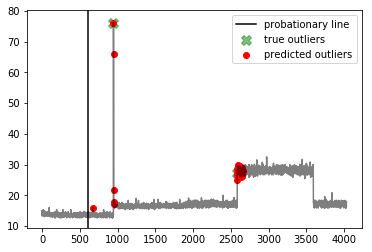




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [718, 992, 1006, 2426, 2996, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


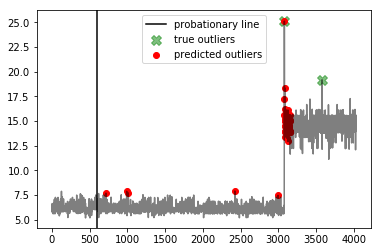




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1999, 3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655, 3659, 3660, 3661, 3662, 3663, 3664, 3665, 3666, 3667, 3668, 3669, 3670, 3671, 3672, 3673, 3674, 3675, 3676, 3677, 3678, 3679, 3680, 3681, 3682, 3683, 3684, 3685, 3686, 3687, 3688, 3689, 3690, 3691, 3692, 3693, 3694, 3695, 3696, 3697, 3698, 36

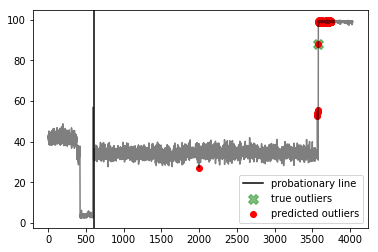




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3277, 3278, 3279, 3280, 3281, 3282, 3286, 3288, 3289, 3291, 3292, 3293, 3294, 3296, 3298, 3299, 3301]


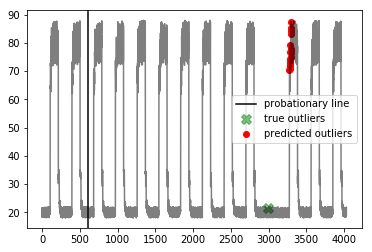




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2970]


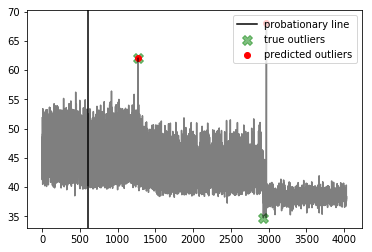




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 821, 827, 830, 832, 843, 848]


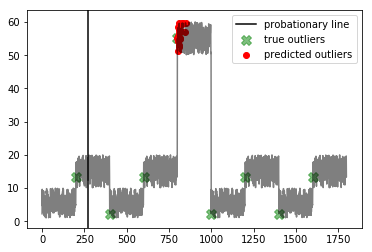




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3295, 3296]


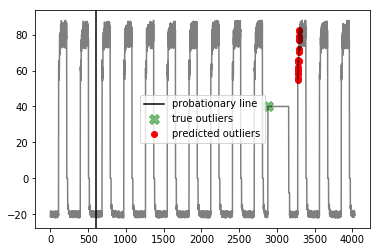

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.0
Best window threshold:  1.0
Corresponding window overall precision:  0.3870967741935484
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.41379310344827586



--- artificial_cd_3 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.25
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [201, 203]


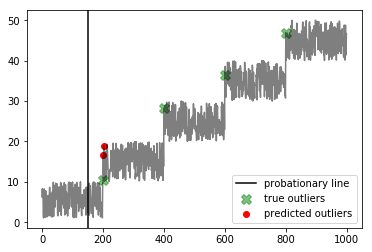




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [201]


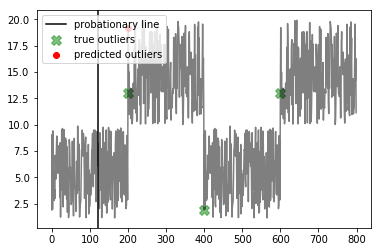




--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  8
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [772, 830, 855, 860, 874, 966, 1134, 1200, 1569, 1915, 2131, 2132, 2258, 2803, 2824, 2858, 3600, 3625, 3753, 3754, 3755, 3759, 3760, 3772, 3776, 3777]


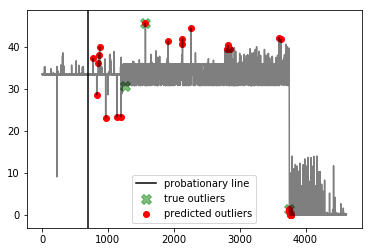




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 946, 947, 948, 949, 953, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655]


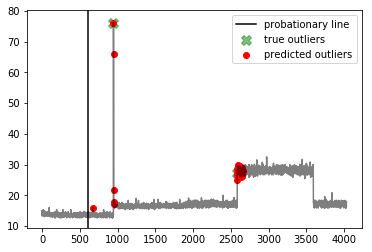




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [718, 992, 1006, 2426, 2996, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


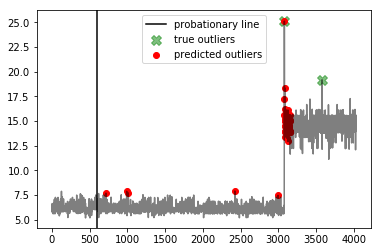




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1999, 3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655, 3659, 3660, 3661, 3662, 3663, 3664, 3665, 3666, 3667, 3668, 3669, 3670, 3671, 3672, 3673, 3674, 3675, 3676, 3677, 3678, 3679, 3680, 3681, 3682, 3683, 3684, 3685, 3686, 3687, 3688, 3689, 3690, 3691, 3692, 3693, 3694, 3695, 3696, 3697, 3698, 36

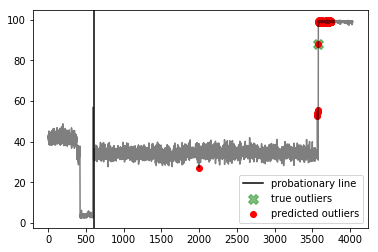




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3277, 3278, 3279, 3280, 3281, 3282, 3286, 3288, 3289, 3291, 3292, 3293, 3294, 3296, 3298, 3299, 3301]


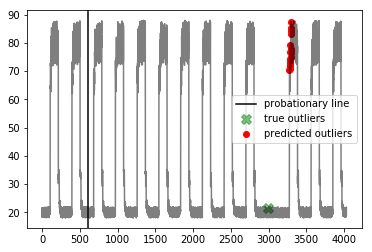




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2970]


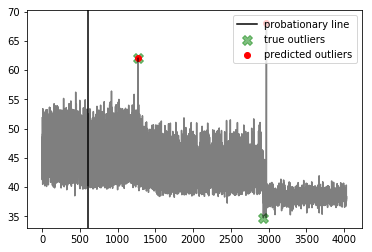




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 821, 827, 830, 832, 843, 848]


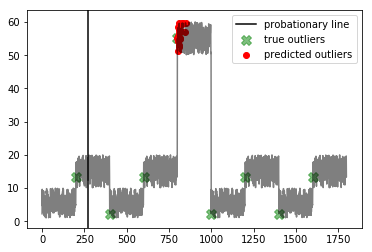




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3295, 3296]


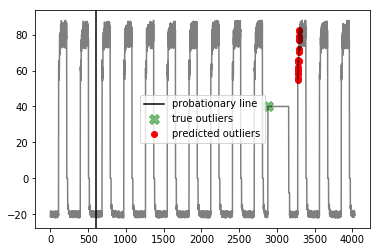

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  22.0
Best window threshold:  1.0
Corresponding window overall precision:  0.3870967741935484
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.41379310344827586



--- artificial_cd_3 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.25
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [201, 203]


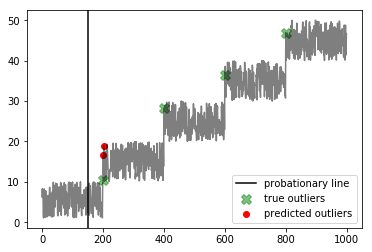




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [201]


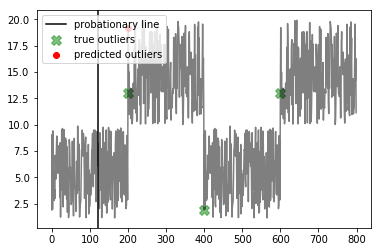




--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  8
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [772, 830, 855, 860, 874, 966, 1134, 1200, 1569, 1915, 2131, 2132, 2258, 2803, 2824, 2858, 3600, 3625, 3753, 3754, 3755, 3759, 3760, 3772, 3776, 3777]


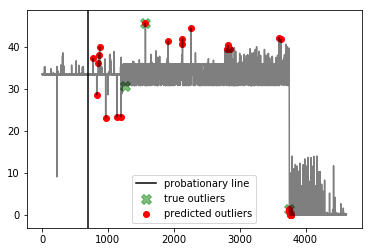




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 946, 947, 948, 949, 953, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655]


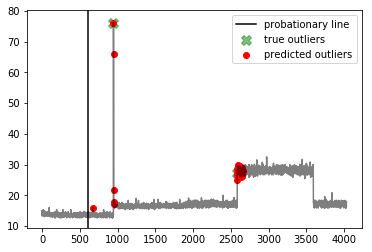




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [718, 992, 1006, 2426, 2996, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


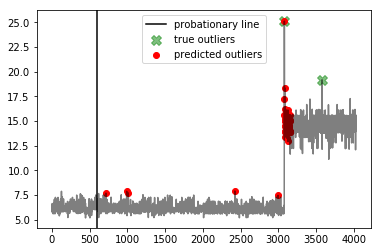




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1999, 3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655, 3659, 3660, 3661, 3662, 3663, 3664, 3665, 3666, 3667, 3668, 3669, 3670, 3671, 3672, 3673, 3674, 3675, 3676, 3677, 3678, 3679, 3680, 3681, 3682, 3683, 3684, 3685, 3686, 3687, 3688, 3689, 3690, 3691, 3692, 3693, 3694, 3695, 3696, 3697, 3698, 36

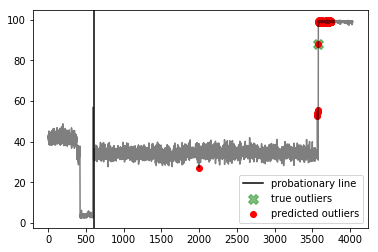




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3277, 3278, 3279, 3280, 3281, 3282, 3286, 3288, 3289, 3291, 3292, 3293, 3294, 3296, 3298, 3299, 3301]


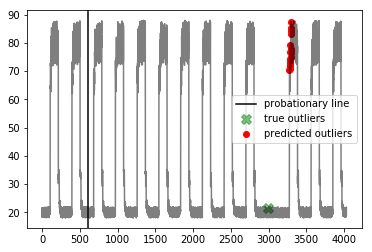




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2970]


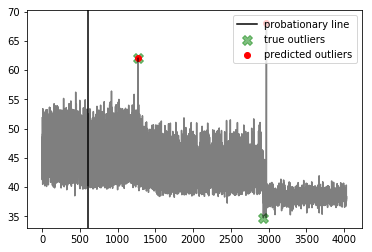




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 821, 827, 830, 832, 843, 848]


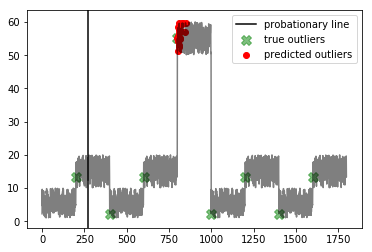




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3295, 3296]


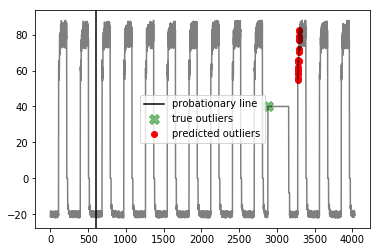

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  24.0
Best window threshold:  1.0
Corresponding window overall precision:  0.3870967741935484
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.41379310344827586



--- artificial_cd_3 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.25
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [201, 203]


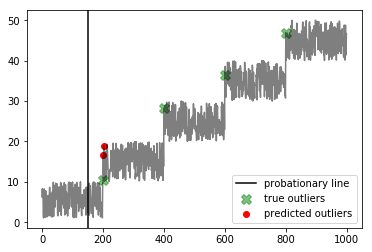




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [201]


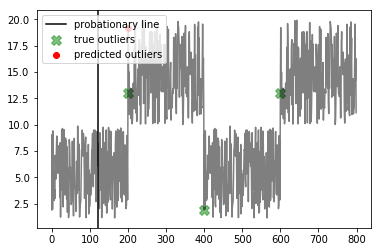




--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  8
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [772, 830, 855, 860, 874, 966, 1134, 1200, 1569, 1915, 2131, 2132, 2258, 2803, 2824, 2858, 3600, 3625, 3753, 3754, 3755, 3759, 3760, 3772, 3776, 3777]


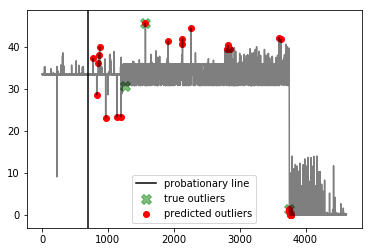




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 946, 947, 948, 949, 953, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655]


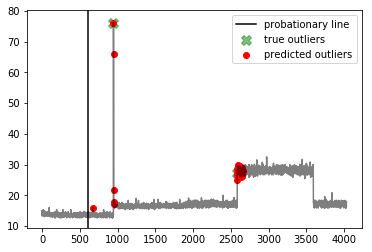




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [718, 992, 1006, 2426, 2996, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


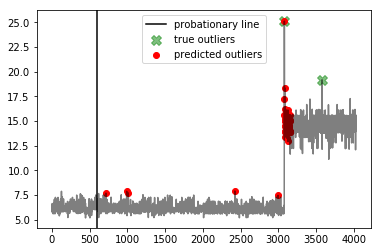




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1999, 3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655, 3659, 3660, 3661, 3662, 3663, 3664, 3665, 3666, 3667, 3668, 3669, 3670, 3671, 3672, 3673, 3674, 3675, 3676, 3677, 3678, 3679, 3680, 3681, 3682, 3683, 3684, 3685, 3686, 3687, 3688, 3689, 3690, 3691, 3692, 3693, 3694, 3695, 3696, 3697, 3698, 36

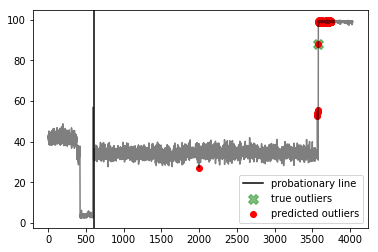




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3277, 3278, 3279, 3280, 3281, 3282, 3286, 3288, 3289, 3291, 3292, 3293, 3294, 3296, 3298, 3299, 3301]


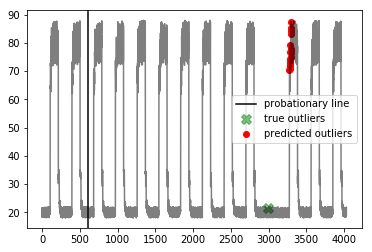




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2970]


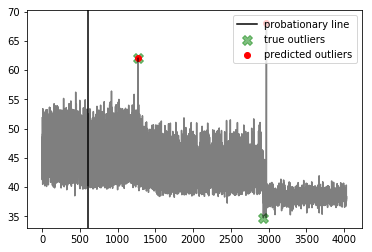




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 821, 827, 830, 832, 843, 848]


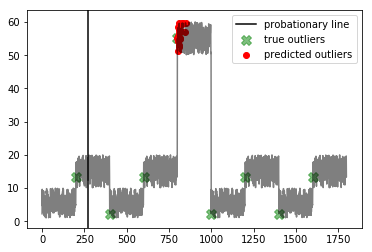




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3295, 3296]


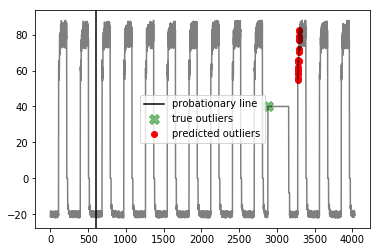

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  26.0
Best window threshold:  1.0
Corresponding window overall precision:  0.3870967741935484
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.41379310344827586



--- artificial_cd_3 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.25
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [201, 203]


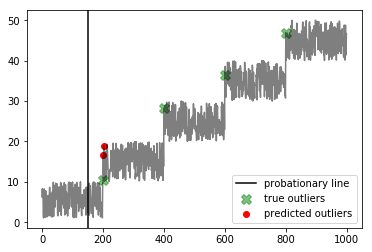




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [201]


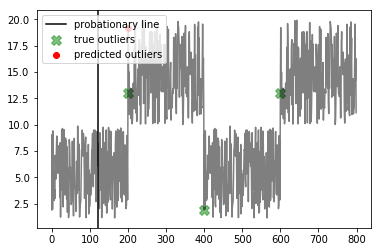




--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  8
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [772, 830, 855, 860, 874, 966, 1134, 1200, 1569, 1915, 2131, 2132, 2258, 2803, 2824, 2858, 3600, 3625, 3753, 3754, 3755, 3759, 3760, 3772, 3776, 3777]


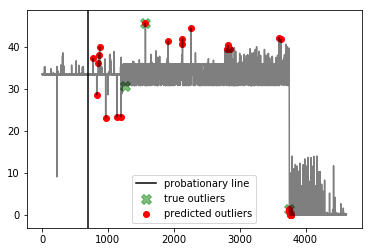




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 946, 947, 948, 949, 953, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655]


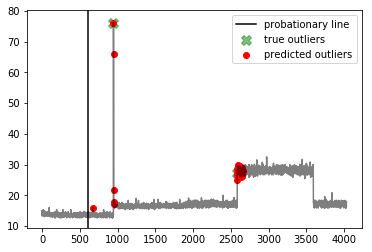




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [718, 992, 1006, 2426, 2996, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


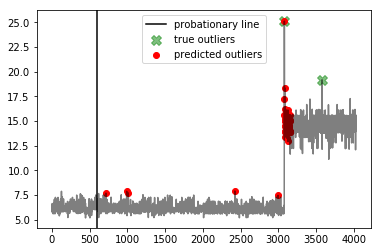




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1999, 3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655, 3659, 3660, 3661, 3662, 3663, 3664, 3665, 3666, 3667, 3668, 3669, 3670, 3671, 3672, 3673, 3674, 3675, 3676, 3677, 3678, 3679, 3680, 3681, 3682, 3683, 3684, 3685, 3686, 3687, 3688, 3689, 3690, 3691, 3692, 3693, 3694, 3695, 3696, 3697, 3698, 36

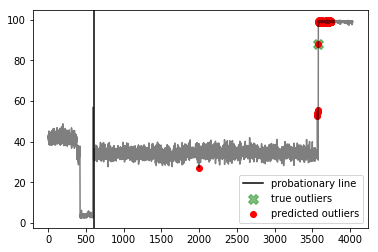




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3277, 3278, 3279, 3280, 3281, 3282, 3286, 3288, 3289, 3291, 3292, 3293, 3294, 3296, 3298, 3299, 3301]


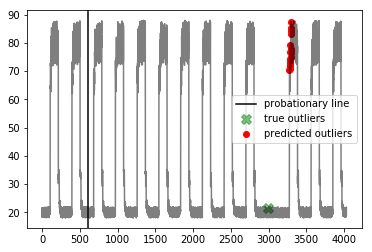




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2970]


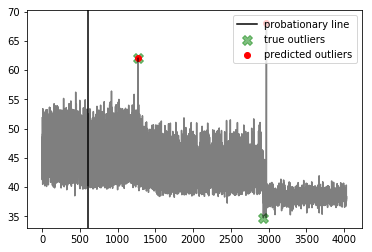




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 821, 827, 830, 832, 843, 848]


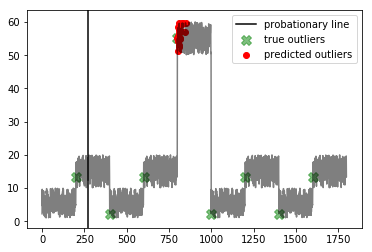




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3295, 3296]


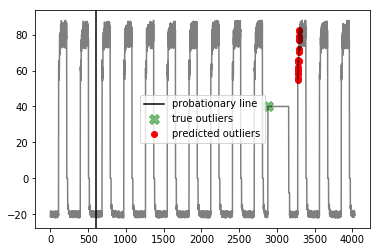

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  28.000000000000004
Best window threshold:  1.0
Corresponding window overall precision:  0.3870967741935484
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.41379310344827586



--- artificial_cd_3 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.25
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [201, 203]


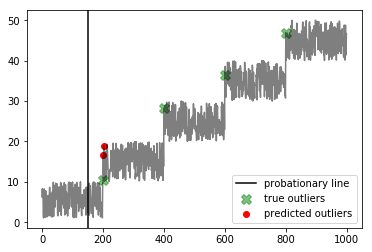




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [201]


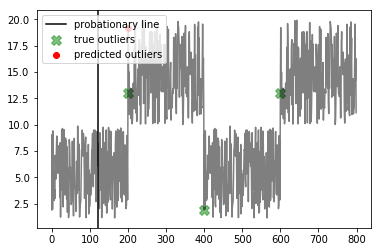




--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  8
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [772, 830, 855, 860, 874, 966, 1134, 1200, 1569, 1915, 2131, 2132, 2258, 2803, 2824, 2858, 3600, 3625, 3753, 3754, 3755, 3759, 3760, 3772, 3776, 3777]


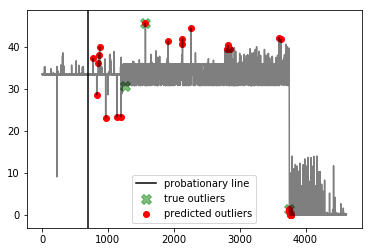




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 946, 947, 948, 949, 953, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655]


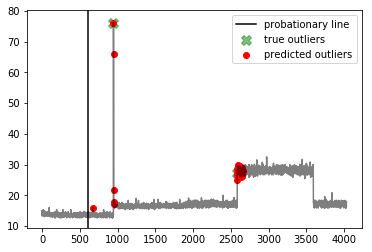




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [718, 992, 1006, 2426, 2996, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


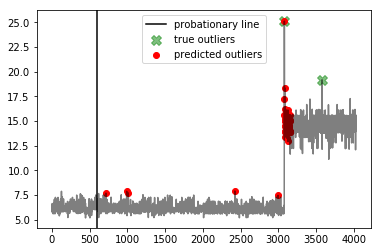




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1999, 3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655, 3659, 3660, 3661, 3662, 3663, 3664, 3665, 3666, 3667, 3668, 3669, 3670, 3671, 3672, 3673, 3674, 3675, 3676, 3677, 3678, 3679, 3680, 3681, 3682, 3683, 3684, 3685, 3686, 3687, 3688, 3689, 3690, 3691, 3692, 3693, 3694, 3695, 3696, 3697, 3698, 36

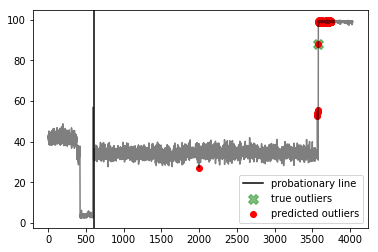




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3277, 3278, 3279, 3280, 3281, 3282, 3286, 3288, 3289, 3291, 3292, 3293, 3294, 3296, 3298, 3299, 3301]


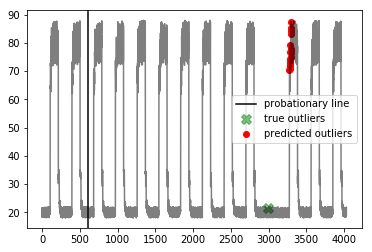




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2970]


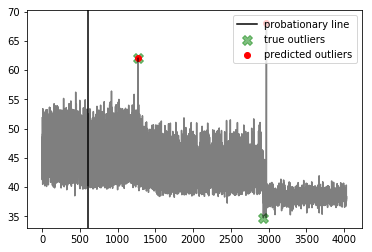




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 821, 827, 830, 832, 843, 848]


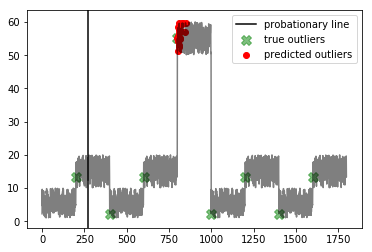




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3295, 3296]


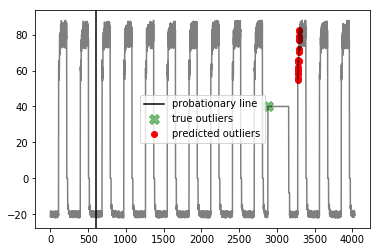

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  29.999999999999996
Best window threshold:  1.0
Corresponding window overall precision:  0.3870967741935484
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.41379310344827586



--- artificial_cd_3 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.25
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [201, 203]


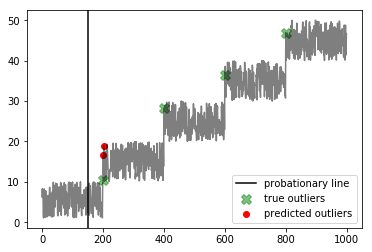




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [201]


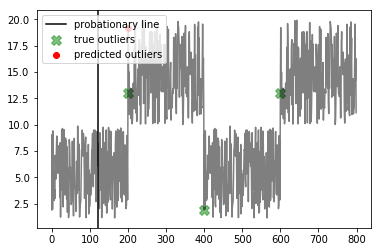




--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  8
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [772, 830, 855, 860, 874, 966, 1134, 1200, 1569, 1915, 2131, 2132, 2258, 2803, 2824, 2858, 3600, 3625, 3753, 3754, 3755, 3759, 3760, 3772, 3776, 3777]


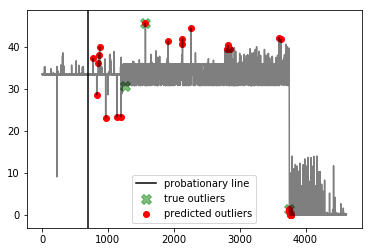




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 946, 947, 948, 949, 953, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655]


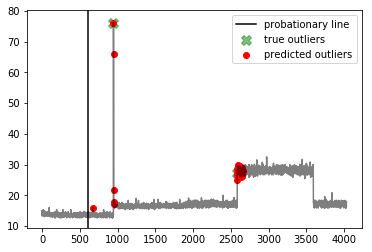




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [718, 992, 1006, 2426, 2996, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


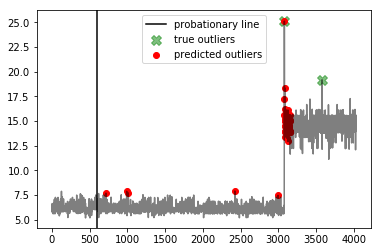




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1999, 3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655, 3659, 3660, 3661, 3662, 3663, 3664, 3665, 3666, 3667, 3668, 3669, 3670, 3671, 3672, 3673, 3674, 3675, 3676, 3677, 3678, 3679, 3680, 3681, 3682, 3683, 3684, 3685, 3686, 3687, 3688, 3689, 3690, 3691, 3692, 3693, 3694, 3695, 3696, 3697, 3698, 36

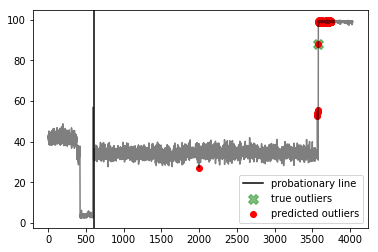




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3277, 3278, 3279, 3280, 3281, 3282, 3286, 3288, 3289, 3291, 3292, 3293, 3294, 3296, 3298, 3299, 3301]


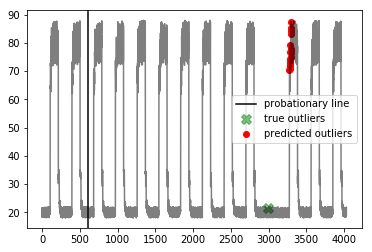




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2970]


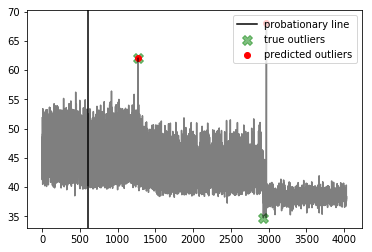




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 821, 827, 830, 832, 843, 848]


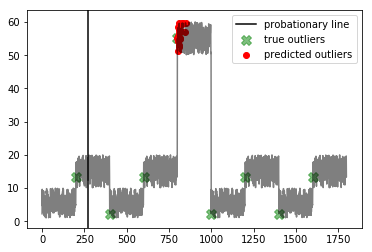




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3295, 3296]


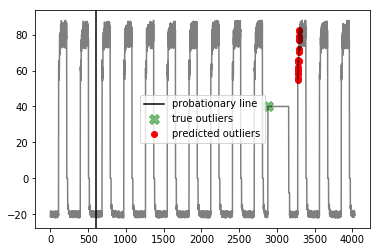

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  32.0
Best window threshold:  1.0
Corresponding window overall precision:  0.3870967741935484
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.41379310344827586



--- artificial_cd_3 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.25
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [201, 203]


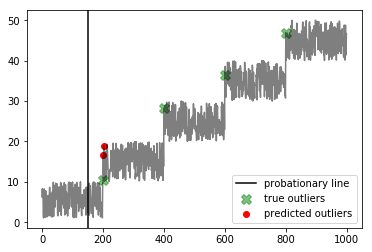




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [201]


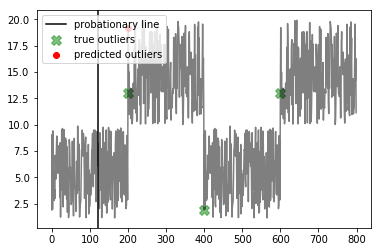




--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  8
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [772, 830, 855, 860, 874, 966, 1134, 1200, 1569, 1915, 2131, 2132, 2258, 2803, 2824, 2858, 3600, 3625, 3753, 3754, 3755, 3759, 3760, 3772, 3776, 3777]


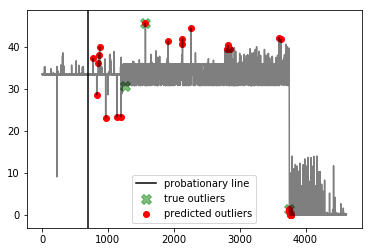




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 946, 947, 948, 949, 953, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655]


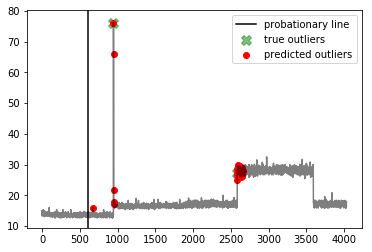




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [718, 992, 1006, 2426, 2996, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


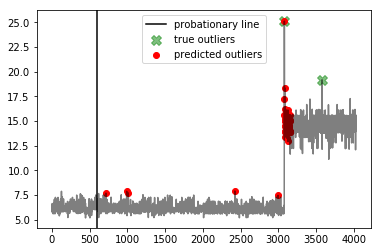




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1999, 3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655, 3659, 3660, 3661, 3662, 3663, 3664, 3665, 3666, 3667, 3668, 3669, 3670, 3671, 3672, 3673, 3674, 3675, 3676, 3677, 3678, 3679, 3680, 3681, 3682, 3683, 3684, 3685, 3686, 3687, 3688, 3689, 3690, 3691, 3692, 3693, 3694, 3695, 3696, 3697, 3698, 36

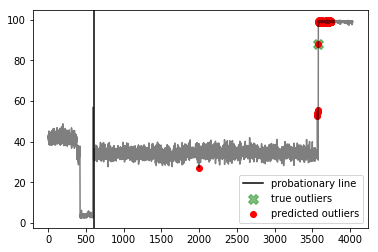




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3277, 3278, 3279, 3280, 3281, 3282, 3286, 3288, 3289, 3291, 3292, 3293, 3294, 3296, 3298, 3299, 3301]


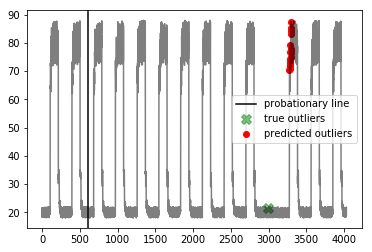




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2970]


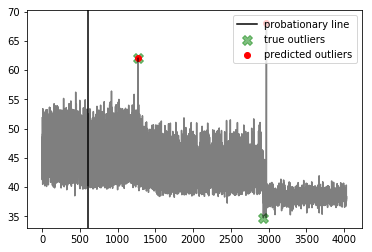




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 821, 827, 830, 832, 843, 848]


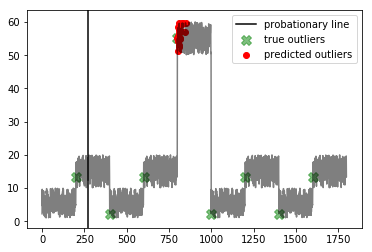




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3295, 3296]


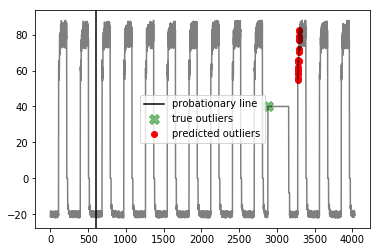

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  34.0
Best window threshold:  1.0
Corresponding window overall precision:  0.3870967741935484
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.41379310344827586



--- artificial_cd_3 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.25
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [201, 203]


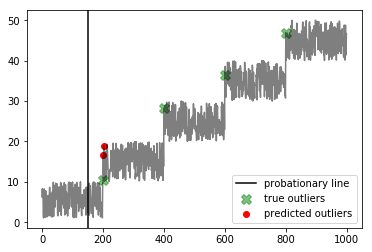




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [201]


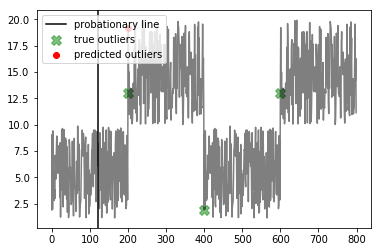




--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  8
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [772, 830, 855, 860, 874, 966, 1134, 1200, 1569, 1915, 2131, 2132, 2258, 2803, 2824, 2858, 3600, 3625, 3753, 3754, 3755, 3759, 3760, 3772, 3776, 3777]


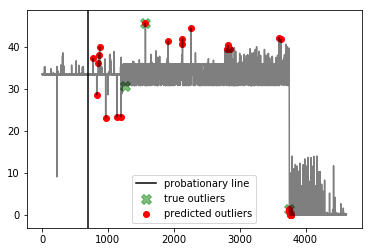




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 946, 947, 948, 949, 953, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655]


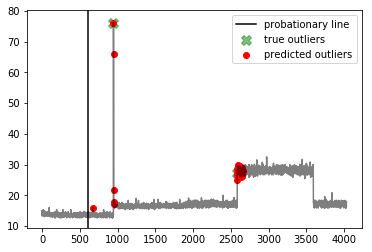




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [718, 992, 1006, 2426, 2996, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


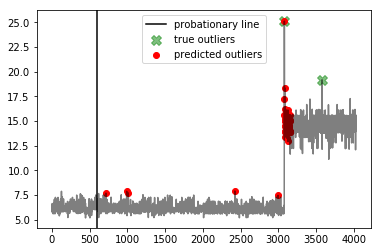




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1999, 3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655, 3659, 3660, 3661, 3662, 3663, 3664, 3665, 3666, 3667, 3668, 3669, 3670, 3671, 3672, 3673, 3674, 3675, 3676, 3677, 3678, 3679, 3680, 3681, 3682, 3683, 3684, 3685, 3686, 3687, 3688, 3689, 3690, 3691, 3692, 3693, 3694, 3695, 3696, 3697, 3698, 36

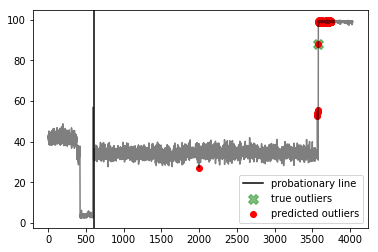




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3277, 3278, 3279, 3280, 3281, 3282, 3286, 3288, 3289, 3291, 3292, 3293, 3294, 3296, 3298, 3299, 3301]


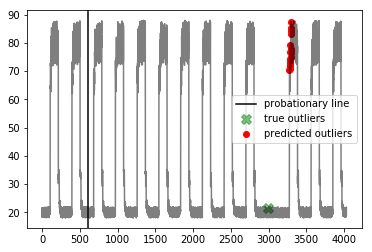




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2970]


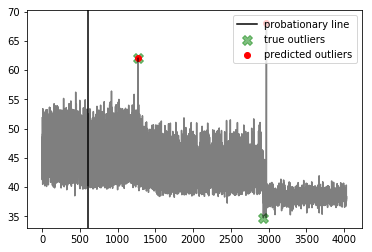




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 821, 827, 830, 832, 843, 848]


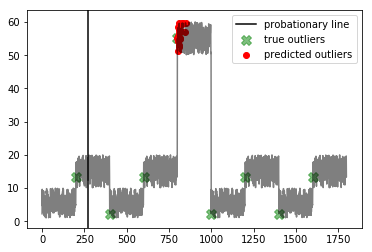




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3295, 3296]


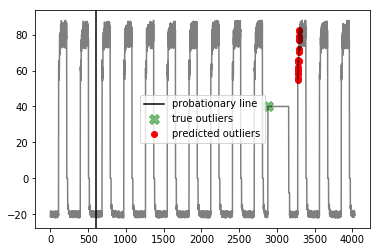

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  36.0
Best window threshold:  1.0
Corresponding window overall precision:  0.3870967741935484
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.41379310344827586



--- artificial_cd_3 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.25
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [201, 203]


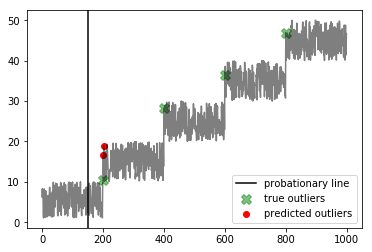




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [201]


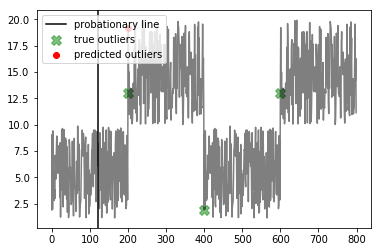




--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  8
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [772, 830, 855, 860, 874, 966, 1134, 1200, 1569, 1915, 2131, 2132, 2258, 2803, 2824, 2858, 3600, 3625, 3753, 3754, 3755, 3759, 3760, 3772, 3776, 3777]


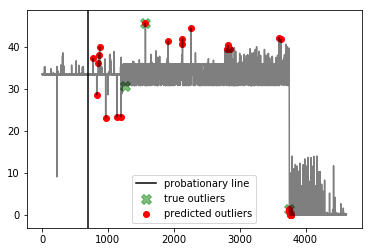




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 946, 947, 948, 949, 953, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655]


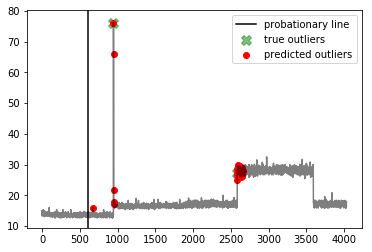




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [718, 992, 1006, 2426, 2996, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


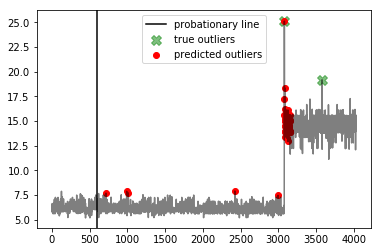




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1999, 3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655, 3659, 3660, 3661, 3662, 3663, 3664, 3665, 3666, 3667, 3668, 3669, 3670, 3671, 3672, 3673, 3674, 3675, 3676, 3677, 3678, 3679, 3680, 3681, 3682, 3683, 3684, 3685, 3686, 3687, 3688, 3689, 3690, 3691, 3692, 3693, 3694, 3695, 3696, 3697, 3698, 36

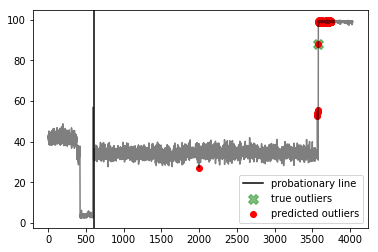




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3277, 3278, 3279, 3280, 3281, 3282, 3286, 3288, 3289, 3291, 3292, 3293, 3294, 3296, 3298, 3299, 3301]


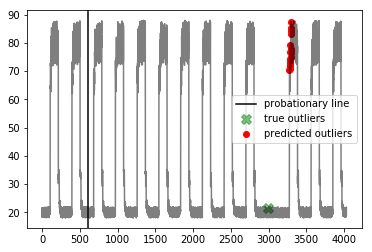




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2970]


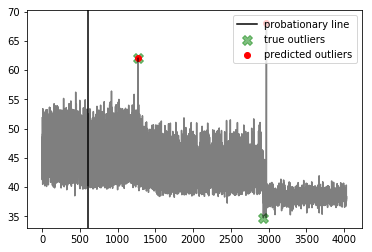




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 821, 827, 830, 832, 843, 848]


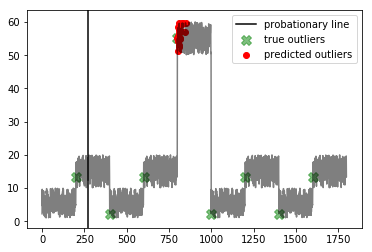




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3295, 3296]


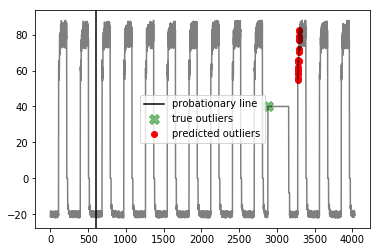

------------
False Positive Weight:  0.1
	 Corresponding window overall F score : 0.41379310344827586
	 Corresponding window overall recall : 0.4444444444444444
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.3870967741935484
	 Minimum number of mistakes : 18.0
False Positive Weight:  0.2
	 Corresponding window overall F score : 0.41379310344827586
	 Corresponding window overall recall : 0.4444444444444444
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.3870967741935484
	 Minimum number of mistakes : 20.0
False Positive Weight:  0.3
	 Corresponding window overall F score : 0.41379310344827586
	 Corresponding window overall recall : 0.4444444444444444
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.3870967741935484
	 Minimum number of mistakes : 22.0
False Positive Weight:  0.6
	 Corresponding window overall F score : 0.41379310344827586
	 Corresponding window overall recall : 0.4444444444444444
	 Best wind

In [28]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# windowed gaussian results

In [15]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_htm = joblib.load("anomaly_scores/windowed_gaussian/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_htm["Anomaly Scores"]

In [16]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.1, 'recall': 0.875},
 0.2: {'precision': 0.1, 'recall': 0.875},
 0.3: {'precision': 0.1, 'recall': 0.875},
 0.4: {'precision': 0.1, 'recall': 0.875},
 0.5: {'precision': 0.1, 'recall': 0.875},
 0.6: {'precision': 0.1, 'recall': 0.875},
 0.7: {'precision': 0.1, 'recall': 0.875},
 0.8: {'precision': 0.10294117647058823, 'recall': 0.875},
 0.9: {'precision': 0.09230769230769231, 'recall': 0.75},
 1.0: {'precision': 0.3333333333333333, 'recall': 0.125}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  16.0
Best window threshold:  0.9994
Corresponding window overall precision:  0.2
Corresponding window overall recall:  0.5925925925925926
Corresponding window overall F score:  0.2990654205607477



--- grok_asg_anomaly ---
Corresponding window precision:  0.14285714285714285
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  12
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [772, 830, 855, 856, 860, 873, 874, 875, 901, 905, 953, 954, 955, 966, 1002, 1026, 1027, 1028, 1029, 1030, 1031, 1033, 1038, 1039, 1042, 1043, 1090, 1095, 1134, 1200, 1212, 1569, 1915, 2131, 2132, 2258, 2803, 2824, 2878, 2919, 3600, 3625, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3

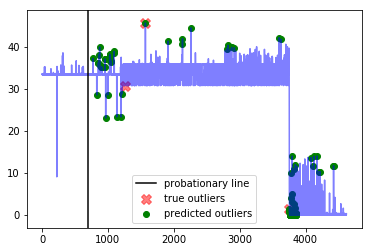




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3294, 3295, 3296, 3297, 3298, 3299, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313, 3314, 3315, 3316, 3317, 3318, 3319, 3320, 3321, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332, 3333, 3334, 3335, 3336, 3337, 3338, 3339, 3340, 3341, 3342, 3343, 3344, 3345, 3346, 3347, 3348, 3349, 3350, 3351, 3352, 3353, 3354, 3355]


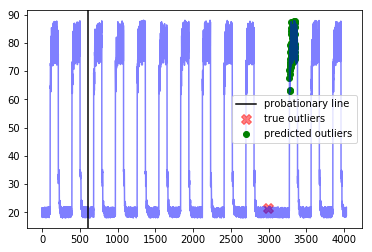




--- artificial_cd_1 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [201, 203, 217, 219, 220, 238]


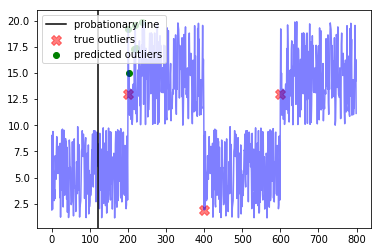




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.13333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  13
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [620, 683, 708, 718, 920, 992, 1006, 1014, 1208, 1235, 1283, 1309, 1362, 1404, 1498, 1534, 1561, 1569, 1580, 1591, 1722, 1808, 1832, 1862, 1873, 1880, 2064, 2082, 2088, 2426, 2438, 2445, 2456, 2650, 2801, 2971, 2996, 3021, 3032, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155, 3420, 3463, 3580, 3669, 3673]


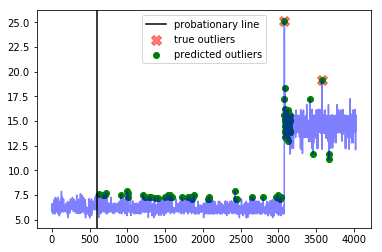




--- artificial_cd_3 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [201, 203, 208, 211, 214, 233, 409, 417, 429, 601, 609, 611, 613, 626, 631, 632, 635, 651, 820]


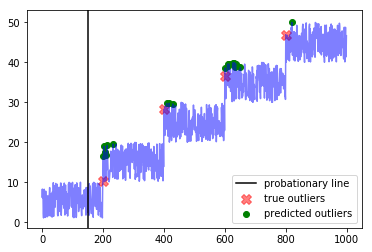




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  10
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 815, 946, 947, 948, 949, 950, 951, 952, 953, 954, 955, 1277, 1480, 1535, 1823, 1931, 1941, 1949, 2111, 2399, 2543, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 2975, 3446, 3480, 3551, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 

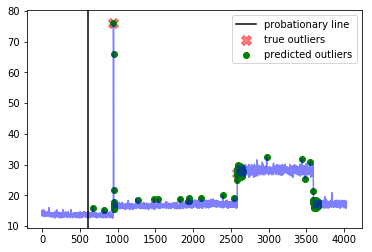




--- art_daily_flatmiddle ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3156, 3157, 3158, 3159, 3160, 3161, 3162, 3163, 3164, 3165, 3166, 3167, 3168, 3169, 3170, 3171, 3172, 3173, 3174, 3175, 3176, 3177, 3178, 3179, 3180, 3181, 3182, 3183, 3184, 3185, 3186, 3187, 3188, 3189, 3190, 3191, 3192, 3193, 3194, 3195, 3196, 3197, 3198, 3199, 3200, 3201, 3202, 3203, 3204, 3205, 3206, 3207, 3208, 3209, 3210, 3211, 3212, 3213, 3214, 3215, 3216, 3217, 3218, 3219, 3220, 3221, 3222, 3223, 3224, 3225, 3226, 3227, 3228, 3229, 3230, 3231, 3232, 3233, 3234, 3235, 3236, 3237, 3238, 3239, 3240, 3241, 3242, 3243, 3244, 3245, 3246, 3247, 3248, 3249, 3250, 3251, 3252, 3253, 3254, 3255]


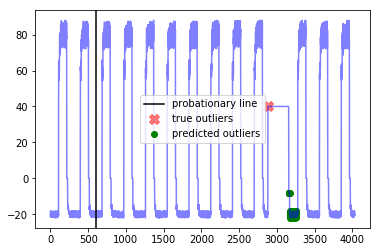




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1882, 1999, 2670, 3032, 3425, 3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655, 3860, 3874, 3967, 3987, 4027]


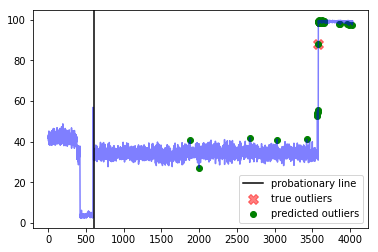




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2970, 3668]


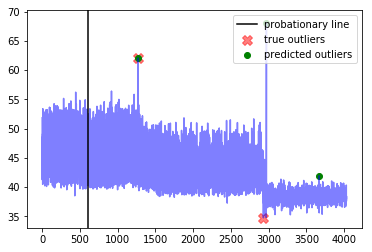




--- artificial_cd_2 ---
Corresponding window precision:  0.25
Corresponding window recall:  0.125
Corresponding window false positives:  3
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 828, 829, 830, 831, 832, 833, 834, 835, 836, 837, 838, 839, 840, 841, 842, 843, 844, 845, 846, 847, 848, 849, 850, 851, 852, 853, 854, 855]


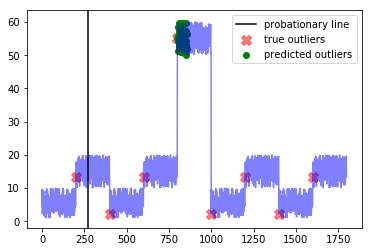

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.0
Best window threshold:  0.9994
Corresponding window overall precision:  0.2
Corresponding window overall recall:  0.5925925925925926
Corresponding window overall F score:  0.2990654205607477



--- grok_asg_anomaly ---
Corresponding window precision:  0.14285714285714285
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  12
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [772, 830, 855, 856, 860, 873, 874, 875, 901, 905, 953, 954, 955, 966, 1002, 1026, 1027, 1028, 1029, 1030, 1031, 1033, 1038, 1039, 1042, 1043, 1090, 1095, 1134, 1200, 1212, 1569, 1915, 2131, 2132, 2258, 2803, 2824, 2878, 2919, 3600, 3625, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3

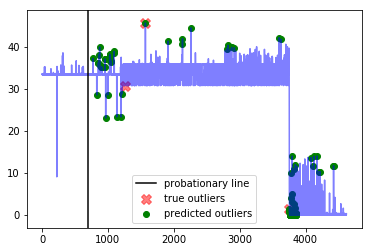




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3294, 3295, 3296, 3297, 3298, 3299, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313, 3314, 3315, 3316, 3317, 3318, 3319, 3320, 3321, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332, 3333, 3334, 3335, 3336, 3337, 3338, 3339, 3340, 3341, 3342, 3343, 3344, 3345, 3346, 3347, 3348, 3349, 3350, 3351, 3352, 3353, 3354, 3355]


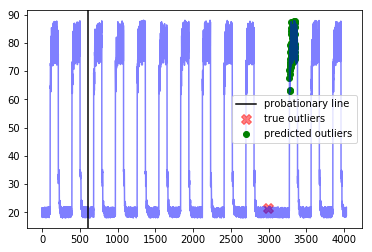




--- artificial_cd_1 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [201, 203, 217, 219, 220, 238]


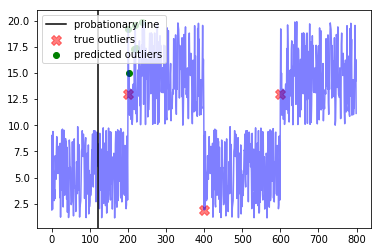




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.13333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  13
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [620, 683, 708, 718, 920, 992, 1006, 1014, 1208, 1235, 1283, 1309, 1362, 1404, 1498, 1534, 1561, 1569, 1580, 1591, 1722, 1808, 1832, 1862, 1873, 1880, 2064, 2082, 2088, 2426, 2438, 2445, 2456, 2650, 2801, 2971, 2996, 3021, 3032, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155, 3420, 3463, 3580, 3669, 3673]


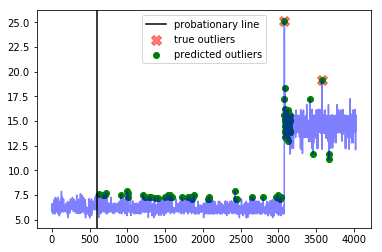




--- artificial_cd_3 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [201, 203, 208, 211, 214, 233, 409, 417, 429, 601, 609, 611, 613, 626, 631, 632, 635, 651, 820]


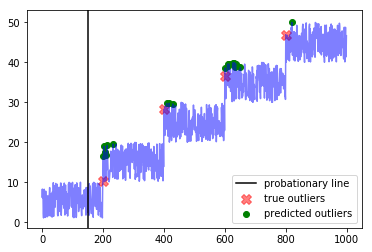




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  10
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 815, 946, 947, 948, 949, 950, 951, 952, 953, 954, 955, 1277, 1480, 1535, 1823, 1931, 1941, 1949, 2111, 2399, 2543, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 2975, 3446, 3480, 3551, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 

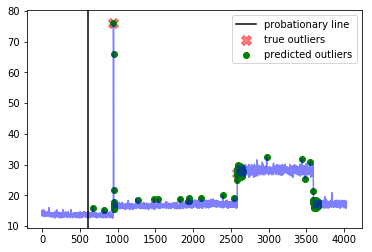




--- art_daily_flatmiddle ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3156, 3157, 3158, 3159, 3160, 3161, 3162, 3163, 3164, 3165, 3166, 3167, 3168, 3169, 3170, 3171, 3172, 3173, 3174, 3175, 3176, 3177, 3178, 3179, 3180, 3181, 3182, 3183, 3184, 3185, 3186, 3187, 3188, 3189, 3190, 3191, 3192, 3193, 3194, 3195, 3196, 3197, 3198, 3199, 3200, 3201, 3202, 3203, 3204, 3205, 3206, 3207, 3208, 3209, 3210, 3211, 3212, 3213, 3214, 3215, 3216, 3217, 3218, 3219, 3220, 3221, 3222, 3223, 3224, 3225, 3226, 3227, 3228, 3229, 3230, 3231, 3232, 3233, 3234, 3235, 3236, 3237, 3238, 3239, 3240, 3241, 3242, 3243, 3244, 3245, 3246, 3247, 3248, 3249, 3250, 3251, 3252, 3253, 3254, 3255]


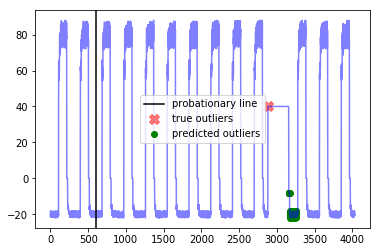




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1882, 1999, 2670, 3032, 3425, 3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655, 3860, 3874, 3967, 3987, 4027]


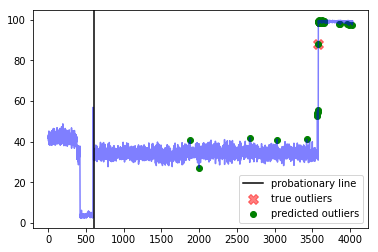




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2970, 3668]


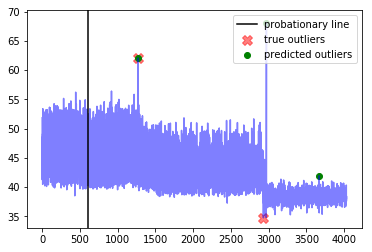




--- artificial_cd_2 ---
Corresponding window precision:  0.25
Corresponding window recall:  0.125
Corresponding window false positives:  3
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 828, 829, 830, 831, 832, 833, 834, 835, 836, 837, 838, 839, 840, 841, 842, 843, 844, 845, 846, 847, 848, 849, 850, 851, 852, 853, 854, 855]


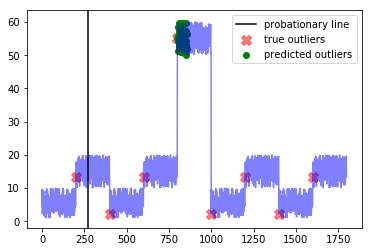

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  23.3
Best window threshold:  1.0
Corresponding window overall precision:  0.375
Corresponding window overall recall:  0.2222222222222222
Corresponding window overall F score:  0.27906976744186046



--- grok_asg_anomaly ---
Corresponding window precision:  0.25
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  3
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 860, 874, 966, 3753, 3754, 3755, 3757, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793, 3797, 3799, 3800, 3802, 3804, 3806, 3808, 3809, 3811, 3813, 3814, 3817, 3818, 3820, 3824, 3826, 3827, 3830, 3831, 3833, 3835, 3837, 3838, 3840, 3842, 3844, 3847, 3849, 3851, 3853, 3855]


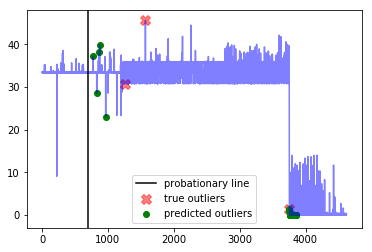




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3294, 3295, 3296, 3297, 3298, 3299, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313, 3314, 3315, 3316, 3317, 3318, 3319, 3320, 3321, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332, 3333, 3334, 3335, 3336, 3337, 3338, 3339, 3340, 3341, 3342, 3343, 3344, 3345, 3346, 3347, 3348, 3349, 3350, 3351, 3352, 3353, 3354, 3355]


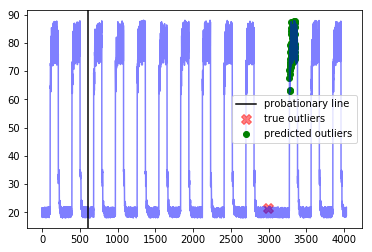




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


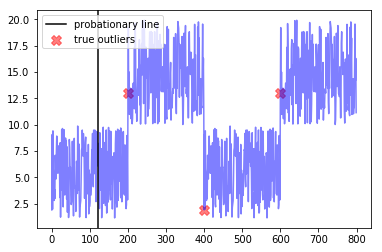




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


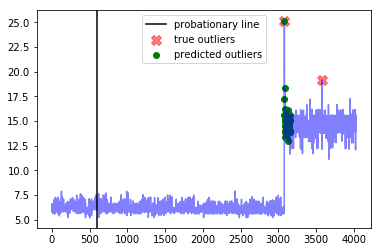




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


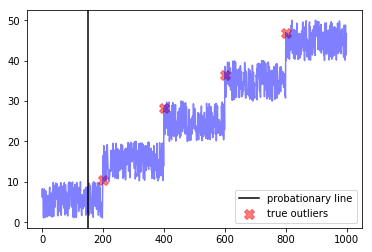




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

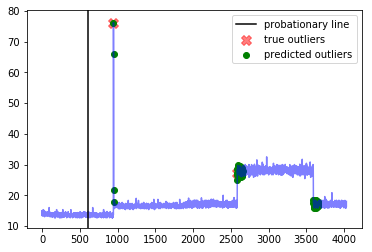




--- art_daily_flatmiddle ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3156, 3157, 3158, 3159, 3160, 3161, 3162, 3163, 3164, 3165, 3166, 3167, 3168, 3169, 3170, 3171, 3172, 3173, 3174, 3175, 3176, 3177, 3178, 3179, 3180, 3181, 3182, 3183, 3184, 3185, 3186, 3187, 3188, 3189, 3190, 3191, 3192, 3193, 3194, 3195, 3196, 3197, 3198, 3199, 3200, 3201, 3202, 3203, 3204, 3205, 3206, 3207, 3208, 3209, 3210, 3211, 3212, 3213, 3214, 3215, 3216, 3217, 3218, 3219, 3220, 3221, 3222, 3223, 3224, 3225, 3226, 3227, 3228, 3229, 3230, 3231, 3232, 3233, 3234, 3235, 3236, 3237, 3238, 3239, 3240, 3241, 3242, 3243, 3244, 3245, 3246, 3247, 3248, 3249, 3250, 3251, 3252, 3253, 3254, 3255]


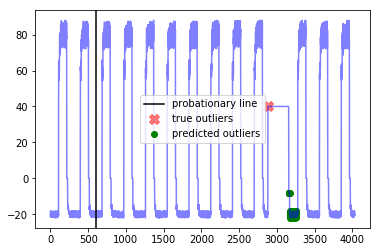




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655]


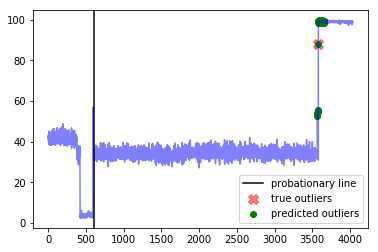




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


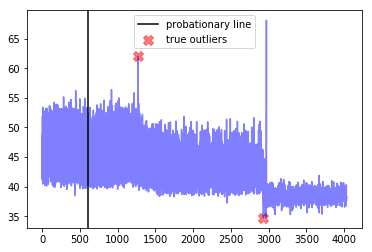




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [805, 810, 811, 820, 821, 827, 830, 832, 835, 843, 848, 851]


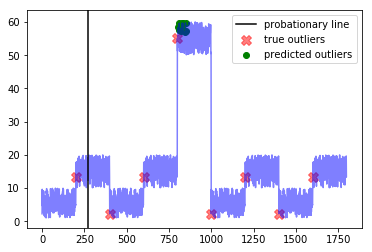

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  24.400000000000002
Best window threshold:  1.0
Corresponding window overall precision:  0.375
Corresponding window overall recall:  0.2222222222222222
Corresponding window overall F score:  0.27906976744186046



--- grok_asg_anomaly ---
Corresponding window precision:  0.25
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  3
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 860, 874, 966, 3753, 3754, 3755, 3757, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793, 3797, 3799, 3800, 3802, 3804, 3806, 3808, 3809, 3811, 3813, 3814, 3817, 3818, 3820, 3824, 3826, 3827, 3830, 3831, 3833, 3835, 3837, 3838, 3840, 3842, 3844, 3847, 3849, 3851, 3853, 3855]


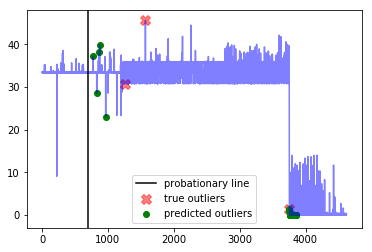




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3294, 3295, 3296, 3297, 3298, 3299, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313, 3314, 3315, 3316, 3317, 3318, 3319, 3320, 3321, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332, 3333, 3334, 3335, 3336, 3337, 3338, 3339, 3340, 3341, 3342, 3343, 3344, 3345, 3346, 3347, 3348, 3349, 3350, 3351, 3352, 3353, 3354, 3355]


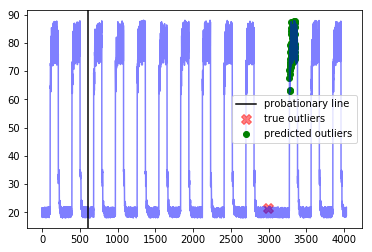




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


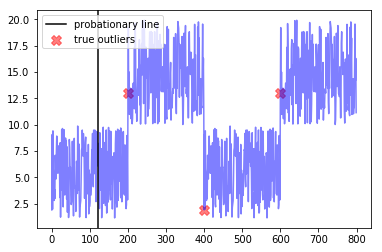




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


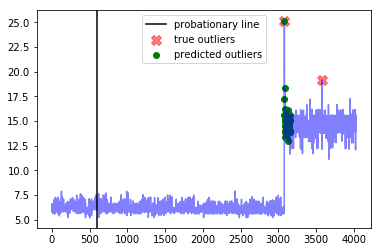




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


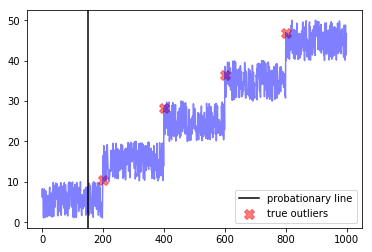




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

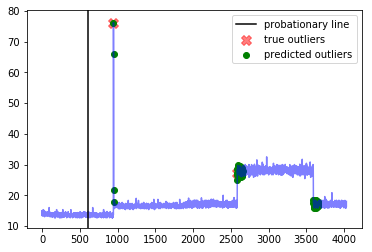




--- art_daily_flatmiddle ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3156, 3157, 3158, 3159, 3160, 3161, 3162, 3163, 3164, 3165, 3166, 3167, 3168, 3169, 3170, 3171, 3172, 3173, 3174, 3175, 3176, 3177, 3178, 3179, 3180, 3181, 3182, 3183, 3184, 3185, 3186, 3187, 3188, 3189, 3190, 3191, 3192, 3193, 3194, 3195, 3196, 3197, 3198, 3199, 3200, 3201, 3202, 3203, 3204, 3205, 3206, 3207, 3208, 3209, 3210, 3211, 3212, 3213, 3214, 3215, 3216, 3217, 3218, 3219, 3220, 3221, 3222, 3223, 3224, 3225, 3226, 3227, 3228, 3229, 3230, 3231, 3232, 3233, 3234, 3235, 3236, 3237, 3238, 3239, 3240, 3241, 3242, 3243, 3244, 3245, 3246, 3247, 3248, 3249, 3250, 3251, 3252, 3253, 3254, 3255]


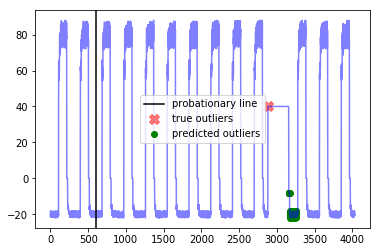




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655]


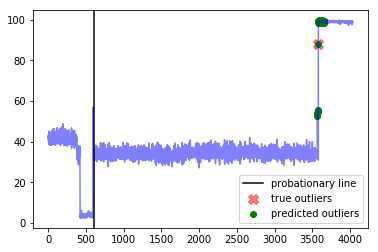




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


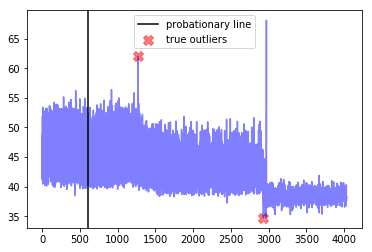




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [805, 810, 811, 820, 821, 827, 830, 832, 835, 843, 848, 851]


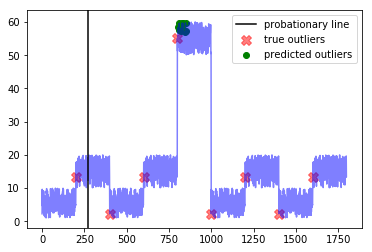

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  25.5
Best window threshold:  1.0
Corresponding window overall precision:  0.375
Corresponding window overall recall:  0.2222222222222222
Corresponding window overall F score:  0.27906976744186046



--- grok_asg_anomaly ---
Corresponding window precision:  0.25
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  3
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 860, 874, 966, 3753, 3754, 3755, 3757, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793, 3797, 3799, 3800, 3802, 3804, 3806, 3808, 3809, 3811, 3813, 3814, 3817, 3818, 3820, 3824, 3826, 3827, 3830, 3831, 3833, 3835, 3837, 3838, 3840, 3842, 3844, 3847, 3849, 3851, 3853, 3855]


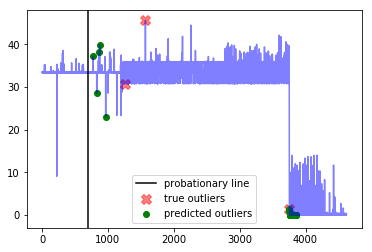




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3294, 3295, 3296, 3297, 3298, 3299, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313, 3314, 3315, 3316, 3317, 3318, 3319, 3320, 3321, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332, 3333, 3334, 3335, 3336, 3337, 3338, 3339, 3340, 3341, 3342, 3343, 3344, 3345, 3346, 3347, 3348, 3349, 3350, 3351, 3352, 3353, 3354, 3355]


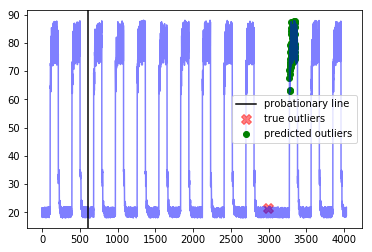




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


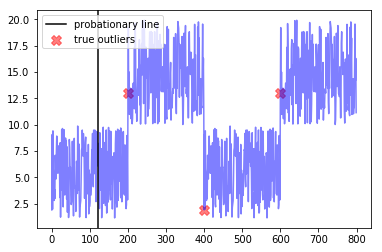




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


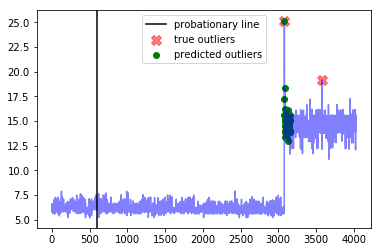




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


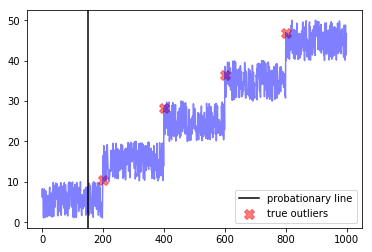




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

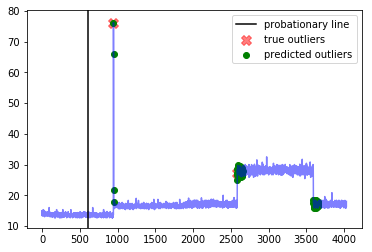




--- art_daily_flatmiddle ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3156, 3157, 3158, 3159, 3160, 3161, 3162, 3163, 3164, 3165, 3166, 3167, 3168, 3169, 3170, 3171, 3172, 3173, 3174, 3175, 3176, 3177, 3178, 3179, 3180, 3181, 3182, 3183, 3184, 3185, 3186, 3187, 3188, 3189, 3190, 3191, 3192, 3193, 3194, 3195, 3196, 3197, 3198, 3199, 3200, 3201, 3202, 3203, 3204, 3205, 3206, 3207, 3208, 3209, 3210, 3211, 3212, 3213, 3214, 3215, 3216, 3217, 3218, 3219, 3220, 3221, 3222, 3223, 3224, 3225, 3226, 3227, 3228, 3229, 3230, 3231, 3232, 3233, 3234, 3235, 3236, 3237, 3238, 3239, 3240, 3241, 3242, 3243, 3244, 3245, 3246, 3247, 3248, 3249, 3250, 3251, 3252, 3253, 3254, 3255]


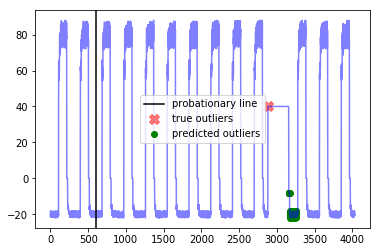




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655]


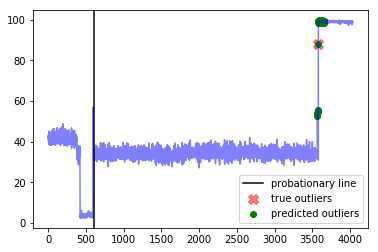




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


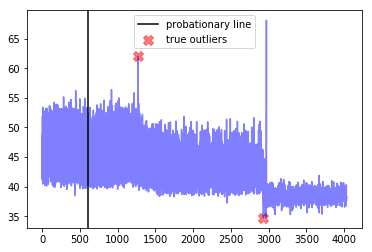




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [805, 810, 811, 820, 821, 827, 830, 832, 835, 843, 848, 851]


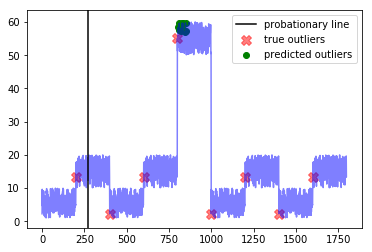

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  26.599999999999998
Best window threshold:  1.0
Corresponding window overall precision:  0.375
Corresponding window overall recall:  0.2222222222222222
Corresponding window overall F score:  0.27906976744186046



--- grok_asg_anomaly ---
Corresponding window precision:  0.25
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  3
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 860, 874, 966, 3753, 3754, 3755, 3757, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793, 3797, 3799, 3800, 3802, 3804, 3806, 3808, 3809, 3811, 3813, 3814, 3817, 3818, 3820, 3824, 3826, 3827, 3830, 3831, 3833, 3835, 3837, 3838, 3840, 3842, 3844, 3847, 3849, 3851, 3853, 3855]


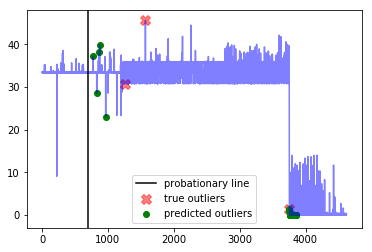




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3294, 3295, 3296, 3297, 3298, 3299, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313, 3314, 3315, 3316, 3317, 3318, 3319, 3320, 3321, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332, 3333, 3334, 3335, 3336, 3337, 3338, 3339, 3340, 3341, 3342, 3343, 3344, 3345, 3346, 3347, 3348, 3349, 3350, 3351, 3352, 3353, 3354, 3355]


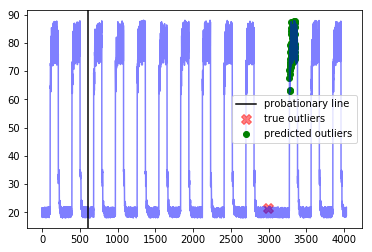




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


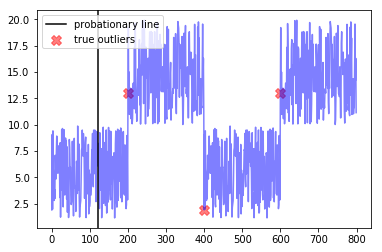




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


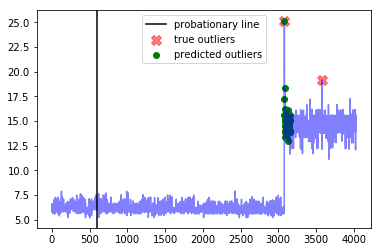




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


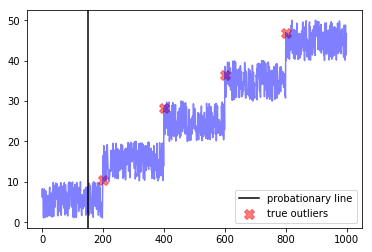




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

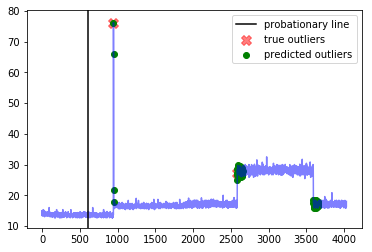




--- art_daily_flatmiddle ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3156, 3157, 3158, 3159, 3160, 3161, 3162, 3163, 3164, 3165, 3166, 3167, 3168, 3169, 3170, 3171, 3172, 3173, 3174, 3175, 3176, 3177, 3178, 3179, 3180, 3181, 3182, 3183, 3184, 3185, 3186, 3187, 3188, 3189, 3190, 3191, 3192, 3193, 3194, 3195, 3196, 3197, 3198, 3199, 3200, 3201, 3202, 3203, 3204, 3205, 3206, 3207, 3208, 3209, 3210, 3211, 3212, 3213, 3214, 3215, 3216, 3217, 3218, 3219, 3220, 3221, 3222, 3223, 3224, 3225, 3226, 3227, 3228, 3229, 3230, 3231, 3232, 3233, 3234, 3235, 3236, 3237, 3238, 3239, 3240, 3241, 3242, 3243, 3244, 3245, 3246, 3247, 3248, 3249, 3250, 3251, 3252, 3253, 3254, 3255]


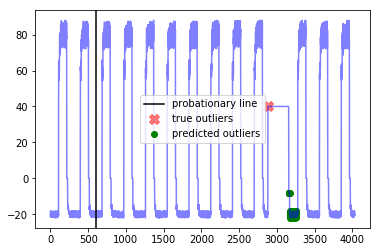




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655]


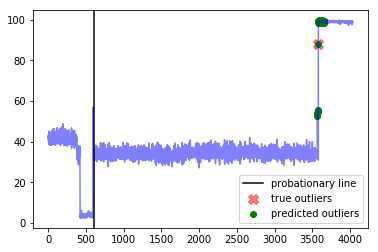




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


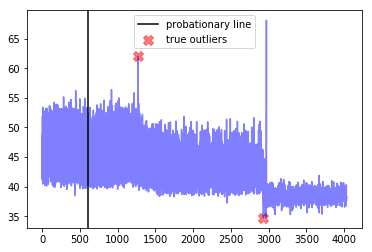




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [805, 810, 811, 820, 821, 827, 830, 832, 835, 843, 848, 851]


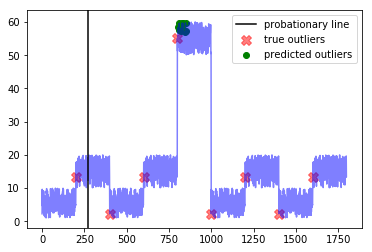

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  27.700000000000003
Best window threshold:  1.0
Corresponding window overall precision:  0.375
Corresponding window overall recall:  0.2222222222222222
Corresponding window overall F score:  0.27906976744186046



--- grok_asg_anomaly ---
Corresponding window precision:  0.25
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  3
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 860, 874, 966, 3753, 3754, 3755, 3757, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793, 3797, 3799, 3800, 3802, 3804, 3806, 3808, 3809, 3811, 3813, 3814, 3817, 3818, 3820, 3824, 3826, 3827, 3830, 3831, 3833, 3835, 3837, 3838, 3840, 3842, 3844, 3847, 3849, 3851, 3853, 3855]


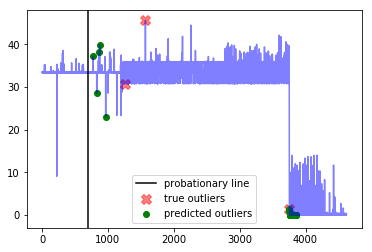




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3294, 3295, 3296, 3297, 3298, 3299, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313, 3314, 3315, 3316, 3317, 3318, 3319, 3320, 3321, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332, 3333, 3334, 3335, 3336, 3337, 3338, 3339, 3340, 3341, 3342, 3343, 3344, 3345, 3346, 3347, 3348, 3349, 3350, 3351, 3352, 3353, 3354, 3355]


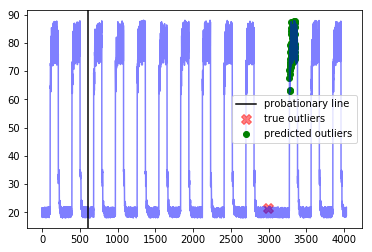




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


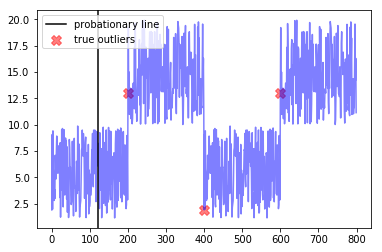




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


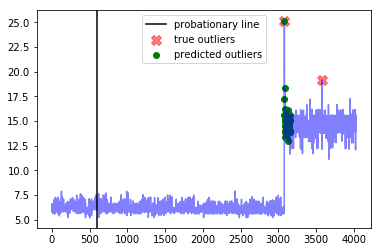




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


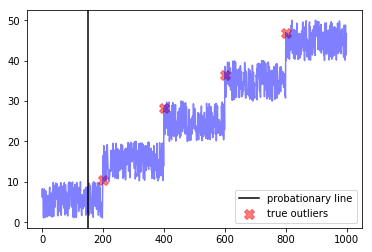




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

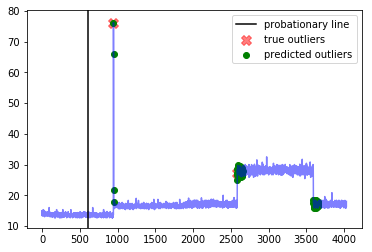




--- art_daily_flatmiddle ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3156, 3157, 3158, 3159, 3160, 3161, 3162, 3163, 3164, 3165, 3166, 3167, 3168, 3169, 3170, 3171, 3172, 3173, 3174, 3175, 3176, 3177, 3178, 3179, 3180, 3181, 3182, 3183, 3184, 3185, 3186, 3187, 3188, 3189, 3190, 3191, 3192, 3193, 3194, 3195, 3196, 3197, 3198, 3199, 3200, 3201, 3202, 3203, 3204, 3205, 3206, 3207, 3208, 3209, 3210, 3211, 3212, 3213, 3214, 3215, 3216, 3217, 3218, 3219, 3220, 3221, 3222, 3223, 3224, 3225, 3226, 3227, 3228, 3229, 3230, 3231, 3232, 3233, 3234, 3235, 3236, 3237, 3238, 3239, 3240, 3241, 3242, 3243, 3244, 3245, 3246, 3247, 3248, 3249, 3250, 3251, 3252, 3253, 3254, 3255]


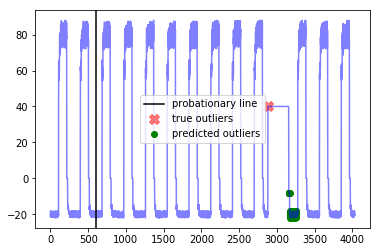




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655]


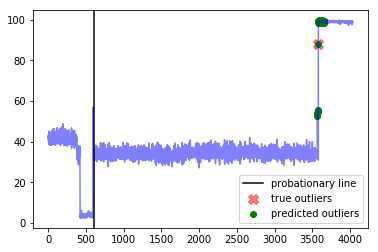




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


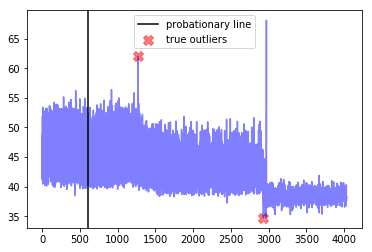




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [805, 810, 811, 820, 821, 827, 830, 832, 835, 843, 848, 851]


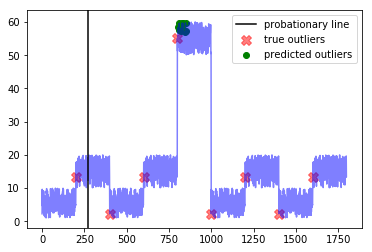

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  28.800000000000004
Best window threshold:  1.0
Corresponding window overall precision:  0.375
Corresponding window overall recall:  0.2222222222222222
Corresponding window overall F score:  0.27906976744186046



--- grok_asg_anomaly ---
Corresponding window precision:  0.25
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  3
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 860, 874, 966, 3753, 3754, 3755, 3757, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793, 3797, 3799, 3800, 3802, 3804, 3806, 3808, 3809, 3811, 3813, 3814, 3817, 3818, 3820, 3824, 3826, 3827, 3830, 3831, 3833, 3835, 3837, 3838, 3840, 3842, 3844, 3847, 3849, 3851, 3853, 3855]


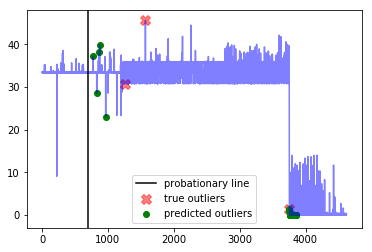




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3294, 3295, 3296, 3297, 3298, 3299, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313, 3314, 3315, 3316, 3317, 3318, 3319, 3320, 3321, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332, 3333, 3334, 3335, 3336, 3337, 3338, 3339, 3340, 3341, 3342, 3343, 3344, 3345, 3346, 3347, 3348, 3349, 3350, 3351, 3352, 3353, 3354, 3355]


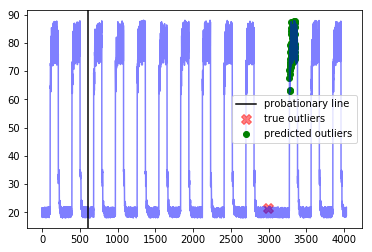




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


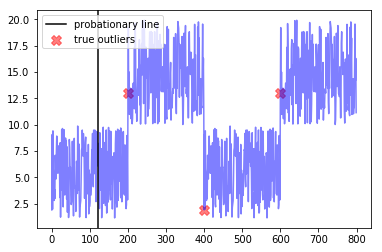




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


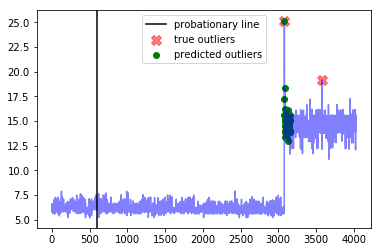




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


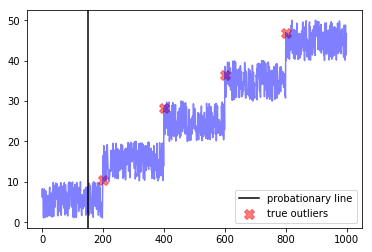




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

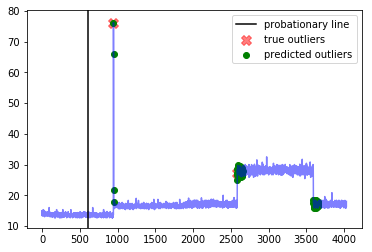




--- art_daily_flatmiddle ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3156, 3157, 3158, 3159, 3160, 3161, 3162, 3163, 3164, 3165, 3166, 3167, 3168, 3169, 3170, 3171, 3172, 3173, 3174, 3175, 3176, 3177, 3178, 3179, 3180, 3181, 3182, 3183, 3184, 3185, 3186, 3187, 3188, 3189, 3190, 3191, 3192, 3193, 3194, 3195, 3196, 3197, 3198, 3199, 3200, 3201, 3202, 3203, 3204, 3205, 3206, 3207, 3208, 3209, 3210, 3211, 3212, 3213, 3214, 3215, 3216, 3217, 3218, 3219, 3220, 3221, 3222, 3223, 3224, 3225, 3226, 3227, 3228, 3229, 3230, 3231, 3232, 3233, 3234, 3235, 3236, 3237, 3238, 3239, 3240, 3241, 3242, 3243, 3244, 3245, 3246, 3247, 3248, 3249, 3250, 3251, 3252, 3253, 3254, 3255]


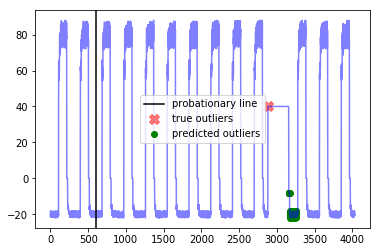




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655]


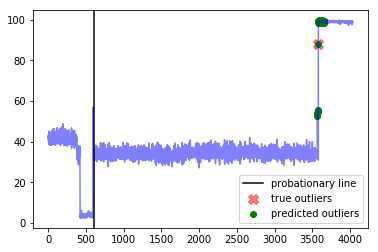




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


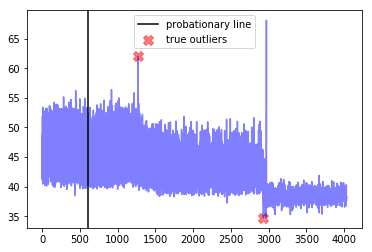




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [805, 810, 811, 820, 821, 827, 830, 832, 835, 843, 848, 851]


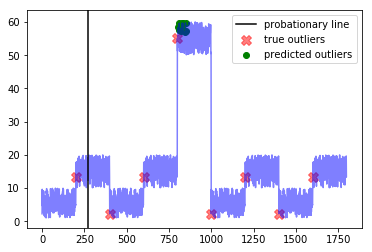

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  29.9
Best window threshold:  1.0
Corresponding window overall precision:  0.375
Corresponding window overall recall:  0.2222222222222222
Corresponding window overall F score:  0.27906976744186046



--- grok_asg_anomaly ---
Corresponding window precision:  0.25
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  3
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 860, 874, 966, 3753, 3754, 3755, 3757, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793, 3797, 3799, 3800, 3802, 3804, 3806, 3808, 3809, 3811, 3813, 3814, 3817, 3818, 3820, 3824, 3826, 3827, 3830, 3831, 3833, 3835, 3837, 3838, 3840, 3842, 3844, 3847, 3849, 3851, 3853, 3855]


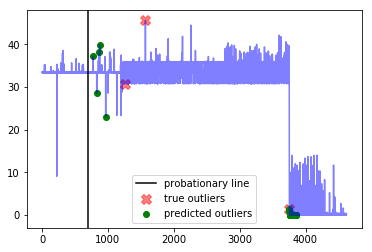




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3294, 3295, 3296, 3297, 3298, 3299, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313, 3314, 3315, 3316, 3317, 3318, 3319, 3320, 3321, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332, 3333, 3334, 3335, 3336, 3337, 3338, 3339, 3340, 3341, 3342, 3343, 3344, 3345, 3346, 3347, 3348, 3349, 3350, 3351, 3352, 3353, 3354, 3355]


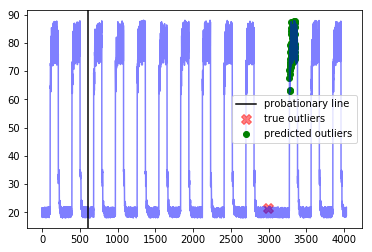




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


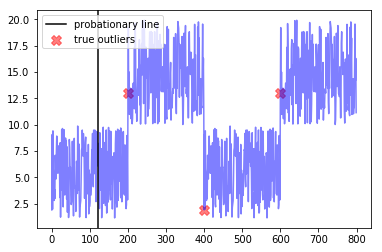




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


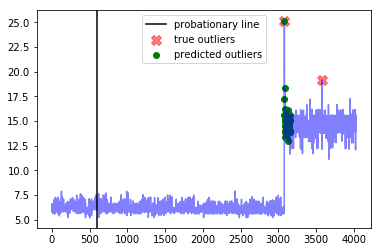




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


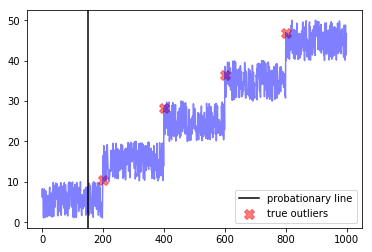




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

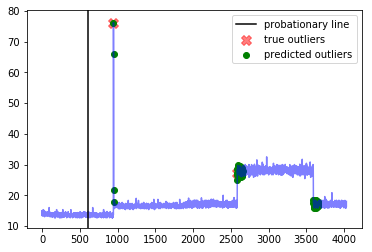




--- art_daily_flatmiddle ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3156, 3157, 3158, 3159, 3160, 3161, 3162, 3163, 3164, 3165, 3166, 3167, 3168, 3169, 3170, 3171, 3172, 3173, 3174, 3175, 3176, 3177, 3178, 3179, 3180, 3181, 3182, 3183, 3184, 3185, 3186, 3187, 3188, 3189, 3190, 3191, 3192, 3193, 3194, 3195, 3196, 3197, 3198, 3199, 3200, 3201, 3202, 3203, 3204, 3205, 3206, 3207, 3208, 3209, 3210, 3211, 3212, 3213, 3214, 3215, 3216, 3217, 3218, 3219, 3220, 3221, 3222, 3223, 3224, 3225, 3226, 3227, 3228, 3229, 3230, 3231, 3232, 3233, 3234, 3235, 3236, 3237, 3238, 3239, 3240, 3241, 3242, 3243, 3244, 3245, 3246, 3247, 3248, 3249, 3250, 3251, 3252, 3253, 3254, 3255]


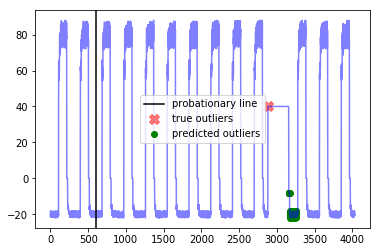




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655]


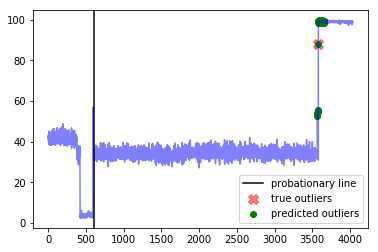




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


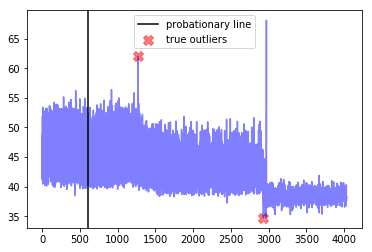




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [805, 810, 811, 820, 821, 827, 830, 832, 835, 843, 848, 851]


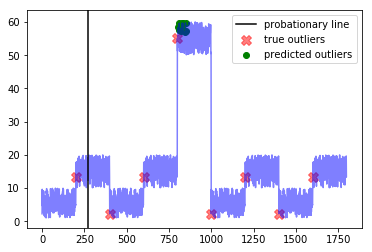

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  31.0
Best window threshold:  1.0
Corresponding window overall precision:  0.375
Corresponding window overall recall:  0.2222222222222222
Corresponding window overall F score:  0.27906976744186046



--- grok_asg_anomaly ---
Corresponding window precision:  0.25
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  3
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [772, 830, 860, 874, 966, 3753, 3754, 3755, 3757, 3759, 3761, 3762, 3764, 3766, 3767, 3770, 3772, 3773, 3776, 3777, 3779, 3781, 3783, 3785, 3789, 3791, 3793, 3797, 3799, 3800, 3802, 3804, 3806, 3808, 3809, 3811, 3813, 3814, 3817, 3818, 3820, 3824, 3826, 3827, 3830, 3831, 3833, 3835, 3837, 3838, 3840, 3842, 3844, 3847, 3849, 3851, 3853, 3855]


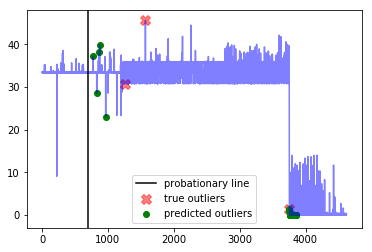




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3276, 3277, 3278, 3279, 3280, 3281, 3282, 3283, 3284, 3285, 3286, 3287, 3288, 3289, 3290, 3291, 3292, 3293, 3294, 3295, 3296, 3297, 3298, 3299, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313, 3314, 3315, 3316, 3317, 3318, 3319, 3320, 3321, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332, 3333, 3334, 3335, 3336, 3337, 3338, 3339, 3340, 3341, 3342, 3343, 3344, 3345, 3346, 3347, 3348, 3349, 3350, 3351, 3352, 3353, 3354, 3355]


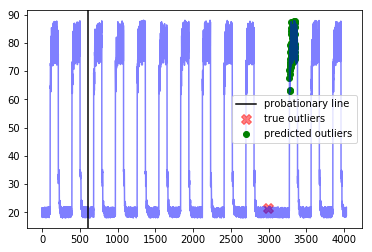




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


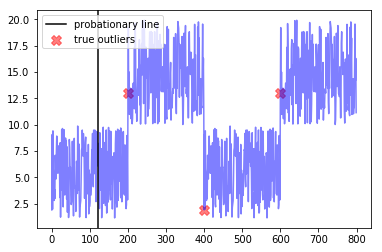




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144, 3145, 3146, 3147, 3148, 3149, 3150, 3151, 3152, 3153, 3154, 3155]


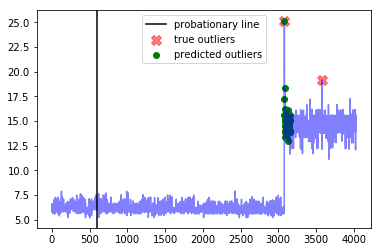




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


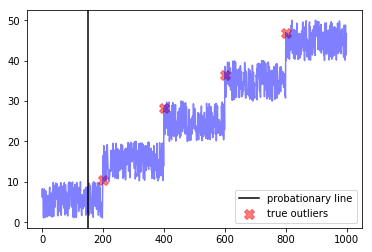




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 364

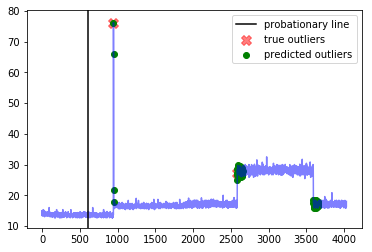




--- art_daily_flatmiddle ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3156, 3157, 3158, 3159, 3160, 3161, 3162, 3163, 3164, 3165, 3166, 3167, 3168, 3169, 3170, 3171, 3172, 3173, 3174, 3175, 3176, 3177, 3178, 3179, 3180, 3181, 3182, 3183, 3184, 3185, 3186, 3187, 3188, 3189, 3190, 3191, 3192, 3193, 3194, 3195, 3196, 3197, 3198, 3199, 3200, 3201, 3202, 3203, 3204, 3205, 3206, 3207, 3208, 3209, 3210, 3211, 3212, 3213, 3214, 3215, 3216, 3217, 3218, 3219, 3220, 3221, 3222, 3223, 3224, 3225, 3226, 3227, 3228, 3229, 3230, 3231, 3232, 3233, 3234, 3235, 3236, 3237, 3238, 3239, 3240, 3241, 3242, 3243, 3244, 3245, 3246, 3247, 3248, 3249, 3250, 3251, 3252, 3253, 3254, 3255]


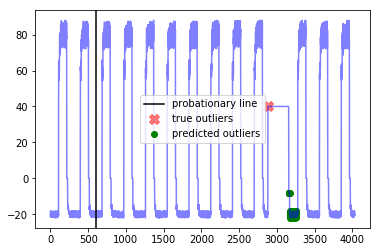




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655]


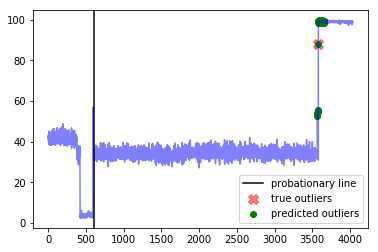




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


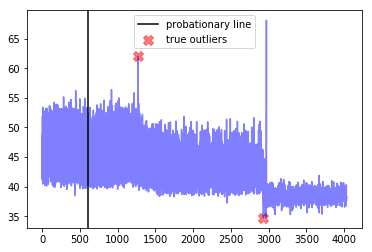




--- artificial_cd_2 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.125
Corresponding window false positives:  2
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [805, 810, 811, 820, 821, 827, 830, 832, 835, 843, 848, 851]


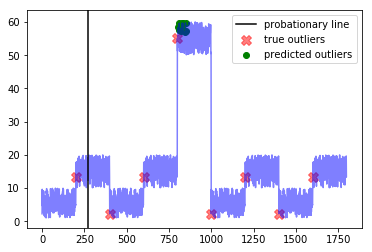

------------
False Positive Weight:  0.1
	 Corresponding window overall recall : 0.5925925925925926
	 Corresponding window overall F score : 0.2990654205607477
	 Best window threshold : 0.9994
	 Minimum number of mistakes : 16.0
	 Corresponding window overall precision : 0.2
False Positive Weight:  0.2
	 Corresponding window overall recall : 0.5925925925925926
	 Corresponding window overall F score : 0.2990654205607477
	 Best window threshold : 0.9994
	 Minimum number of mistakes : 21.0
	 Corresponding window overall precision : 0.2
False Positive Weight:  0.3
	 Corresponding window overall recall : 0.2222222222222222
	 Corresponding window overall F score : 0.27906976744186046
	 Best window threshold : 1.0
	 Minimum number of mistakes : 23.3
	 Corresponding window overall precision : 0.375
False Positive Weight:  0.6
	 Corresponding window overall recall : 0.2222222222222222
	 Corresponding window overall F score : 0.27906976744186046
	 Best window threshold : 1.0
	 Minimum number of 

In [17]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# HOTSAX results

In [35]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_htm = joblib.load("anomaly_scores/hotsax/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_htm["Anomaly Scores"]

In [36]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.0, 'recall': 0.0},
 0.2: {'precision': 0.0, 'recall': 0.0},
 0.3: {'precision': 0.0, 'recall': 0.0},
 0.4: {'precision': 0.0, 'recall': 0.0},
 0.5: {'precision': 0.0, 'recall': 0.0},
 0.6: {'precision': 0.0, 'recall': 0.0},
 0.7: {'precision': 0.0, 'recall': 0.0},
 0.8: {'precision': 0.0, 'recall': 0.0},
 0.9: {'precision': 0.0, 'recall': 0.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.999999999999996
Best window threshold:  0.0001
Corresponding window overall precision:  0.4666666666666667
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.33333333333333337



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


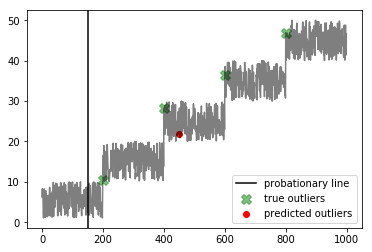




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


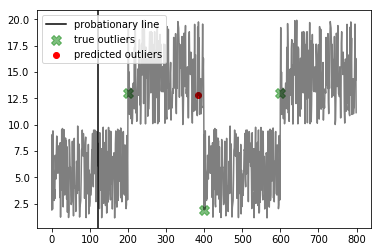




--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [715, 1658]


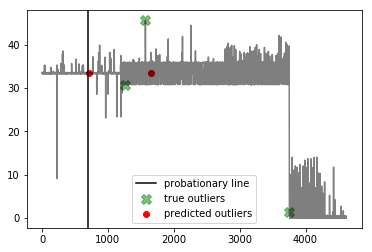




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [741, 2583]


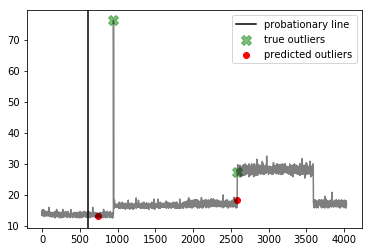




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2660, 3072]


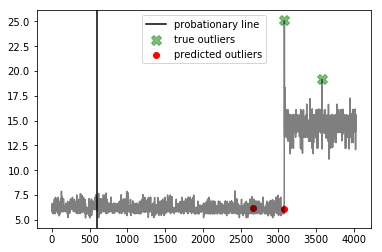




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3972]


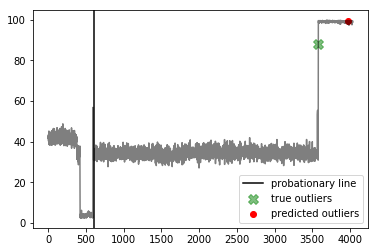




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2840]


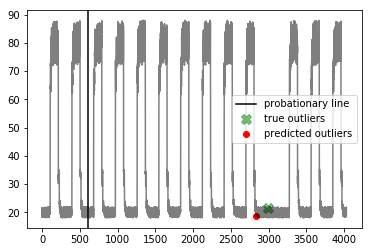




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1435, 2956]


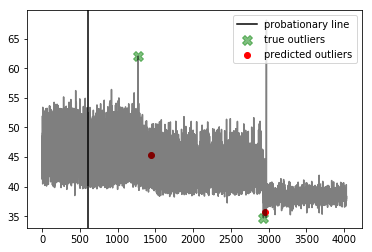




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881]


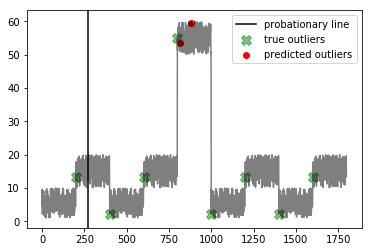




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2174, 3505]


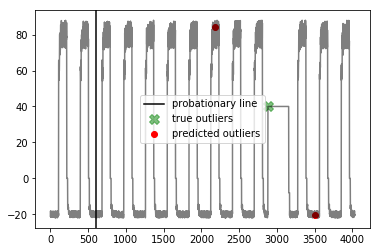

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  22.999999999999996
Best window threshold:  0.0001
Corresponding window overall precision:  0.4666666666666667
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.33333333333333337



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


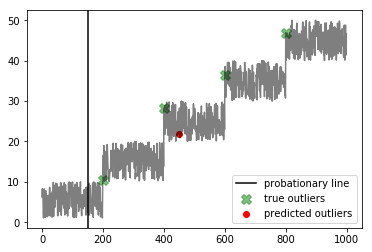




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


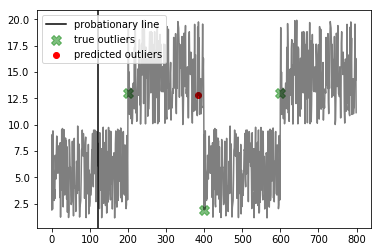




--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [715, 1658]


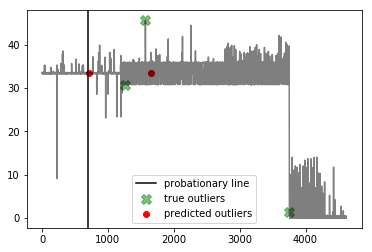




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [741, 2583]


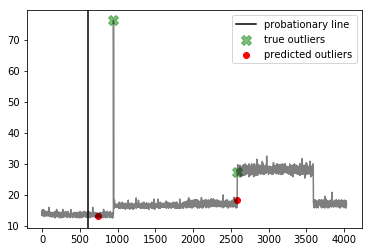




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2660, 3072]


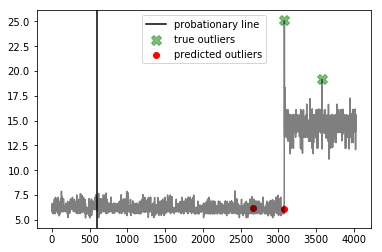




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3972]


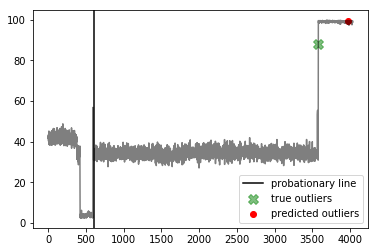




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2840]


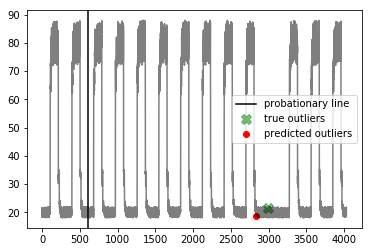




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1435, 2956]


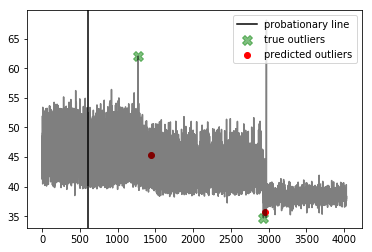




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881]


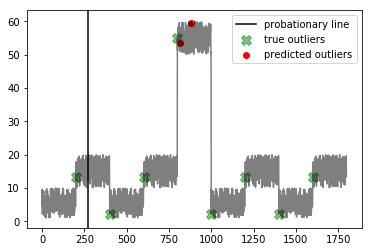




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2174, 3505]


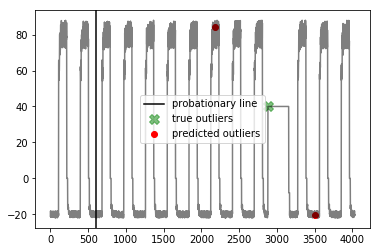

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  24.000000000000004
Best window threshold:  0.0001
Corresponding window overall precision:  0.4666666666666667
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.33333333333333337



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


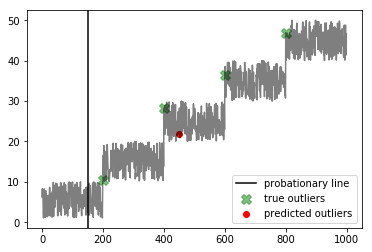




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


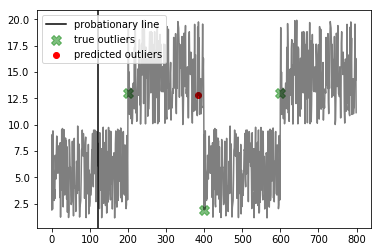




--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [715, 1658]


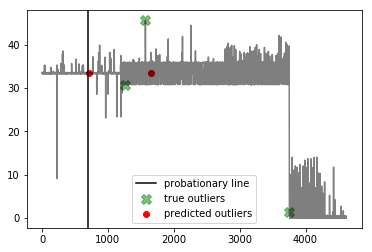




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [741, 2583]


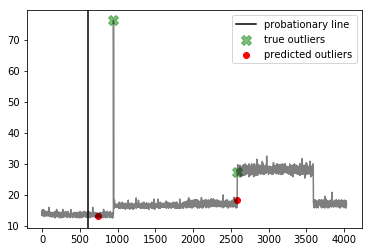




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2660, 3072]


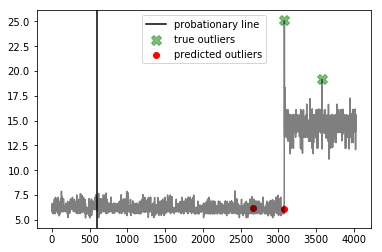




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3972]


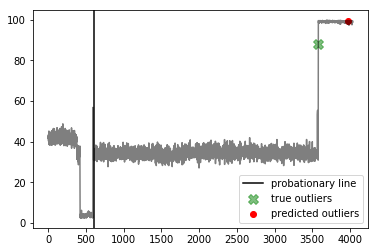




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2840]


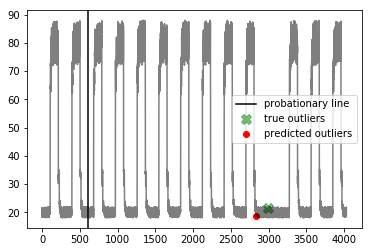




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1435, 2956]


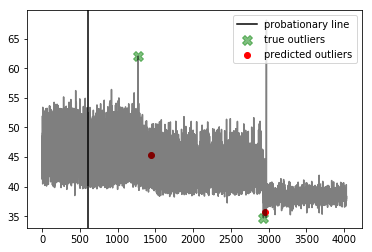




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881]


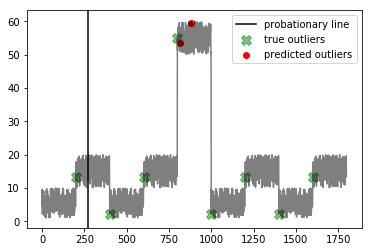




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2174, 3505]


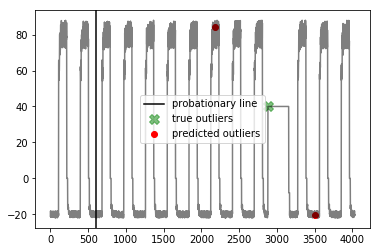

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  25.000000000000004
Best window threshold:  0.0001
Corresponding window overall precision:  0.4666666666666667
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.33333333333333337



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


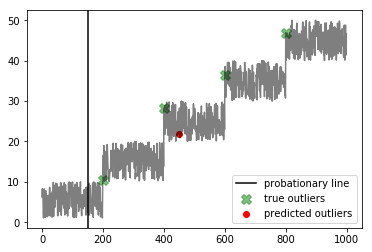




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


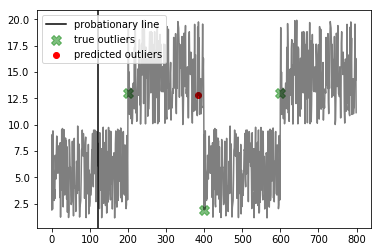




--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [715, 1658]


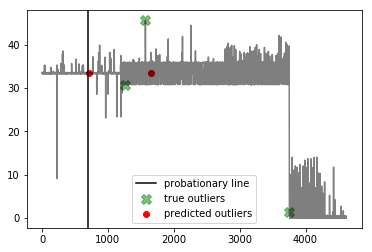




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [741, 2583]


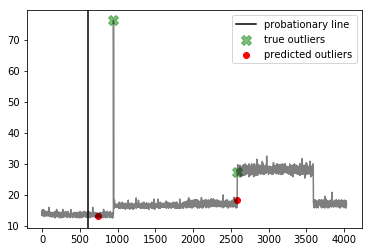




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2660, 3072]


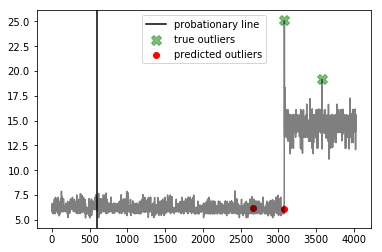




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3972]


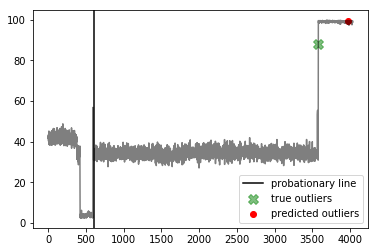




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2840]


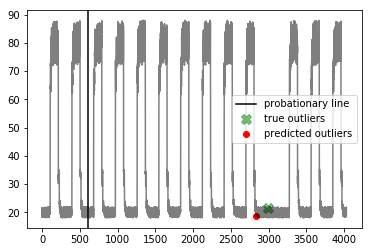




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1435, 2956]


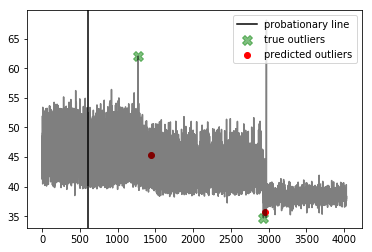




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881]


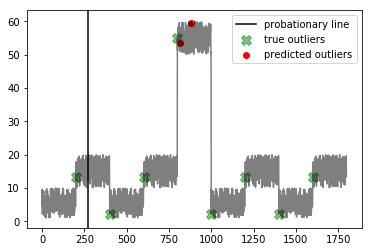




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2174, 3505]


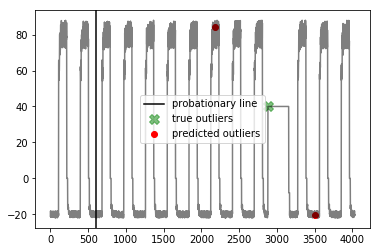

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  26.0
Best window threshold:  0.0001
Corresponding window overall precision:  0.4666666666666667
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.33333333333333337



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


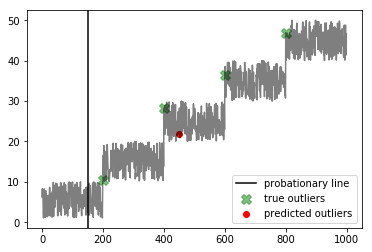




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


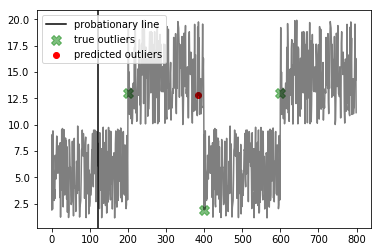




--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [715, 1658]


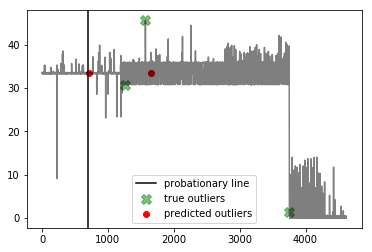




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [741, 2583]


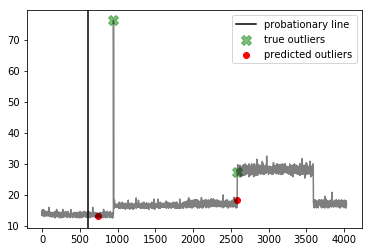




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2660, 3072]


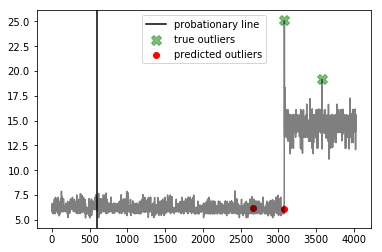




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3972]


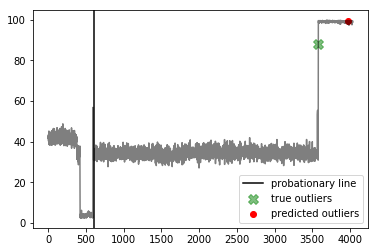




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2840]


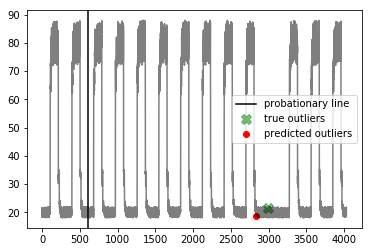




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1435, 2956]


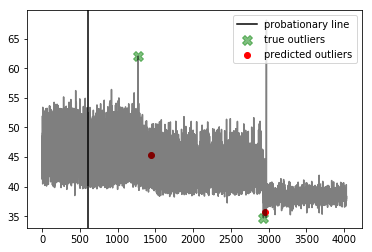




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881]


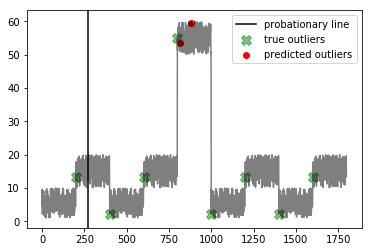




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2174, 3505]


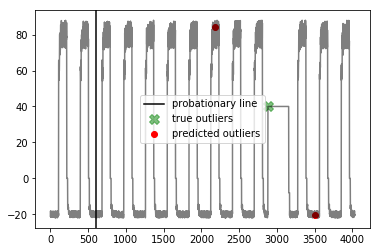

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  26.999999999999996
Best window threshold:  0.0001
Corresponding window overall precision:  0.4666666666666667
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.33333333333333337



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


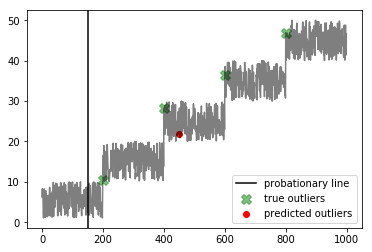




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


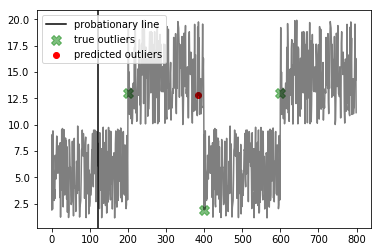




--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [715, 1658]


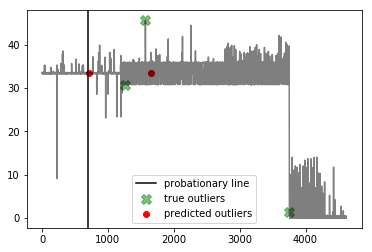




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [741, 2583]


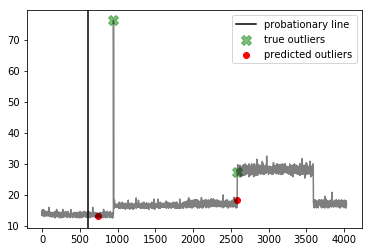




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2660, 3072]


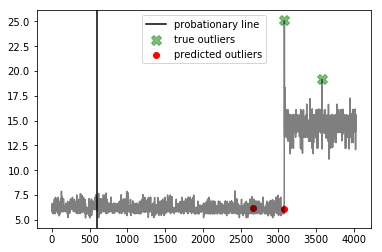




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3972]


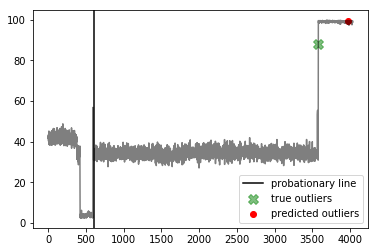




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2840]


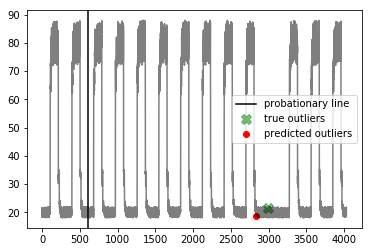




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1435, 2956]


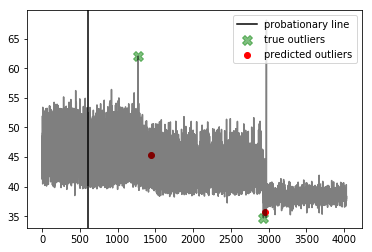




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881]


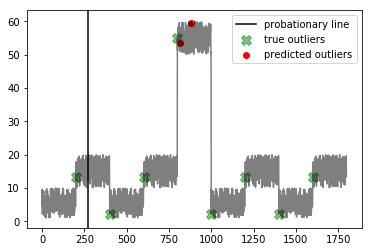




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2174, 3505]


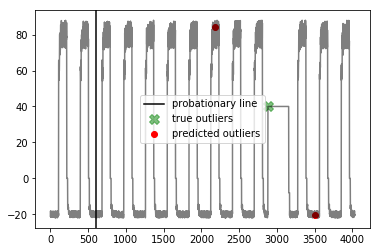

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  28.0
Best window threshold:  0.0001
Corresponding window overall precision:  0.4666666666666667
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.33333333333333337



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


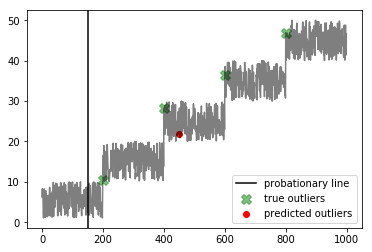




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


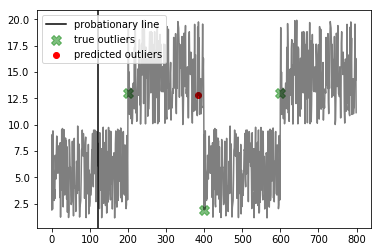




--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [715, 1658]


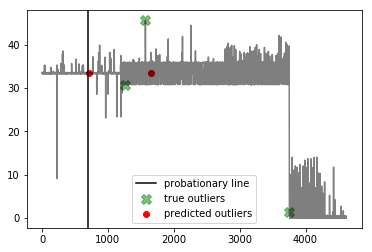




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [741, 2583]


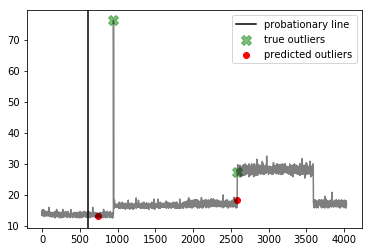




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2660, 3072]


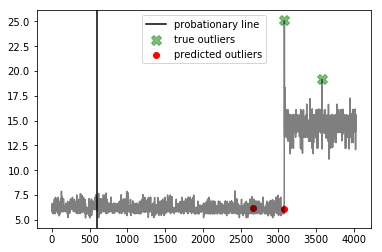




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3972]


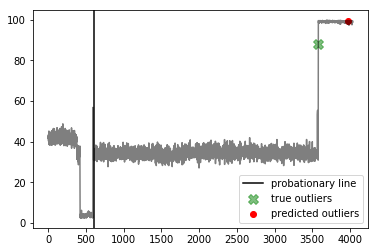




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2840]


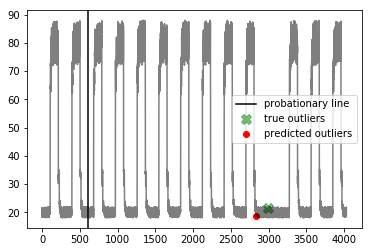




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1435, 2956]


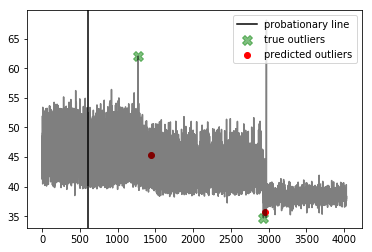




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881]


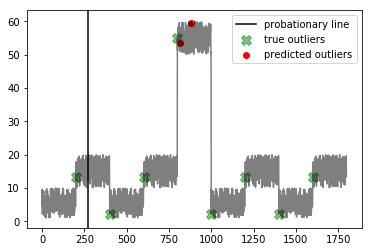




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2174, 3505]


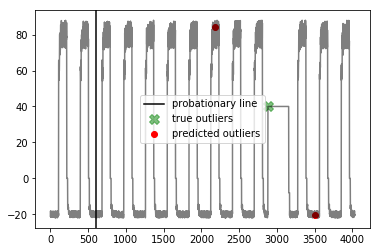

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  29.0
Best window threshold:  0.0001
Corresponding window overall precision:  0.4666666666666667
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.33333333333333337



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


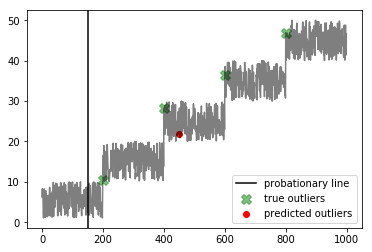




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


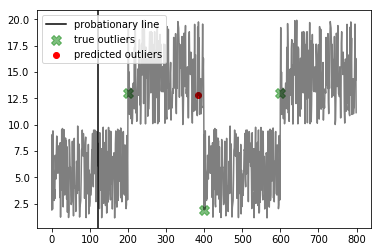




--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [715, 1658]


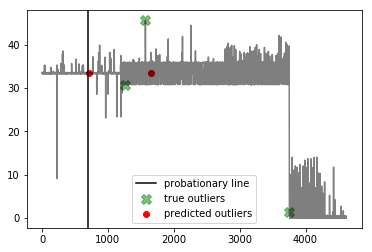




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [741, 2583]


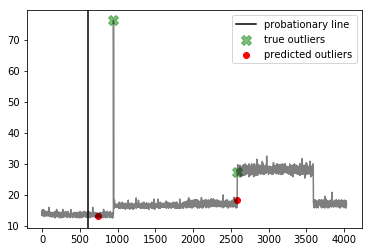




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2660, 3072]


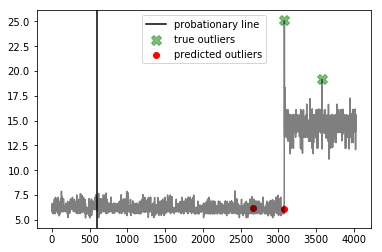




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3972]


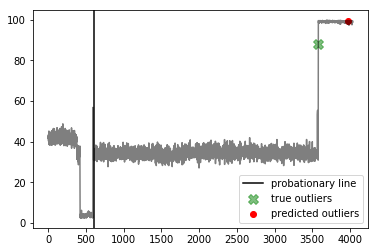




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2840]


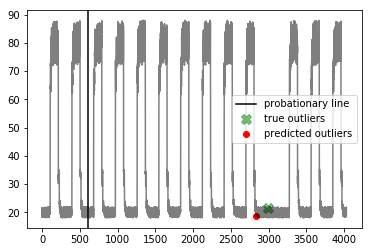




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1435, 2956]


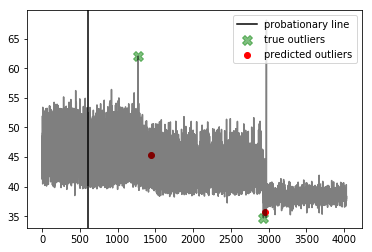




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881]


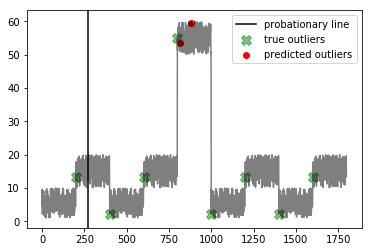




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2174, 3505]


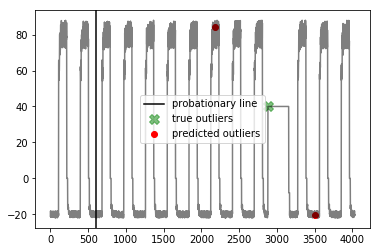

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  30.000000000000004
Best window threshold:  0.0001
Corresponding window overall precision:  0.4666666666666667
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.33333333333333337



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


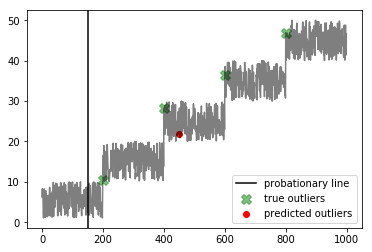




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


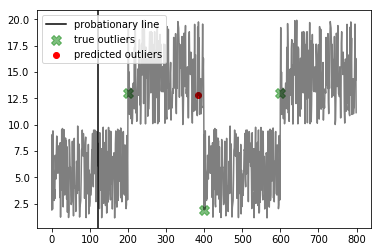




--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [715, 1658]


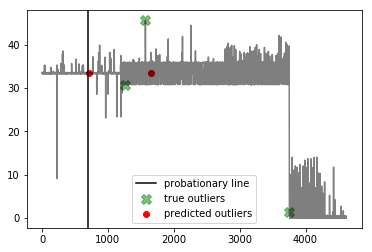




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [741, 2583]


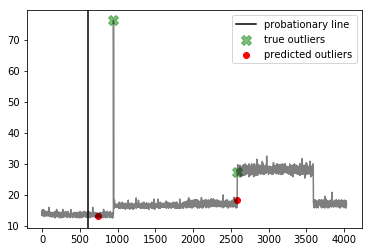




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2660, 3072]


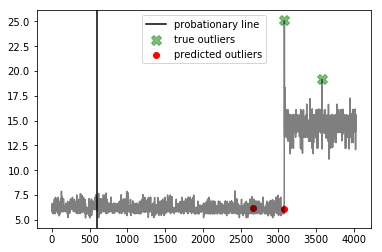




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3972]


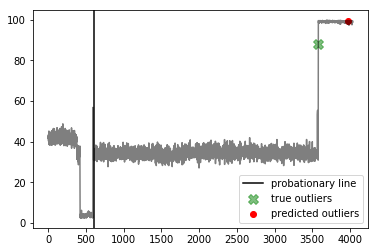




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2840]


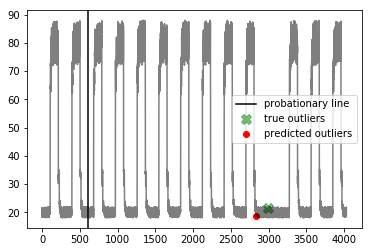




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1435, 2956]


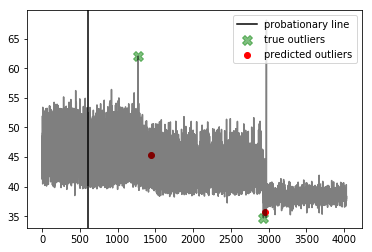




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881]


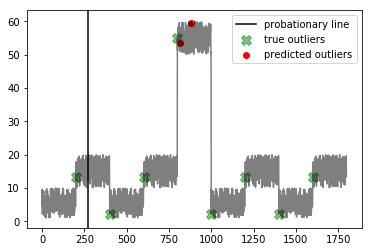




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2174, 3505]


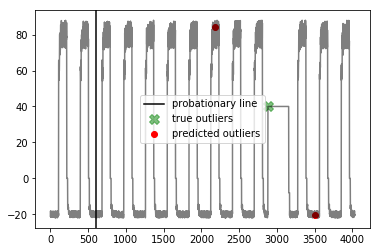

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  31.0
Best window threshold:  0.0001
Corresponding window overall precision:  0.4666666666666667
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.33333333333333337



--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


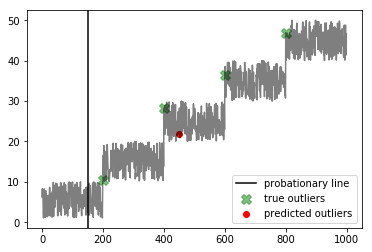




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


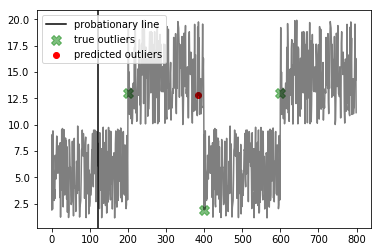




--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [715, 1658]


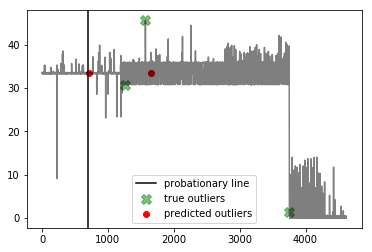




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [741, 2583]


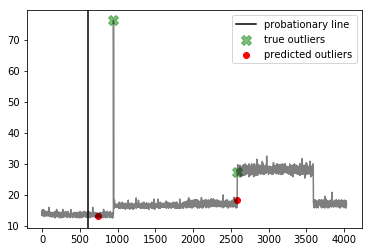




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2660, 3072]


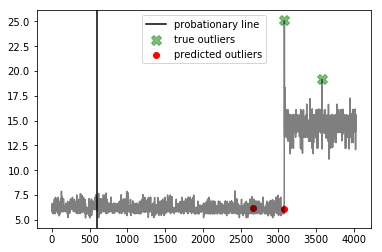




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3972]


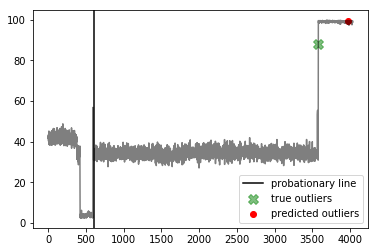




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2840]


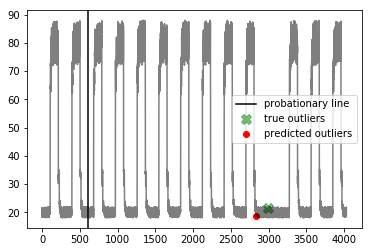




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1435, 2956]


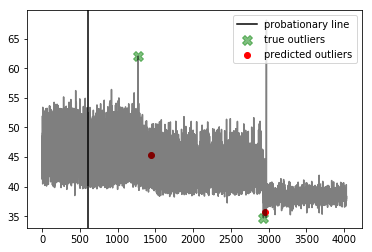




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881]


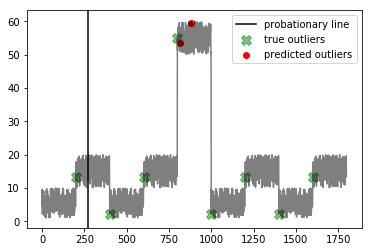




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2174, 3505]


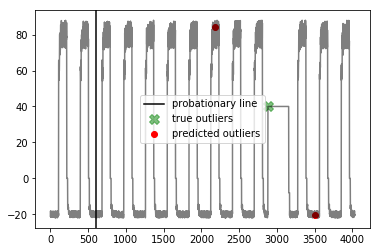

------------
False Positive Weight:  0.1
	 Corresponding window overall F score : 0.33333333333333337
	 Corresponding window overall recall : 0.25925925925925924
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.4666666666666667
	 Minimum number of mistakes : 21.999999999999996
False Positive Weight:  0.2
	 Corresponding window overall F score : 0.33333333333333337
	 Corresponding window overall recall : 0.25925925925925924
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.4666666666666667
	 Minimum number of mistakes : 22.999999999999996
False Positive Weight:  0.3
	 Corresponding window overall F score : 0.33333333333333337
	 Corresponding window overall recall : 0.25925925925925924
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.4666666666666667
	 Minimum number of mistakes : 24.000000000000004
False Positive Weight:  0.6
	 Corresponding window overall F score : 0.33333333333333337
	 Corresponding 

In [37]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# NAB Score

    1. make a python 2.7 virtual environment
    2. pip install pandas
    3. git clone NAB
    4. pip install . in NAB

To obtain NAB scores for every method on the concept drift datasets, we must do the following:

# Have a new dataset?

1. add the new dataset csv with timestamp, value in respective folder in data folder. no missing time steps allowed

2. add the point anomaly dates to combined_labels.json in labels folder

3. add the anomaly windows to combined_windows.json  (start and end dates)

4. in results/null, include null_datasetname.csv with timestamp, value, label, and anomaly_score (all .5). You can just use the adclasses.create_result_csv function and delete irrelevant columns and fill anomaly_score with all .5s

WARNING: Some datasets we use are already in NAB, but they have missing time steps. Replace the dataset csv in the data folder with a prefilled version as the anomaly scores we use assume no missing time steps. You can just use the adclasses.create_result_csv function and delete irrelevant columns

In [39]:
dataset_name = "artificial_cd_1"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]


d = timedelta(minutes=5)
for outlier_date in true_outlier_dates:
    print(adclasses.get_window_ends(outlier_date, 
                                    ad.get_length(), 
                                    len(true_outlier_dates), 
                                    ad.get_dateformat(), d))

Start date:  2014-04-01 00:00:00
End date:  2014-04-03 18:35:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  800
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-03 18:35:00
Date Format:  %Y-%m-%d %H:%M:%S
(Timestamp('2014-04-01 15:35:00'), Timestamp('2014-04-01 17:45:00'))
(Timestamp('2014-04-02 08:15:00'), Timestamp('2014-04-02 10:25:00'))
(Timestamp('2014-04-03 00:55:00'), Timestamp('2014-04-03 03:05:00'))


In [40]:
dataset_name = "artificial_cd_2"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]

d = timedelta(minutes=5)
for outlier_date in true_outlier_dates:
    print(adclasses.get_window_ends(outlier_date, 
                                    ad.get_length(), 
                                    len(true_outlier_dates), 
                                    ad.get_dateformat(), d))

Start date:  2014-04-01 00:00:00
End date:  2014-04-07 05:55:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  1800
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-07 05:55:00
Date Format:  %Y-%m-%d %H:%M:%S
(Timestamp('2014-04-01 15:45:00'), Timestamp('2014-04-01 17:35:00'))
(Timestamp('2014-04-02 08:25:00'), Timestamp('2014-04-02 10:15:00'))
(Timestamp('2014-04-03 01:05:00'), Timestamp('2014-04-03 02:55:00'))
(Timestamp('2014-04-03 17:45:00'), Timestamp('2014-04-03 19:35:00'))
(Timestamp('2014-04-04 10:25:00'), Timestamp('2014-04-04 12:15:00'))
(Timestamp('2014-04-05 03:05:00'), Timestamp('2014-04-05 04:55:00'))
(Timestamp('2014-04-05 19:45:00'), Timestamp('2014-04-05 21:35:00'))
(Timestamp('2014-04-06 12:25:00'), Timestamp('2014-04-06 14:15:00'))


In [41]:
dataset_name = "artificial_cd_3"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))


ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]

d = timedelta(minutes=5)
for outlier_date in true_outlier_dates:
    print(adclasses.get_window_ends(outlier_date, 
                                    ad.get_length(), 
                                    len(true_outlier_dates), 
                                    ad.get_dateformat(), d))

Start date:  2014-04-01 00:00:00
End date:  2014-04-04 11:15:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  1000
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-04 11:15:00
Date Format:  %Y-%m-%d %H:%M:%S
(Timestamp('2014-04-01 15:40:00'), Timestamp('2014-04-01 17:40:00'))
(Timestamp('2014-04-02 08:20:00'), Timestamp('2014-04-02 10:20:00'))
(Timestamp('2014-04-03 01:00:00'), Timestamp('2014-04-03 03:00:00'))
(Timestamp('2014-04-03 17:40:00'), Timestamp('2014-04-03 19:40:00'))


# For every anomaly detection method "method_name" and dataset "dataset_name", do the following:

0. clear up previous NAB/results/

1. $ python scripts/create_new_detector.py --detector method_name

this creates the method_name folder in results folder with a bunch of datasets folders that are empty. delete the irrelevant ones

2. for every characteristic relevant dataset, create csvs with columns like so: timestamp, value, anomaly_score, label. place in appropriate locations in results/method_name/

3. replace datasets with prefill

4. $ python run.py -d method_name --optimize --score --normalize

WARNING: HAVE TO MAKE CHANGE TO NAB function convertAnomalyScoresToDetections in util.py bc it will think values are strings

In [17]:
prepath="/pathtonab/NAB/results/"

# SARIMA

Final score for 'SARIMA' detector on 'all_reward_low_FP_rate' profile = 42.59

Final score for 'SARIMA' detector on 'all_reward_low_FN_rate' profile = 60.17

Final score for 'SARIMA' detector on 'all_standard' profile = 45.53


In [43]:
folder="realAWSCloudwatch"
method_name = "SARIMA_all"
dataset_name = "grok_asg_anomaly"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-01-20 08:30:00",
                      "2014-01-21 10:45:00",
                      "2014-01-29 00:45:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "SARIMA_all"
dataset_name = "rds_cpu_utilization_cc0c53"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-25 07:15:00",
                      "2014-02-27 00:50:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "SARIMA_all"
dataset_name = "rds_cpu_utilization_e47b3b"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-13 06:52:00",
                      "2014-04-18 23:37:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "SARIMA_all"
dataset_name = "art_daily_flatmiddle"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 00:00:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "SARIMA_all"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "SARIMA_all"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]


adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "SARIMA_all"
dataset_name = "art_daily_nojump"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 09:00:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "SARIMA_all"
dataset_name = "artificial_cd_1"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "SARIMA_all"
dataset_name = "artificial_cd_2"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "SARIMA_all"
dataset_name = "artificial_cd_3"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

# Prophet

Final score for 'Prophet' detector on 'reward_low_FP_rate' profile = 42.08

Final score for 'Prophet' detector on 'reward_low_FN_rate' profile = 58.43

Final score for 'Prophet' detector on 'standard' profile = 44.29


In [44]:
folder="realAWSCloudwatch"
method_name = "Prophet"
dataset_name = "grok_asg_anomaly"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-01-20 08:30:00",
                      "2014-01-21 10:45:00",
                      "2014-01-29 00:45:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "Prophet"
dataset_name = "rds_cpu_utilization_cc0c53"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-25 07:15:00",
                      "2014-02-27 00:50:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "Prophet"
dataset_name = "rds_cpu_utilization_e47b3b"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-13 06:52:00",
                      "2014-04-18 23:37:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "Prophet"
dataset_name = "art_daily_flatmiddle"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 00:00:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "Prophet"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "Prophet"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]


adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "Prophet"
dataset_name = "art_daily_nojump"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 09:00:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "Prophet"
dataset_name = "artificial_cd_1"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "Prophet"
dataset_name = "artificial_cd_2"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "Prophet"
dataset_name = "artificial_cd_3"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

#  RNN

Final score for 'RNN' detector on 'reward_low_FP_rate' profile = 38.33

Final score for 'RNN' detector on 'reward_low_FN_rate' profile = 53.71

Final score for 'RNN' detector on 'standard' profile = 39.77


In [18]:
folder="realAWSCloudwatch"
method_name = "RNN"
dataset_name = "grok_asg_anomaly"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-01-20 08:30:00",
                      "2014-01-21 10:45:00",
                      "2014-01-29 00:45:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "RNN"
dataset_name = "rds_cpu_utilization_cc0c53"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-25 07:15:00",
                      "2014-02-27 00:50:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "RNN"
dataset_name = "rds_cpu_utilization_e47b3b"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-13 06:52:00",
                      "2014-04-18 23:37:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "RNN"
dataset_name = "art_daily_flatmiddle"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 00:00:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "RNN"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "RNN"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]


adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "RNN"
dataset_name = "art_daily_nojump"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 09:00:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "RNN"
dataset_name = "artificial_cd_1"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "RNN"
dataset_name = "artificial_cd_2"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "RNN"
dataset_name = "artificial_cd_3"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

# HTM

Final score for 'HTM' detector on 'reward_low_FP_rate' profile = 44.76

Final score for 'HTM' detector on 'reward_low_FN_rate' profile = 59.53

Final score for 'HTM' detector on 'standard' profile = 45.50

In [46]:
folder="realAWSCloudwatch"
method_name = "HTM"
dataset_name = "grok_asg_anomaly"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-01-20 08:30:00",
                      "2014-01-21 10:45:00",
                      "2014-01-29 00:45:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "HTM"
dataset_name = "rds_cpu_utilization_cc0c53"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-25 07:15:00",
                      "2014-02-27 00:50:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "HTM"
dataset_name = "rds_cpu_utilization_e47b3b"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-13 06:52:00",
                      "2014-04-18 23:37:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "HTM"
dataset_name = "art_daily_flatmiddle"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 00:00:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "HTM"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "HTM"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]


adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "HTM"
dataset_name = "art_daily_nojump"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 09:00:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "HTM"
dataset_name = "artificial_cd_1"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "HTM"
dataset_name = "artificial_cd_2"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "HTM"
dataset_name = "artificial_cd_3"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

# Donut

Final score for 'Donut' detector on 'reward_low_FP_rate' profile = 38.32

Final score for 'Donut' detector on 'reward_low_FN_rate' profile = 57.64

Final score for 'Donut' detector on 'standard' profile = 42.73


In [47]:
folder="realAWSCloudwatch"
method_name = "Donut"
dataset_name = "grok_asg_anomaly"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-01-20 08:30:00",
                      "2014-01-21 10:45:00",
                      "2014-01-29 00:45:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "Donut"
dataset_name = "rds_cpu_utilization_cc0c53"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-25 07:15:00",
                      "2014-02-27 00:50:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "Donut"
dataset_name = "rds_cpu_utilization_e47b3b"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-13 06:52:00",
                      "2014-04-18 23:37:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "Donut"
dataset_name = "art_daily_flatmiddle"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 00:00:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "Donut"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "Donut"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]


adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "Donut"
dataset_name = "art_daily_nojump"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 09:00:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "Donut"
dataset_name = "artificial_cd_1"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "Donut"
dataset_name = "artificial_cd_2"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "Donut"
dataset_name = "artificial_cd_3"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

# Windowed Gaussian

Final score for 'windowed' detector on 'gaussian_reward_low_FP_rate' profile = 39.74

Final score for 'windowed' detector on 'gaussian_reward_low_FN_rate' profile = 55.04

Final score for 'windowed' detector on 'gaussian_standard' profile = 41.46


In [49]:
folder="realAWSCloudwatch"
method_name = "windowed_gaussian"
dataset_name = "grok_asg_anomaly"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-01-20 08:30:00",
                      "2014-01-21 10:45:00",
                      "2014-01-29 00:45:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "windowed_gaussian"
dataset_name = "rds_cpu_utilization_cc0c53"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-25 07:15:00",
                      "2014-02-27 00:50:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "windowed_gaussian"
dataset_name = "rds_cpu_utilization_e47b3b"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-13 06:52:00",
                      "2014-04-18 23:37:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "windowed_gaussian"
dataset_name = "art_daily_flatmiddle"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 00:00:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "windowed_gaussian"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "windowed_gaussian"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]


adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "windowed_gaussian"
dataset_name = "art_daily_nojump"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 09:00:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "windowed_gaussian"
dataset_name = "artificial_cd_1"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "windowed_gaussian"
dataset_name = "artificial_cd_2"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "windowed_gaussian"
dataset_name = "artificial_cd_3"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

# HOTSAX

Final score for 'hotsax' detector on 'reward_low_FP_rate' profile = 37.84

Final score for 'hotsax' detector on 'reward_low_FN_rate' profile = 51.60

Final score for 'hotsax' detector on 'standard' profile = 38.29


In [50]:
folder="realAWSCloudwatch"
method_name = "hotsax"
dataset_name = "grok_asg_anomaly"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-01-20 08:30:00",
                      "2014-01-21 10:45:00",
                      "2014-01-29 00:45:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "hotsax"
dataset_name = "rds_cpu_utilization_cc0c53"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-25 07:15:00",
                      "2014-02-27 00:50:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "hotsax"
dataset_name = "rds_cpu_utilization_e47b3b"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-13 06:52:00",
                      "2014-04-18 23:37:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "hotsax"
dataset_name = "art_daily_flatmiddle"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 00:00:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "hotsax"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "hotsax"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]


adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "hotsax"
dataset_name = "art_daily_nojump"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 09:00:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "hotsax"
dataset_name = "artificial_cd_1"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "hotsax"
dataset_name = "artificial_cd_2"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "hotsax"
dataset_name = "artificial_cd_3"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]

adclasses.create_result_csv(prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###